# Tesco Large

In [1]:
#import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import datetime as dt
import statsmodels.api as sm 
import seaborn as sns
from scipy import stats
from sklearn.metrics import mean_squared_error
from math import sqrt

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.express as px

In [3]:
#import dataset - pladis products
mcv_dig_250g=pd.read_excel("Tesco Large/Tesco Large MCVTS DGSTVS 250G SNGL.xlsx")
mcv_dig_400g=pd.read_excel("Tesco others/new-Tesco Large MCVTS DGSTVS 400G SNGL.xlsx")
mcv_dig_400g_twin=pd.read_excel("Tesco others/new-Tesco Large MCVTS DGSTVS 400G 2PACK.xlsx")
mcv_rt_300g=pd.read_excel("Tesco Large/Tesco Large RCH T MCVTS RCH T PLN 300 GM SNGL.xlsx")
mcv_rt_300g_twin=pd.read_excel("Tesco Large/Tesco Large RCH T MCVTS RCH T PLN 300 GM 2 PCK.xlsx")

#import dataset - competitors products
tes_dig_400g=pd.read_excel("Tesco Large/Tesco Large (own label) TSC DGSTVS PLN 400 GM SNGL.xlsx")
tes_molly_400g=pd.read_excel("Tesco Large/missing - Tesco Large (own label) 'TSC-MS-MLL'S-DGSTV-BSCTS PLN 400 GM SNGL.xlsx")
tes_rt_250g=pd.read_excel("Tesco Large/Tesco Large (own label) RCH T TSC RCH T FNGRS PLN 250 GM SNGL.xlsx")
tes_rt_300g=pd.read_excel("Tesco Large/missing - Tesco Large (own label) RCH T TSC RCH T PLN 300 GM SNGL.xlsx")



## Exploration of the dataset 

In [4]:
pd.plotting.register_matplotlib_converters()

In [5]:
#need original dataset
def basic_info(df):
    # look at data
    display(df.head())

    # look a shape of data
    display(df.shape)

    # look at data types. Ideally look at all rows. 
    display(df.dtypes)
   
    # display descriptive statistics
    display(df.describe(percentiles=[0.25,0.5,0.75,0.95,0.99]))
    
    print('Dataset has: ' + str(len(df.index)) + 'rows')
    
    print('Missing values:') 
    print(df.isnull().sum())
    
    print('Screen out distribution>100:')
    print(df[df.Distribution>100].count(axis=0))
    
    print('Screen out negative data: ')
    print(df[df.iloc[:,1:8]<0].count(axis=0))
    

In [6]:
#put corresponding dataset file into lists
mcv_list=[mcv_dig_250g,mcv_dig_400g,mcv_dig_400g_twin,mcv_rt_300g,mcv_rt_300g_twin]
tes_list=[tes_dig_400g,tes_molly_400g,tes_rt_250g,tes_rt_300g]
tes_large=[mcv_dig_250g,mcv_dig_400g,mcv_dig_400g_twin,mcv_rt_300g,mcv_rt_300g_twin,
           tes_dig_400g,tes_molly_400g,tes_rt_250g,tes_rt_300g]

In [7]:
#transform date format and add quarter, week and month
tes_large1=[]

for df in tes_large:
#     df = DataFrame(data)
    df=df[:275]
    date_time = df['SDESC'].str[3:]
    date_time=pd.to_datetime(date_time, format='%d.%m.%y')
    df['SDESC']=date_time
    df=df.dropna()
    df.rename(columns={'SDESC':'Date'}, inplace=True)
    
#     df['year'] = pd.DatetimeIndex(df['Date']).year
    df['quarter'] = pd.DatetimeIndex(df['Date']).quarter
    # month as number
    df['month'] = pd.DatetimeIndex(df['Date']).month
    # week as number
    df['week'] = pd.DatetimeIndex(df['Date']).week
#     df=df.set_index('Date')

    tes_large1.append(df)
    continue


#assign list name
mcv_dig_250g_origin=tes_large1[0]
mcv_dig_400g_origin=tes_large1[1]
mcv_dig_400g_twin_origin=tes_large1[2]
mcv_rt_300g_origin=tes_large1[3]
mcv_rt_300g_twin_origin=tes_large1[4]
tes_dig_400g_origin=tes_large1[5]
tes_molly_400g_origin=tes_large1[6]
tes_rt_250g_origin=tes_large1[7]
tes_rt_300g_origin=tes_large1[8]

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:
#plot each variable in the dataframe, need original dataset 
def plot_data(dt):

# specify columns to plot
    values = dt.values
#   groups = [1, 2, 3, 4, 5, 6]
    
    # plot each column
    plt.figure()
    plt.figure(figsize=(23, 15))

    # for group in groups:
    plt.subplot(6, 1, 1)
    dt.groupby('Date')['Volume'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Volume',y=0.5, loc='right')
    plt.subplot(6, 1, 2)
    dt.groupby('Date')['Value'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Value', y=0.5, loc='right')
    plt.subplot(6, 1, 3)
    dt.groupby('Date')['Distribution'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Distribution', y=0.5, loc='right')
    plt.subplot(6, 1, 4)
    dt.groupby('Date')['Promotional Distribution'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Promotional Distribution', y=0.5, loc='right')
    plt.subplot(6, 1, 5)
    dt.groupby('Date')['£/unit'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('£/unit', y=0.5, loc='right')
    plt.subplot(6, 1, 6)
    dt.groupby('Date')['£/kg'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('£/kg', y=0.5, loc='right')

    plt.show()


### Preparation for Time Series Models

Apply time series models first: standard time series dataset (date, sales units...). Time series models only require date and sales data, and the models are able to capture the trend and seasonality on their own. It's convenient and straightforward to see the results.

We need to check the stationarity of the dataset first. By stationarity, it means:
- constant mean and variance

Tests to check stationarity:
1. Rolling Statistics
    -Plot the moving average or moving variance and see if it varies with time. More of a visual technique.
2. ADCF Test
    -Null hypothesis is that the TS is non-stationary. Compare t-stats and p-value to see if can reject the null or 
    not. 

In [9]:
#plot original dataset aucorrelation

#plot acf, pacf, original graph
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

def tsplot(y, title, lags=100, figsize=(10,6)):
    '''Examine the patterns of ACF and PACF, along with the time series plot and histogram.
    '''
    fig=plt.figure(figsize=figsize)
    layout=(2,2)
    ts_ax=plt.subplot2grid(layout, (0,0))
    hist_ax=plt.subplot2grid(layout, (0,1))
    acf_ax=plt.subplot2grid(layout, (1,0))
    pacf_ax=plt.subplot2grid(layout, (1,1))
    
    y.plot(ax=ts_ax)
    ts_ax.set_title(title, fontsize=14, fontweight='bold')
    y.plot(ax=hist_ax, kind='hist', bins=25)
    hist_ax.set_title('Histogram')
    plot_acf(y, lags=lags, ax=acf_ax)
    plot_pacf(y, lags=lags, ax=pacf_ax)
    [ax.set_xlim(0) for ax in [acf_ax, pacf_ax]]
    sns.despine()
    plt.tight_layout()
    return ts_ax, acf_ax, pacf_ax

In [10]:
# stationarity check, only need values
from statsmodels.tsa.stattools import adfuller

def plot(data):
    
    dftest=adfuller(data['Volume'], autolag='AIC')
    dfoutput=pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]=value
    print(dfoutput)
    
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    sales.head()
    
    #rolling mean and std in a yearly base
    rolmean=sales.rolling(window=52).mean()
    rolstd=sales.rolling(window=52).std()

    #static graph
    origin=plt.plot(sales, color='blue', label='Original')
    mean=plt.plot(rolmean, color='red', label='Rolling Mean')
    std=plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

we are not able to reject the null, thus we confirm that our dataset is not stationary.

autocorrelation captures the series itself, and how it correlated with its own path. (yt and yt-1)
a correlation of a variable itself at different time is known as autocorrelation.

Large number of time series models require stationarity of the dataset because if the dataset is not stationary, it will hard for the model to capture the trend, which will affect the accuracy of the future predictions. 

In [11]:
# tsplot(series_transformed['Volume_transformed'].dropna(), title=sales.columns[0], lags=100)

Critical values are greater than test statistic, and our p-value is extremely small, which means we are able to reject the null hypothesis. Thus, our dataset is stationary. 

In [12]:
#make the dataset stationary, only need values
def plot_transform(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    
    series_transformed=sales.copy()
    series_transformed['Volume_transformed']=np.log(sales).diff(1)
    
    #rolling mean and std in a yearly base
    rolmean_diff=series_transformed['Volume_transformed'].rolling(window=52).mean()
    rolstd_diff=series_transformed['Volume_transformed'].rolling(window=52).std()

    #static graph
    origin=plt.plot(series_transformed['Volume_transformed'], color='blue', label='Original')
    mean=plt.plot(rolmean_diff, color='red', label='Rolling Mean')
    std=plt.plot(rolstd_diff, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    print('Results of Dickey-Fuller Test:')
    dftest=adfuller(series_transformed['Volume_transformed'].dropna(), autolag='AIC')
    dfoutput=pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]=value
    print(dfoutput)

## Overall Baseline Model

The algorithm uses the value at the previous time step (t-1) to predict the expected outcome at the next time step (t+1).

In [13]:
# baseline model. only need volume values
from pandas import DataFrame
from pandas import concat
from matplotlib import pyplot
from sklearn.metrics import mean_squared_error
 
def baseline_model(df):    
    # Create lagged dataset
    sales = df[['Date','Volume']]
    sales=sales.set_index('Date')
    values = DataFrame(sales.values)
    dataframe = concat([values.shift(1), values], axis=1)
    dataframe.columns = ['t-1', 't+1']
    print(dataframe.head(5))

    # split into train and test sets
    X = dataframe.values
    train_size = int(len(X) * 0.8)
    train, test = X[1:train_size], X[train_size:]
    train_X, train_y = train[:,0], train[:,1]
    test_X, test_y = test[:,0], test[:,1]

    # persistence model
    def model_persistence(x):
        return x

    # walk-forward validation
    predictions = list()
    for x in test_X:
        yhat = model_persistence(x)
        predictions.append(yhat)
    test_mse_score = mean_squared_error(test_y, predictions)
    test_rmse_score = sqrt(mean_squared_error(test_y, predictions))

    print('Test MSE: %.3f' % test_mse_score)
    print('Test RMSE: %.3f' % test_rmse_score)

    # plot predictions and expected results
    plt.plot(train_y)
    plt.plot([None for i in train_y] + [x for x in test_y])
    plt.plot([None for i in train_y] + [x for x in predictions])
    plt.show()

## Simple Exponential Smoothing

Simple exponential smoothing: forecast future values using a weighted average of all previous values in the series.
Exponential smoothing is an intuitive forecasting method that weights the observed time series unequally. Recent observations are weighted more heavily than remote observations.

This model does not require stationarity of a dataset, so we apply the model with original data first to see the accuracy. 

In [14]:
#extract volume column, only need volume values
from statsmodels.tsa.api import SimpleExpSmoothing
from pandas import DataFrame

def ses_model(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    sales_origin=sales.copy()
    train_size = int(len(sales_origin) * 0.8)
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    print('Observations: %d' % (len(sales_origin)))
    print('Training Observations: %d' % (len(sales_train_origin)))
    print('Testing Observations: %d' % (len(sales_test_origin)))

    # then plotting it using different colors
    plt.plot(sales_train_origin)
    plt.plot(sales_test_origin)
    plt.show()
    
    for i in range(1,10,1):
        ses_pred_ori = sales_test_origin.copy()
        ses_ori_fit = SimpleExpSmoothing(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level=i*0.1, optimized=False)
        ses_pred_ori['SES_Ori'] = ses_ori_fit.forecast(len(sales_test_origin))

        rmse_ses_ori=sqrt(mean_squared_error(sales_test_origin.Volume, ses_pred_ori.SES_Ori))
        print("RMSE for Simple Exponential Smoothing α= " + str(i*0.1) + " is: " + str(round(rmse_ses_ori,2)))

    #lowest RMSE with graph
    ses_pred_ori = sales_test_origin.copy()
    ses_ori_fit = SimpleExpSmoothing(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level=0.1, optimized=False)
    ses_pred_ori['SES_Ori'] = ses_ori_fit.forecast(len(sales_test_origin))
    plt.figure(figsize=(8,4))
    plt.plot(sales_train_origin['Volume'], label='Train')
    plt.plot(sales_test_origin['Volume'], label='Test')
    plt.plot(ses_pred_ori['SES_Ori'], label='Simple_ES')
    plt.legend(loc='best')
    plt.show()
    
    
    sales_origin=np.log(sales).copy()
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    ses_pred_ori = sales_test_origin.copy()
    ses_ori_fit = SimpleExpSmoothing(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level=0.1, optimized=False)
    ses_pred_ori['SES_Ori'] = ses_ori_fit.forecast(len(sales_test_origin))

    ses_pred_ori['Actual_Sales']=np.exp(ses_ori_fit.forecast(len(sales_test_origin)))
    ses_pred_ori['Pred_Sales']=np.exp(ses_pred_ori['Volume'])

    rmse_ses_ori=sqrt(mean_squared_error(ses_pred_ori['Actual_Sales'], ses_pred_ori['Pred_Sales']))
    print('RMSE with the best simple exponential smoothing model parameter after log transformation generates: '+ str(round(rmse_ses_ori,2)))
    

We found out that RMSE above for different smoothing values are quite large. We consider to remove trend and seasonality to re-apply the model for another forecast. Such large RMSE also prove that Simple Exponential Smoothing model cannot capture the trend and seasonality of a dataset.

Even we use the stationary dataset, we are still got large error, which means the model is not able to capture the trend and seasonality of our data. 

## Holt's Linear Model 

Holt's linear model can only capture the trend, not seasonality.

In [15]:
# apply the model, only need volume values
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.api import Holt

def holt_linear_model(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    sales_origin=sales.copy()
    train_size = int(len(sales_origin) * 0.8)
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    print('Observations: %d' % (len(sales_origin)))
    print('Training Observations: %d' % (len(sales_train_origin)))
    print('Testing Observations: %d' % (len(sales_test_origin)))

    aList=[]
    bList=[]
    cList=[]

    for i in range(1,10,1):
        for j in range(1,10,1): 
            holt_linear_pred = sales_test_origin.copy()

            sales_holt_linear_fit = Holt(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level = i*0.1,smoothing_slope = j*0.1, optimized=False)
            holt_linear_pred['Holt_linear'] = sales_holt_linear_fit.forecast(len(sales_test_origin))

            rmse_holt_linear=sqrt(mean_squared_error(sales_test_origin.Volume, holt_linear_pred.Holt_linear))
            aList.append(round(rmse_holt_linear,2))
            bList.append(str(i*0.1))
            cList.append(str(j*0.1))

    min_rmse=aList.index(min(aList))

    print("Min RMSE for Holt Linear Forecasting α= " + str(bList[min_rmse]) + " and β= " + str(cList[min_rmse]) + " is: " + str(aList[min_rmse]))

    holt_linear_pred = sales_test_origin.copy()
    sales_holt_linear_fit = Holt(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level = 0.1,smoothing_slope = 0.1, optimized=False)
    holt_linear_pred['Holt_linear'] = sales_holt_linear_fit.forecast(len(sales_test_origin))

    plt.figure(figsize=(8,4))
    plt.plot(sales_train_origin['Volume'], label='Train')
    plt.plot(sales_test_origin['Volume'], label='Test')
    plt.plot(holt_linear_pred['Holt_linear'], label='Holt_linear')
    plt.legend(loc='best')
    plt.show()
    

### Re-apply the model by removing the seasonality through log & diff12

In [16]:
# only need volume values 
def holt_linear_model_log(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')

    # Remove seasonality by log&diff12
    sales_no_season=sales.copy()
    sales_no_season['diff1']=np.log(sales_no_season).diff(12)
    sales_no_season.head(15)

    #split training and test
    sales_origin=sales.copy()
    train_size = int(len(sales_origin) * 0.8)
    holt_linear_train=sales_no_season.diff1[:train_size].dropna()
    holt_linear_test=sales_no_season.diff1[train_size:].dropna()
    
    sales_origin=sales.copy()

    print('Observations: %d' % (len(sales_origin)))
    print('Training Observations: %d' % (len(holt_linear_train)))
    print('Testing Observations: %d' % (len(holt_linear_test)))

    # then plotting it using different colors
    plt.plot(holt_linear_train)
    plt.plot(holt_linear_test)
    plt.show()

    sales_holt_linear_fit = Holt(np.asarray(holt_linear_train)).fit(smoothing_level = 0.1, smoothing_slope = 0.1, optimized=False)
    sales_pred_holt_linear= sales_holt_linear_fit.forecast(len(holt_linear_test))
    sales_pred_holt_linear

    #reverse the forecast to the original unit
    sales_org_test=sales[train_size:]

    holt_linear=np.exp(sales_pred_holt_linear)*sales.Volume[train_size:]
    holt_linear=holt_linear.to_frame(name='pred_value')

    pred_result_holt_linear=pd.merge(sales_org_test, holt_linear, how='left', on='Date')
    print(pred_result_holt_linear)

    
    plt.figure(figsize=(8,4))
    plt.plot(sales.Volume[:train_size], label='Train')
    plt.plot(sales.Volume[train_size:], label='Test')
    plt.plot(pred_result_holt_linear['pred_value'], label='Holt_linear')
    plt.legend(loc='best')
    plt.show()

    rmse_holt_linear=sqrt(mean_squared_error(sales.Volume[train_size:], holt_linear))
    print("RMSE for Holt Linear Forecasting with transformation is: " + str(rmse_holt_linear))
    

After differencing, the RMSE got much better.

--------------

## Holt Winter's Exponential Smoothing Model


This model can capture both trend and seasonlity.

In [17]:
#only need volume values
def holt_winter_model(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')

    sales_origin=sales.copy()
    train_size = int(len(sales_origin) * 0.8)
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    fit1 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='add').fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit2 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='mul').fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit3 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='mul', seasonal='mul').fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit4 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='add', damped=True).fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit5 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='mul', damped=True).fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit6 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='mul', seasonal='mul', damped=True).fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)


    ax = sales_train_origin.plot(figsize=(10,6), marker='o', color='black', title="Forecasts from Holt-Winters' multiplicative method" )
    ax.set_ylabel("Volume Sales")
    ax.set_xlabel("Date")
    
    fit1.forecast(len(sales_test_origin)).rename('Holt-Winters (add-add-seasonal)').plot(ax=ax, style='--', marker='o', color='red', legend=True)
    fit2.forecast(len(sales_test_origin)).rename('Holt-Winters (add-mul-seasonal)').plot(ax=ax, style='--', marker='o', color='green', legend=True)
    fit3.forecast(len(sales_test_origin)).rename('Holt-Winters (mul-mul-seasonal)').plot(ax=ax, style='--', marker='o', color='pink', legend=True)
    fit4.forecast(len(sales_test_origin)).rename('Holt-Winters (add-add-damp-seasonal)').plot(ax=ax, style='--', marker='o', color='yellow', legend=True)
    fit5.forecast(len(sales_test_origin)).rename('Holt-Winters (add-add-damp-seasonal)').plot(ax=ax, style='--', marker='o', color='purple', legend=True)
    fit6.forecast(len(sales_test_origin)).rename('Holt-Winters (mul-mul-damp-seasonal)').plot(ax=ax, style='--', marker='o', color='blue', legend=True)

    plt.show()

    rmse_winter1=sqrt(mean_squared_error(sales_test_origin, fit1.forecast(len(sales_test_origin))))
    rmse_winter2=sqrt(mean_squared_error(sales_test_origin, fit2.forecast(len(sales_test_origin))))
    rmse_winter3=sqrt(mean_squared_error(sales_test_origin, fit3.forecast(len(sales_test_origin))))
    rmse_winter4=sqrt(mean_squared_error(sales_test_origin, fit4.forecast(len(sales_test_origin))))
    rmse_winter5=sqrt(mean_squared_error(sales_test_origin, fit5.forecast(len(sales_test_origin))))
    rmse_winter6=sqrt(mean_squared_error(sales_test_origin, fit6.forecast(len(sales_test_origin))))
    print("RMSE for Holt-winter are:")
    print(rmse_winter1)
    print(rmse_winter2)
    print(rmse_winter3)
    print(rmse_winter4)
    print(rmse_winter5)
    print(rmse_winter6)


Tried all three models with original value/unstationary dataset (without transformation). We can see that the RMSE is actually getting smaller. 

From Simple exponential smoothing: 1012
to Holt's linear: 898
to Holt Winter's: 738.

This can prove that holt winter's is the one that can capture more information than they other two models.

We also apply stationary data (after taking log and differencing) on holt's linear model. We get a small RMSE. Even though the exponential smoothing series models do not require stationarity, but stationarity and only contain the information the model can capture is important.

## Prophet 

In [18]:
!pip install fbprophet

Processing /home/faculty/.cache/pip/wheels/78/1b/cb/fe99673d5c74f255f96eec74034b7413874c5d9f3ea306b45a/fbprophet-0.6-py3-none-any.whl
  Using cached cmdstanpy-0.4.0-py3-none-any.whl (22 kB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)
  Using cached setuptools_git-1.2-py2.py3-none-any.whl (10 kB)
  Using cached convertdate-2.2.1-py2.py3-none-any.whl (43 kB)
Processing /home/faculty/.cache/pip/wheels/a6/7e/14/7b8680d78a931b7cb01c7c543226406a1eb828674707a9d211/holidays-0.10.3-py3-none-any.whl
  Using cached pystan-2.19.1.1-cp36-cp36m-manylinux1_x86_64.whl (67.3 MB)
  Using cached ephem-3.7.7.1-cp36-cp36m-manylinux2010_x86_64.whl (1.2 MB)
Processing /home/faculty/.cache/pip/wheels/e9/c3/07/d32faf16682e2cd245be46e4c54053c8c82fa9762f4a4bcc63/PyMeeus-0.3.7-py3-none-any.whl
  Using cached korean_lunar_calendar-0.2.1-py3-none-any.whl (8.0 kB)


In [19]:
from fbprophet import Prophet

Facebook developed an open sourcing Prophet. Facebook provides prophet model not only can take care of some outliers/unusual values, but also it can take care of missing values. It is almost able to fully automatically forecast the trend of the future time series. 

Prophet can deal with missing observations or large outliers, and can roll with the punches in relation to product launches or marketing pushes.

Built in Stan, which is really fast.

Prophet needs a very specific kind of dataframe for it to work on. What we need is:

Date column as ds & Value column as y.

In [20]:
dir(Prophet)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_load_stan_backend',
 'add_country_holidays',
 'add_group_component',
 'add_regressor',
 'add_seasonality',
 'construct_holiday_dataframe',
 'fit',
 'fourier_series',
 'initialize_scales',
 'linear_growth_init',
 'logistic_growth_init',
 'make_all_seasonality_features',
 'make_future_dataframe',
 'make_holiday_features',
 'make_seasonality_features',
 'parse_seasonality_args',
 'percentile',
 'piecewise_linear',
 'piecewise_logistic',
 'plot',
 'plot_components',
 'predict',
 'predict_seasonal_components',
 'predict_trend',
 'predict_uncertainty',
 'predictive_samples',
 'regressor_column_matrix',
 'sample_model',
 'samp

In [21]:
# apply basic prophet model, only need volume values
def prophet_model(data):
    prophet_data=data[['Date','Volume']]
    # prophet_data['Date']=prophet_data.index
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)

    #define train and test size
    train_size = int(len(prophet_data) * 0.8)
    prophet_train=prophet_data[:train_size]
    prediction_size=int(len(prophet_data[train_size:]))
    
    # fit model - baseline model (dataset is not stationary) 用原本的数据预测的 没有预测未来时间段的
    model=Prophet()
    model.fit(prophet_train)

    # make prediction
    future=model.make_future_dataframe(periods=prediction_size, freq='W')
    forecast=model.predict(future)
    
    #plot result
    pd.plotting.register_matplotlib_converters()
    mod=model.plot(forecast)
    forecast_graph=model.plot_components(forecast)
    
    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))
    plt.plot(forecast['yhat'])
    #plt.plot(cmp_df['yhat_lower'])
    #plt.plot(cmp_df['yhat_upper'])
    plt.plot(prophet_data['y'])
    plt.xlabel('Time')
    plt.ylabel('Weekly Sales Volume')
    ax.plot(forecast['yhat'], label='yhat', color='darkseagreen')
    #ax.plot(cmp_df['yhat_lower'], label='yhat_lower')
    #ax.plot(cmp_df['yhat_upper'], label='yhat_upper')
    ax.plot(prophet_data['y'], label='y', color='dodgerblue')
    ax.legend()
    plt.show()
    
    rmse_prophet=sqrt(mean_squared_error(prophet_data['y'], forecast['yhat']))
    print("RMSE for prophet model is: " + str(rmse_prophet))

The default mode for the prophet model is linear growth, we need to make some adjustments for that. 

### Prophet with Log Transformation 

Forecast above is not based on the stationary dataset, now we can make our time series stationary and see the result.

In [22]:
# log the original dataframe, only need volume values
def prophet_model_log(data):
    prophet_data=data[['Date','Volume']]
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)
    prophet_log=np.log(prophet_data['y'])
    prophet_log=prophet_log.to_frame()
    prophet_log['ds']=prophet_data['ds']
    prophet_log.head(10)
    
    train_size = int(len(prophet_log) * 0.8)
    prophet_log_train=prophet_log[:train_size]
    prediction_size=int(len(prophet_log[train_size:]))

    # fit model - prophet model with logged data (dataset is not stationary) 用原本的数据预测的 没有预测未来时间段的
    model_log=Prophet()
    model_log.fit(prophet_log_train)

    # make prediction
    future_log=model_log.make_future_dataframe(periods=prediction_size, freq='W')
    forecast_log=model_log.predict(future_log)
    forecast_log

    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))

    plt.plot(forecast_log['yhat'])
    #plt.plot(cmp_df['yhat_lower'])
    #plt.plot(cmp_df['yhat_upper'])
    plt.plot(prophet_log['y'])

    plt.xlabel('Time')
    plt.ylabel('Average Weekly Sales Volume')
    ax.plot(forecast_log['yhat'], label='yhat',color='darkseagreen')
    #ax.plot(cmp_df['yhat_lower'], label='yhat_lower')
    #ax.plot(cmp_df['yhat_upper'], label='yhat_upper')
    ax.plot(prophet_log['y'], label='y', color='dodgerblue')
    ax.legend()
    plt.show()

    # get the values back to their original scale
    forecast_df=forecast_log[['ds','yhat']]
    forecast_df.head()

    forecast_df['y_log']=prophet_log['y']
    forecast_df['sales_pred']=np.exp(forecast_df['yhat'])
    forecast_df['sales_origin']=np.exp(forecast_df['y_log'])
    forecast_df.head()

    rmse_prophet_log=sqrt(mean_squared_error(forecast_df['sales_origin'], forecast_df['sales_pred']))
    print("RMSE for prophet model after transformation is: "+ str(rmse_prophet_log))
          

### Prophet with Log Transformation and Seasonal Related Parameters

Now we see the dataset that has been transformed got lower RMSE. However, we still need to add other parameters because we want to capture the yearly peak pattern. We notice the seasonal pattern usually happened at the end of Dec. and April; thus, we will only focus on time around the two main holidays - Xmas and Easter.

In [23]:
# defined dataframe above, only need volume values 
def prophet_log_season(data):
    prophet_data=data[['Date','Volume']]
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)
    prophet_log=np.log(prophet_data['y'])
    prophet_log=prophet_log.to_frame()
    prophet_log['ds']=prophet_data['ds']
    prophet_log.head(10)
    
    train_size = int(len(prophet_log) * 0.8)
    prophet_log_train=prophet_log[:train_size]
    prediction_size=int(len(prophet_log[train_size:]))
    
    model_season = Prophet(growth='linear', yearly_seasonality=True, holidays_prior_scale=10)
    model_season.add_seasonality(name='monthly', period=27, fourier_order=5)
    model_season.add_country_holidays(country_name='UK')

    # fit model
    model_season.fit(prophet_log_train)
    # holiday_prior_scale; seasonality_prior_scale, holidays

    # make prediction
    future_season=model_season.make_future_dataframe(periods=prediction_size, freq='W')
    forecast_season=model_season.predict(future_season)
    
    print(model_season.train_holiday_names)
    
    prophet_result=model_season.plot(forecast_season)
    
    fig=model_season.plot_components(forecast_season)
    
    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))

    plt.plot(forecast_season['yhat'])
    #plt.plot(cmp_df['yhat_lower'])
    #plt.plot(cmp_df['yhat_upper'])
    plt.plot(prophet_log['y'])

    plt.xlabel('Time')
    plt.ylabel('Average Weekly Sales Volume')
    ax.plot(forecast_season['yhat'], label='yhat',color='darkseagreen')
    #ax.plot(cmp_df['yhat_lower'], label='yhat_lower')
    #ax.plot(cmp_df['yhat_upper'], label='yhat_upper')
    ax.plot(prophet_log['y'], label='y',color='dodgerblue')
    ax.legend()
    plt.show()
    
    forecast_season_df=forecast_season[['ds','yhat']]
    forecast_season_df.head()
    
    forecast_season_df['y_log']=prophet_log['y']
    forecast_season_df['sales_pred']=np.exp(forecast_season_df['yhat'])
    forecast_season_df['sales_origin']=np.exp(forecast_season_df['y_log'])
    forecast_season_df.head()
    
    rmse_prophet_log=sqrt(mean_squared_error(forecast_season_df['sales_origin'], forecast_season_df['sales_pred']))
    print("RMSE for prophet with transformation and holiday is: "+ str(rmse_prophet_log))
    
    

### Transformation and Only focus on Christmas and Easter

In [24]:
easter=pd.DataFrame({
    'holiday': 'Easter',
    'ds': pd.to_datetime(['2014-04-20', '2015-04-05', '2016-03-27', '2017-04-16',
                         '2018-04-01', '2019-04-21', '2020-04-12']),
    'lower_window': -1,
    'upper_window': 1,
})

christmas=pd.DataFrame({
    'holiday': 'Christmas',
    'ds': pd.to_datetime(['2014-12-25','2015-12-25', '2016-12-25', '2017-12-25',
                         '2018-12-25', '2019-12-25', '2020-12-25']),
    'lower_window': -1,
    'upper_window': 1,
})

holidays=pd.concat((easter, christmas))

In [25]:
#only need volume values and holidays
def prophet_log_two_holiday(data):
    prophet_data=data[['Date','Volume']]
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)
    prophet_log=np.log(prophet_data['y'])
    prophet_log=prophet_log.to_frame()
    prophet_log['ds']=prophet_data['ds']
    prophet_log.head(10)
    
    train_size = int(len(prophet_log) * 0.8)
    prophet_log_train=prophet_log[:train_size]
    prediction_size=int(len(prophet_log[train_size:]))
    
    model_holiday = Prophet(growth='linear', yearly_seasonality=True, holidays=holidays, holidays_prior_scale=10)

    # fit model
    model_holiday.fit(prophet_log_train)

    # make prediction
    future_holiday=model_holiday.make_future_dataframe(periods=prediction_size, freq='W')
    forecast_holiday=model_holiday.predict(future_holiday)
    forecast_holiday

    # holidays effect display
    forecast_holiday[(forecast_holiday['Easter'] + forecast_holiday['Christmas']).abs() > 0][
            ['ds', 'Easter', 'Christmas']][-10:]

    prophet_holiday_result=model_holiday.plot(forecast_holiday)

    fig2=model_holiday.plot_components(forecast_holiday)

    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))

    plt.plot(forecast_holiday['yhat'])

    plt.plot(prophet_log['y'])

    plt.xlabel('Time')
    plt.ylabel('Average Weekly Sales Volume')
    ax.plot(forecast_holiday['yhat'], label='yhat',color='darkseagreen')
    ax.plot(prophet_log['y'], label='y',color='dodgerblue')
    ax.legend()
    plt.show()

    forecast_holiday_df=forecast_holiday[['ds','yhat']]
    forecast_holiday_df.head()

    forecast_holiday_df['y_log']=prophet_log['y']
    forecast_holiday_df['sales_pred']=np.exp(forecast_holiday_df['yhat'])
    forecast_holiday_df['sales_origin']=np.exp(forecast_holiday_df['y_log'])
    forecast_holiday_df.head()

    rmse_prophet_holiday=sqrt(mean_squared_error(forecast_holiday_df['sales_origin'], forecast_holiday_df['sales_pred']))
    print(rmse_prophet_holiday)

Apply all time series models and continue with ml models and deep learning method

### Tesco Large - McVitie's Digestives 250g

In [131]:
basic_info(mcv_dig_250g_origin)

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
0,2014-12-13,26252,6563.0,23366.0,97,0,0.890066,3.560262,4,12,50
1,2014-12-20,28719,7179.8,25560.4,97,0,0.890017,3.560043,4,12,51
2,2014-12-27,26468,6617.0,23557.3,97,0,0.890029,3.560118,4,12,52
3,2015-01-03,19371,4842.8,17240.9,97,0,0.890037,3.560110,1,1,1
4,2015-01-10,19424,4856.0,17286.2,97,0,0.889940,3.559761,1,1,2


(275, 11)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000
mean,20520.490909,5130.149455,18329.931636,80.490909,0.0,0.893456,3.573803,2.469091,6.414545,26.043636
std,4210.161155,1052.540572,3749.070151,14.825841,0.0,0.016671,0.066685,1.140635,3.547767,15.490223
min,8867.000000,2216.800000,7880.100000,58.000000,0.0,0.857718,3.430872,1.000000,1.000000,1.000000
25%,17533.500000,4383.400000,15739.200000,68.000000,0.0,0.889881,3.559501,1.000000,3.000000,12.000000
50%,20591.000000,5147.800000,18365.200000,75.000000,0.0,0.890022,3.560074,2.000000,6.000000,26.000000
75%,23810.000000,5952.550000,21191.250000,97.000000,0.0,0.890830,3.563291,3.500000,9.500000,39.500000
95%,26623.900000,6656.010000,23905.710000,99.000000,0.0,0.899990,3.599945,4.000000,12.000000,50.000000
99%,29826.920000,7456.730000,26560.368000,99.000000,0.0,0.999802,3.999195,4.000000,12.000000,52.000000
max,34927.000000,8731.800000,31083.300000,99.000000,0.0,1.000000,3.999962,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg       

<Figure size 432x288 with 0 Axes>

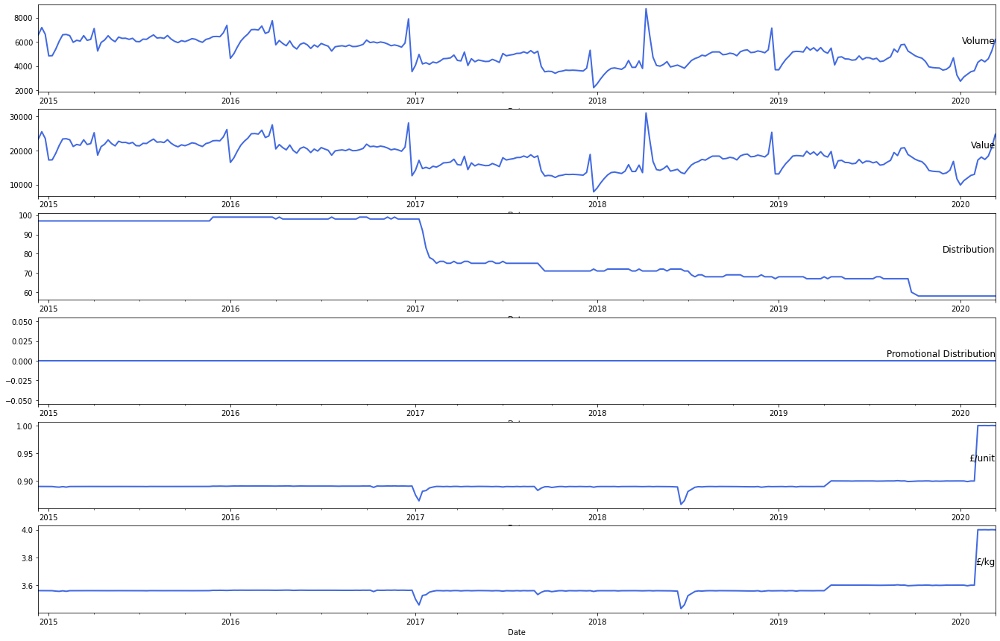

In [27]:
#plot each variable of the dataset
plot_data(mcv_dig_250g_origin)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd9902e5c18>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd9909c3f28>)

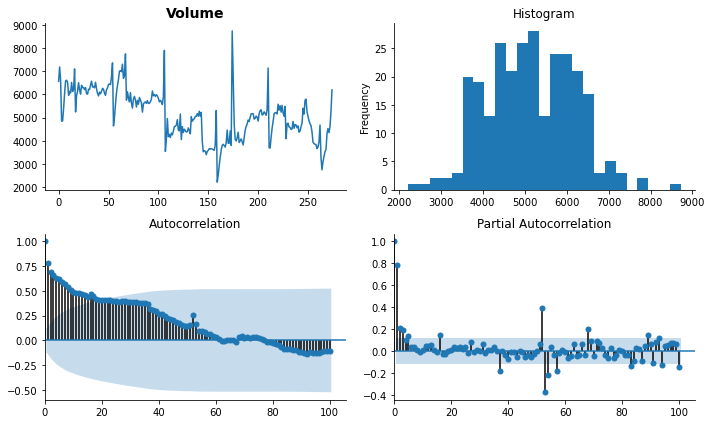

In [28]:
tsplot(mcv_dig_250g_origin['Volume'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)

Test Statistic                  -2.635004
p-value                          0.085976
#Lags Used                       4.000000
Number of Observations Used    270.000000
Critical Value (1%)             -3.454804
Critical Value (5%)             -2.872305
Critical Value (10%)            -2.572506
dtype: float64


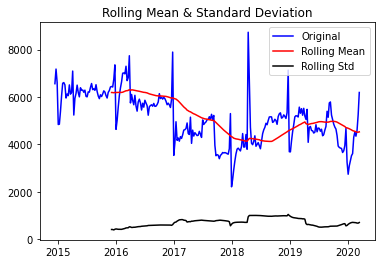

In [29]:
#check stationarity of the original dataset
plot(mcv_dig_250g_origin)

Autocorrelation captures the series itself, and how it correlated with its own path. (yt and yt-1)
a correlation of a variable itself at different time is known as autocorrelation. 

Since we got a relative large p-value, and the test statistic is not able to reject critical values at three levels; thus, we are not able to reject the null, we confirm that our dataset is not stationary.

Large number of time series models require stationarity of the dataset because if the dataset is not stationary, it will hard for the model to capture the trend, which will affect the accuracy of the future predictions. 

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd990815cc0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd99071bf60>)

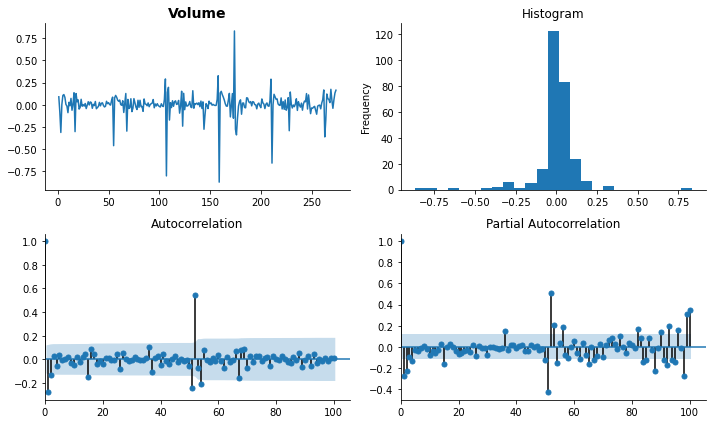

In [30]:
#plot stationary graph
series_transformed=mcv_dig_250g_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_dig_250g_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)


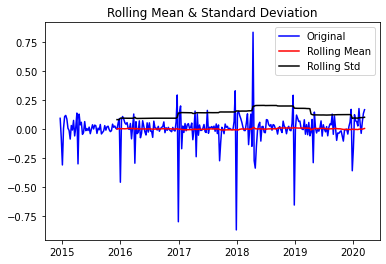

Results of Dickey-Fuller Test:
Test Statistic                -1.158473e+01
p-value                        2.885889e-21
#Lags Used                     3.000000e+00
Number of Observations Used    2.700000e+02
Critical Value (1%)           -3.454804e+00
Critical Value (5%)           -2.872305e+00
Critical Value (10%)          -2.572506e+00
dtype: float64


In [31]:
plot_transform(mcv_dig_250g_origin)

After transforming the dataset into stationary dataset, we see the p-value is extremely small, and the test statistic is smaller than critical values. And the autocorrelation is near zero.

### Time Series Modeling Part

      t-1     t+1
0     NaN  6563.0
1  6563.0  7179.8
2  7179.8  6617.0
3  6617.0  4842.8
4  4842.8  4856.0
Test MSE: 182400.603
Test RMSE: 427.084


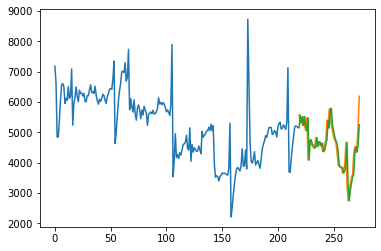

In [32]:
baseline_model(mcv_dig_250g_origin)

When we deal with a time series dataset, we need to check the baseline model before applying any other models. By baseline model, it means we use the value at the previous time step (t-1) to predict the expected outcome at time step at t. It provides a point of reference for all other model techniques.

### Simple Exponential Smoothing model

Observations: 275
Training Observations: 220
Testing Observations: 55


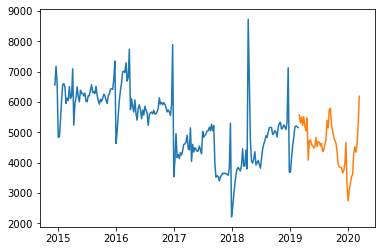

RMSE for Simple Exponential Smoothing α= 0.1 is: 811.71
RMSE for Simple Exponential Smoothing α= 0.2 is: 829.06
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 856.23
RMSE for Simple Exponential Smoothing α= 0.4 is: 886.98
RMSE for Simple Exponential Smoothing α= 0.5 is: 909.55
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 921.4
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 925.29
RMSE for Simple Exponential Smoothing α= 0.8 is: 924.87
RMSE for Simple Exponential Smoothing α= 0.9 is: 922.76


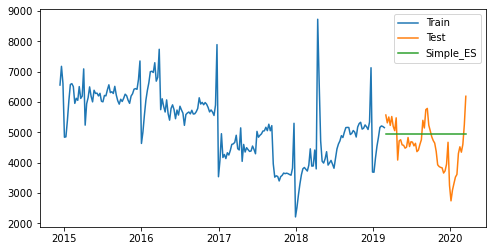

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 791.58


In [33]:
ses_model(mcv_dig_250g_origin)

Simple exponential smoothing: forecast future values using a weighted average of all previous values in the series.
Exponential smoothing is an intuitive forecasting method that weights the observed time series unequally. Recent observations are weighted more heavily than remote observations.

This model does not require stationarity of a dataset, so we apply the model with original data first to see the accuracy. 

### Holt's Linear Model

Holt's linear model can only capture the trend, not seasonality.

Observations: 275
Training Observations: 220
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.6000000000000001 and β= 0.7000000000000001 is: 648.84


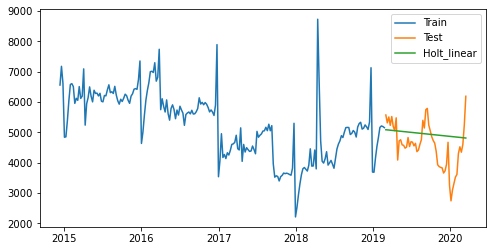

In [34]:
holt_linear_model(mcv_dig_250g_origin)

### Re-apply the model by removing the seasonality through log & diff12

Observations: 275
Training Observations: 208
Testing Observations: 55


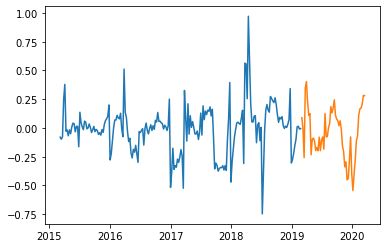

            Volume   pred_value
Date                           
2019-03-02  5574.8  5147.310293
2019-03-09  5317.0  4862.434295
2019-03-16  5510.5  4991.305127
2019-03-23  5234.0  4695.619083
2019-03-30  5525.5  4909.833348
2019-04-06  5197.8  4574.575086
2019-04-13  5059.5  4410.367949
2019-04-20  5482.0  4733.062963
2019-04-27  4091.3  3498.650851
2019-05-04  4723.5  4000.729839
2019-05-11  4760.3  3993.426141
2019-05-18  4590.3  3814.067990
2019-05-25  4578.0  3767.551318
2019-06-01  4482.8  3654.001985
2019-06-08  4518.3  3647.795695
2019-06-15  4833.5  3865.032888
2019-06-22  4535.5  3592.135162
2019-06-29  4695.3  3683.213315
2019-07-06  4680.8  3636.801842
2019-07-13  4558.5  3507.983484
2019-07-20  4643.3  3539.144968
2019-07-27  4369.0  3298.296398
2019-08-03  4418.8  3304.060635
2019-08-10  4605.0  3410.431456
2019-08-17  4761.3  3492.539003
2019-08-24  5400.5  3923.608948
2019-08-31  5147.8  3704.328039
2019-09-07  5751.8  4099.468724
2019-09-14  5792.3  4088.941296
2019-09-

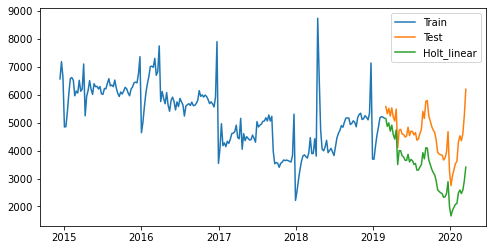

RMSE for Holt Linear Forecasting with transformation is: 1330.3488872235318


In [35]:
holt_linear_model_log(mcv_dig_250g_origin)

### Holt-Winter Model

This model can capture both trend and seasonlity.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

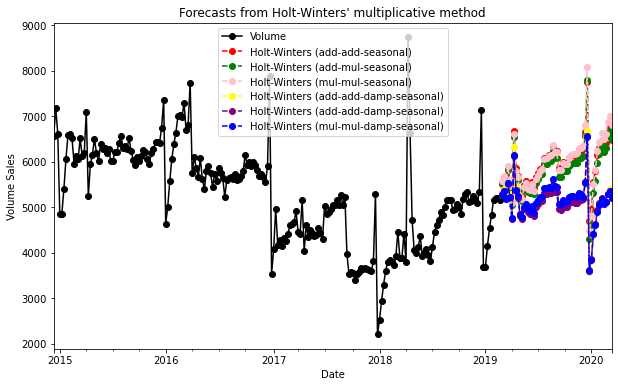

RMSE for Holt-winter are:
1601.368272725909
1480.0253146245254
1640.1381637006145
860.2219936997768
825.9719746331746
863.264280579266


In [36]:
holt_winter_model(mcv_dig_250g_origin)

Tried all three models with original value/unstationary dataset (without transformation). We can see that the RMSE is actually getting smaller. 

From Simple exponential smoothing: 1012
to Holt's linear: 898
to Holt Winter's: 738.

This can prove that holt winter's is the one that can capture more information than they other two models.

We also apply stationary data (after taking log and differencing) on holt's linear model. We get a small RMSE. Even though the exponential smoothing series models do not require stationarity, but non-stationary dataset results can be misleading, and it is essential to have stationary dataset for the model to capture the information.

### Prophet Model

Facebook developed an open sourcing Prophet. Facebook provides prophet model not only can take care of some outliers/unusual values, but also it can take care of missing values. It is almost able to fully automatically forecast the trend of the future time series. 

Prophet can deal with missing observations or large outliers, and can roll with the punches in relation to product launches or marketing pushes.

Built in Stan, which is really fast.

Prophet needs a very specific kind of dataframe for it to work on. What we need is:

Date column as ds & Value column as y.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


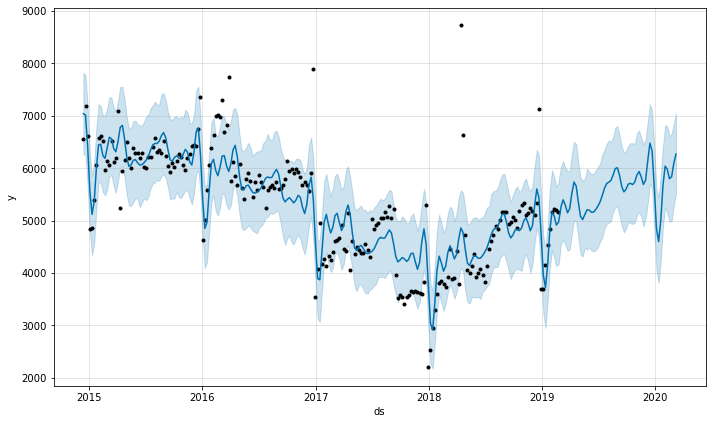

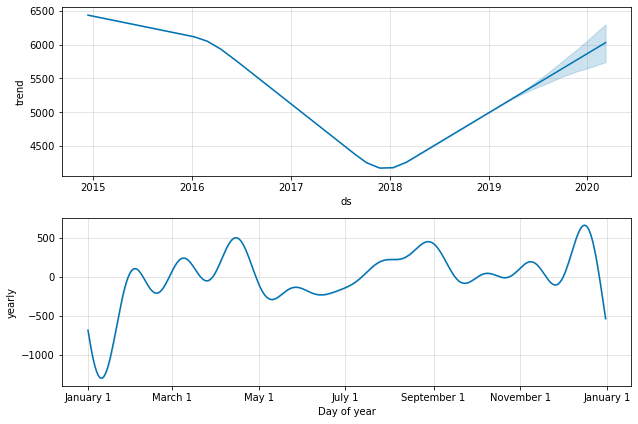

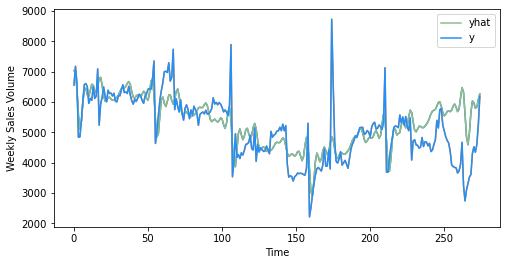

RMSE for prophet model is: 774.4738620997846


In [37]:
prophet_model(mcv_dig_250g_origin)

The default mode for the prophet model is linear growth, we need to make some adjustments for that. 

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


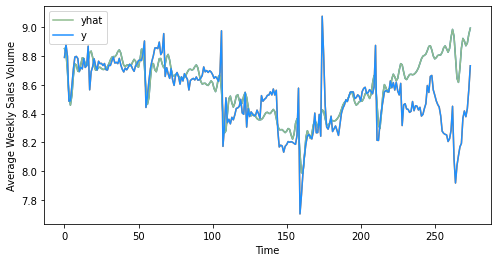

RMSE for prophet model after transformation is: 1103.3304092745504


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [38]:
prophet_model_log(mcv_dig_250g_origin)

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ireland] (Observed)
17                                Boxing Day (Ob

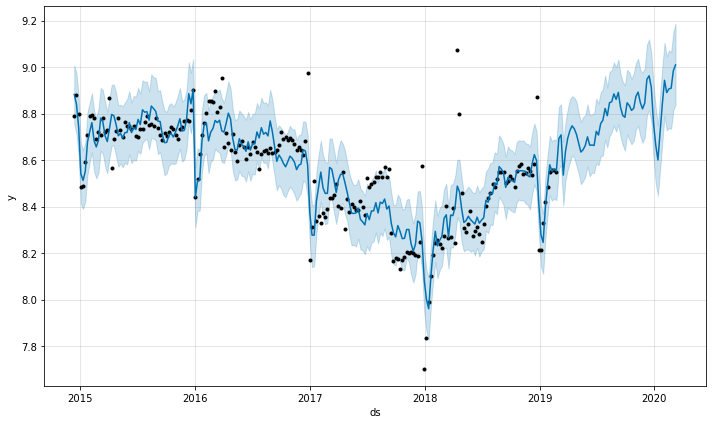

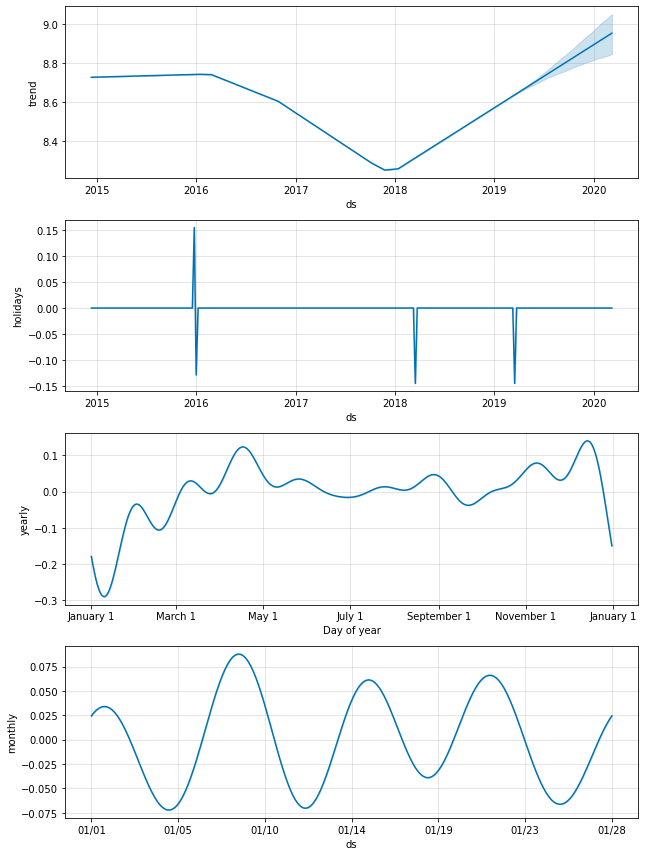

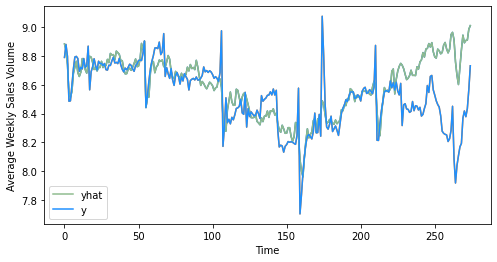

RMSE for prophet with transformation and holiday is: 1111.9139427141167


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [39]:
prophet_log_season(mcv_dig_250g_origin)

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


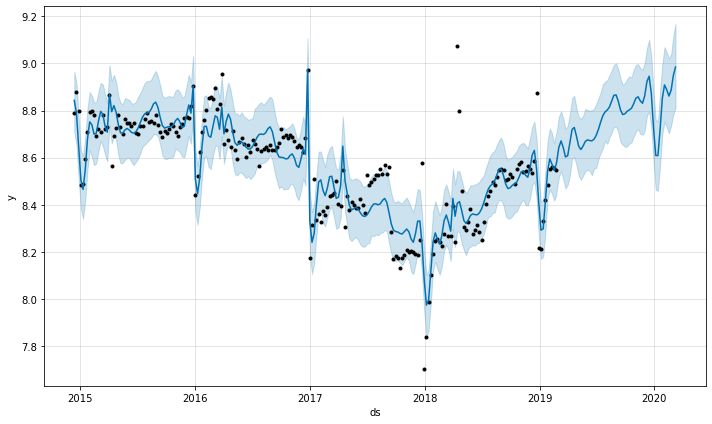

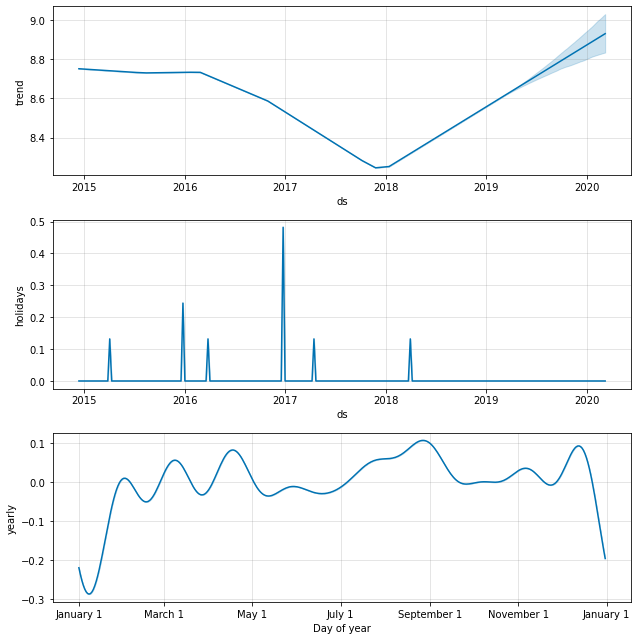

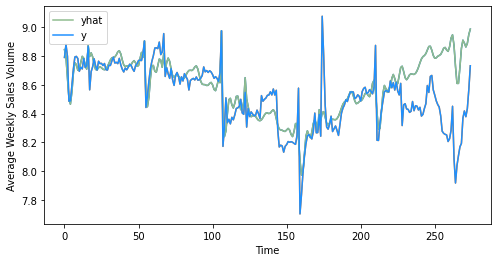

1063.619134552686


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [40]:
prophet_log_two_holiday(mcv_dig_250g_origin)

### Variables Analysis

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

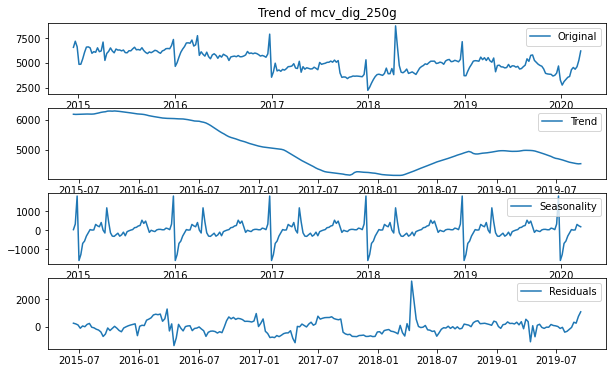

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

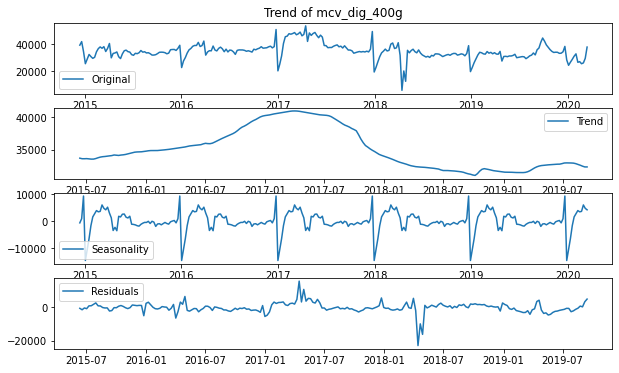

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

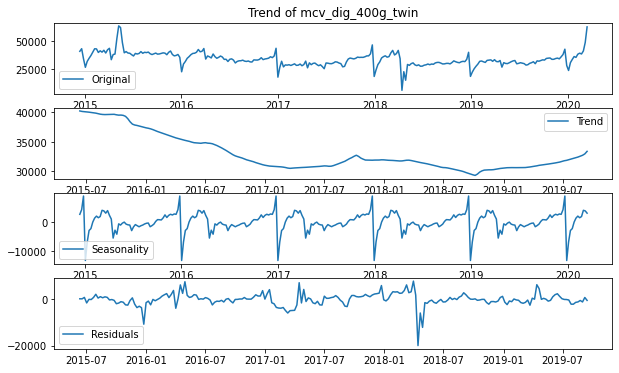

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

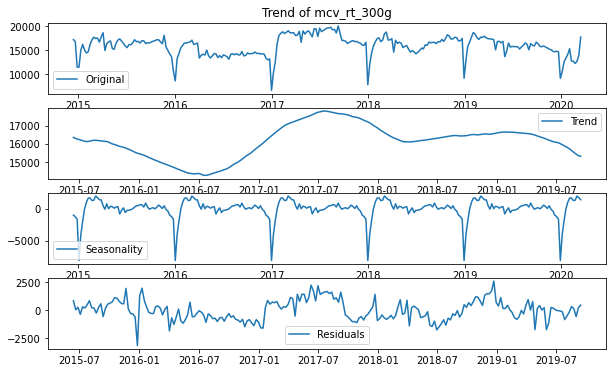

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin')

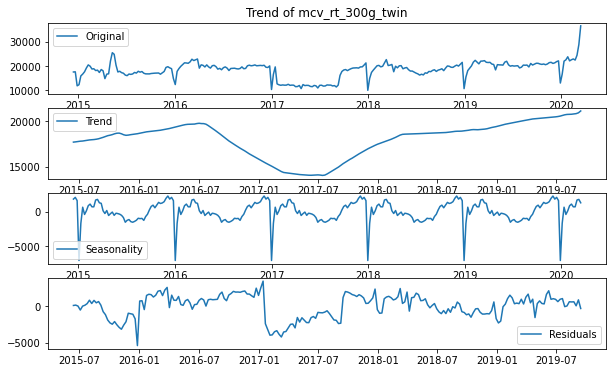

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

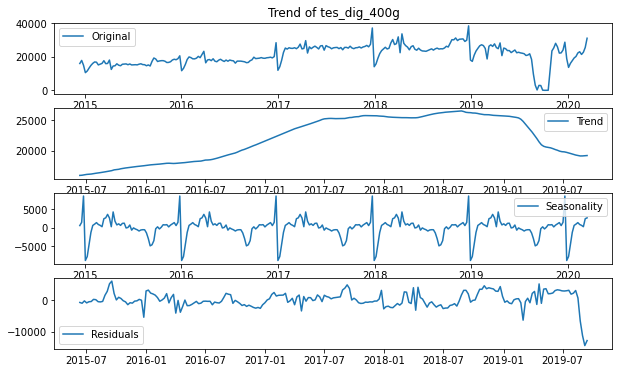

No enough datapoints for plotting the complete graphs


<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_molly_400g')

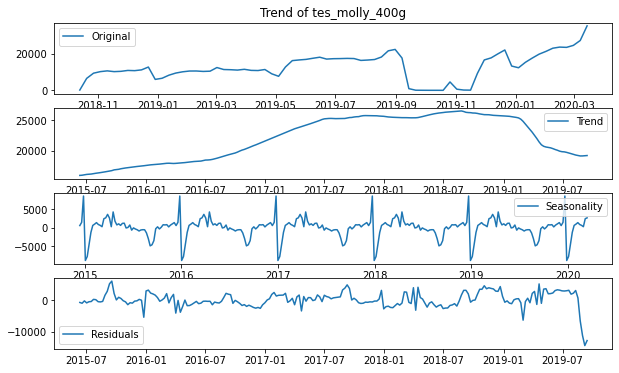

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

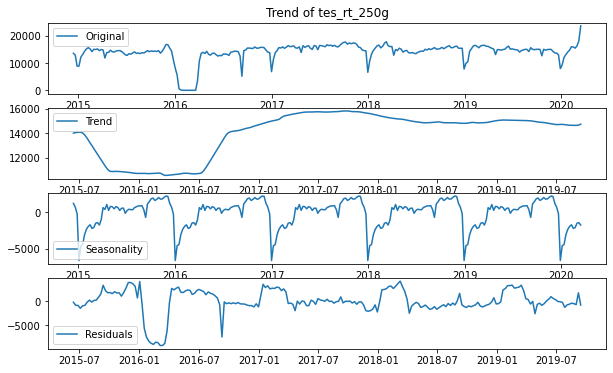

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

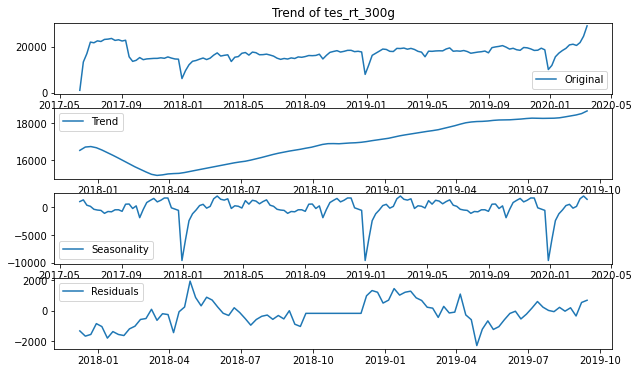

In [41]:
#decomposition for pladis products
from statsmodels.tsa.seasonal import seasonal_decompose

mcv_name=['mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin',
          'mcv_rt_300g','mcv_rt_300g_twin','tes_dig_400g',
          'tes_molly_400g', 'tes_rt_250g','tes_rt_300g'
         ]
#tes_large1 contains original dataset, only transform the date

tes_large2=[]
i=0
for df in tes_large1:
    df=df.set_index('Date')
    df=df[['Volume']]
    df = df.dropna()
    tes_large2.append(df)
    
    try:
        decomposition=seasonal_decompose(df)
    except ValueError:
        print('No enough datapoints for plotting the complete graphs')
   
    trend=decomposition.trend
    seasonal=decomposition.seasonal
    residual=decomposition.resid

    plt.figure(figsize=(10,6))
    plt.subplot(411)
    plt.plot(df, label='Original')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_name[i] )
    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal, label='Seasonality')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals')
    plt.legend(loc='best')
    plt.show()
    i=i+1

mcv_dig_250g_volume=tes_large2[0]
mcv_dig_400g_volume=tes_large2[1]
mcv_dig_400g_twin_volume=tes_large2[2]
mcv_rt_300g_volume=tes_large2[3]
mcv_rt_300g_twin_volume=tes_large2[4]
tes_dig_400g_volume=tes_large2[5]
tes_molly_400g_volume=tes_large2[6]
tes_rt_250g_volume=tes_large2[7]
tes_rt_300g_volume=tes_large2[8]

#### Compare trends with Pladis product and competitors' product

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

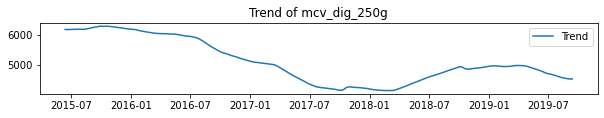

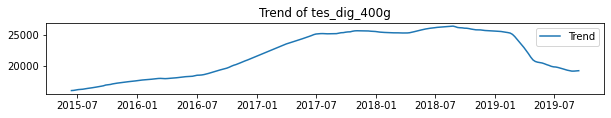

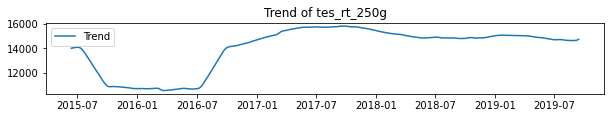

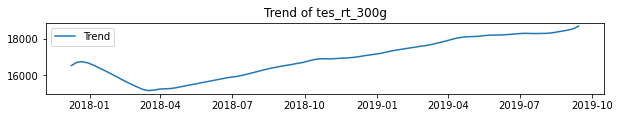

In [42]:
mcv_dig_250g_competitor=[mcv_dig_250g_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_dig_250g_competitor_list=['mcv_dig_250g','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_dig_400g_competitor=[mcv_dig_400g_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_dig_400g_competitor_list=['mcv_dig_400g','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_dig_400g_twin_competitor=[mcv_dig_400g_twin_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_dig_400g_twin_competitor_list=['mcv_dig_400g_twin','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_rt_300g_competitor=[mcv_rt_300g_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_rt_300g_competitor_list=['mcv_rt_300g','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_rt_300g_twin_competitor=[mcv_rt_300g_twin_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_rt_300g_twin_competitor_list=['mcv_rt_300g_twin','tes_dig_400g','tes_rt_250g','tes_rt_300g']

# product_name=['mcv_dig_250g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#              'mcv_dig_400g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_dig_400g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g'
#              ]

i=0
for product in mcv_dig_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_250g_competitor_list[i] )
    i=i+1
    

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

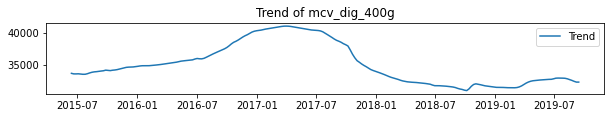

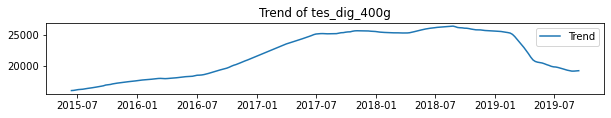

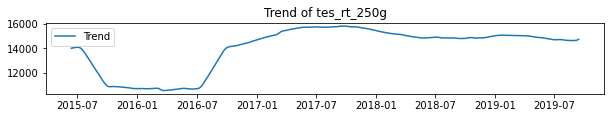

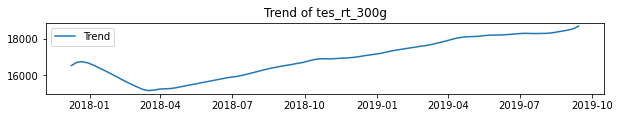

In [43]:
i=0
for product in mcv_dig_400g_competitor:
    decomposition=seasonal_decompose(product)
    trend_2=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_2, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_400g_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

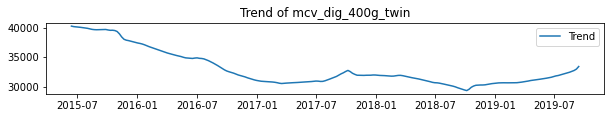

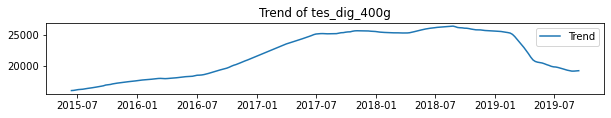

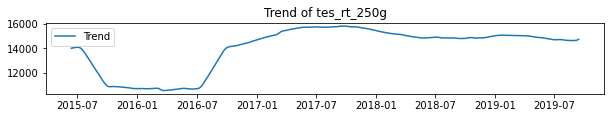

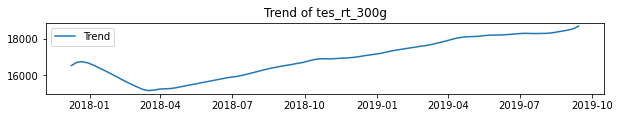

In [44]:
i=0
for product in mcv_dig_400g_twin_competitor:
    decomposition=seasonal_decompose(product)
    trend_3=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_3, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_400g_twin_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

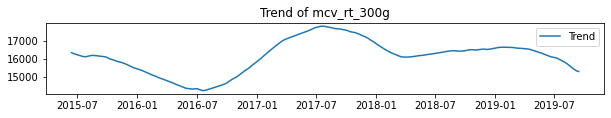

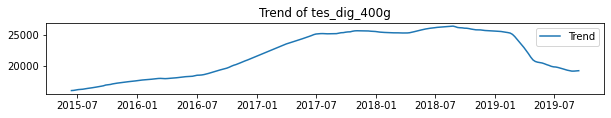

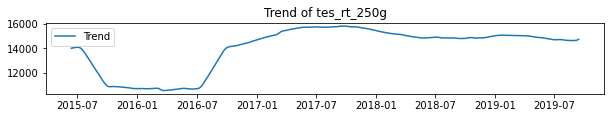

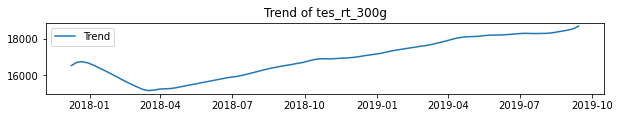

In [45]:
i=0
for product in mcv_rt_300g_competitor:
    decomposition=seasonal_decompose(product)
    trend_4=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_4, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_rt_300g_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

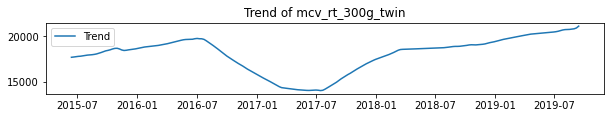

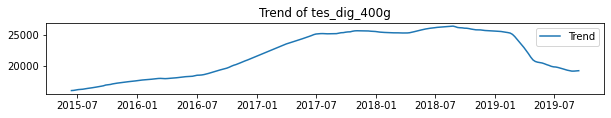

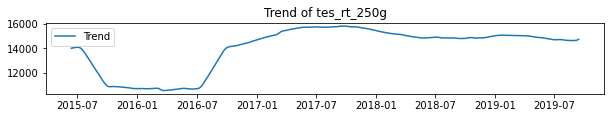

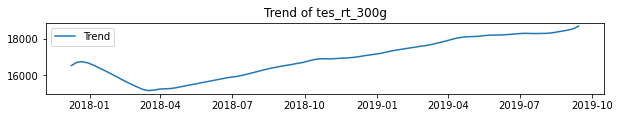

In [46]:
i=0
for product in mcv_rt_300g_twin_competitor:
    decomposition=seasonal_decompose(product)
    trend_5=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_5, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_rt_300g_twin_competitor_list[i])
    i=i+1

In [47]:
decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
trend_1=decomposition_1.trend
trend_1=trend_1.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# # datapoints are less than 104 observations
# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_dig_250g_comp=pd.merge(trend_1,comp_trend1, how='left', on='Date')
# mcv_dig_250g=pd.merge(mcv_dig_250g,comp_trend2, how='left', on='Date')
mcv_dig_250g_comp=pd.merge(mcv_dig_250g_comp,comp_trend3, how='left', on='Date')
mcv_dig_250g_comp=pd.merge(mcv_dig_250g_comp,comp_trend4, how='left', on='Date')
mcv_dig_250g_comp.columns=['mcv_dig_250g_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_dig_250g_comp.corr()


,mcv_dig_250g_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_dig_250g_trend,1.000000,-0.866579,-0.886110,0.609020
tes_dig_400g_trend,-0.866579,1.000000,0.791993,-0.795277
tes_rt_250g_trend,-0.886110,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.609020,-0.795277,-0.389964,1.000000


In [48]:
decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
trend_2=decomposition_2.trend
trend_2=trend_2.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_400g_comp=pd.merge(trend_2,comp_trend1, how='left', on='Date')
# mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend2, how='left', on='Date')
mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend3, how='left', on='Date')
mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend4, how='left', on='Date')
mcv_400g_comp.columns=['mcv_dig_400g_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_400g_comp.corr()

,mcv_dig_400g_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_dig_400g_trend,1.000000,-0.079756,0.073859,0.013966
tes_dig_400g_trend,-0.079756,1.000000,0.791993,-0.795277
tes_rt_250g_trend,0.073859,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.013966,-0.795277,-0.389964,1.000000


In [49]:
decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
trend_3=decomposition_3.trend
trend_3=trend_3.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_dig_400g_twin_comp=pd.merge(trend_3,comp_trend1, how='left', on='Date')
# mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend2, how='left', on='Date')
mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend3, how='left', on='Date')
mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend4, how='left', on='Date')
mcv_dig_400g_twin_comp.columns=['mcv_dig_400g_twin_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_dig_400g_twin_comp.corr()

,mcv_dig_400g_twin_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_dig_400g_twin_trend,1.000000,-0.838641,-0.767722,0.159325
tes_dig_400g_trend,-0.838641,1.000000,0.791993,-0.795277
tes_rt_250g_trend,-0.767722,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.159325,-0.795277,-0.389964,1.000000


In [50]:
decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
trend_4=decomposition_4.trend
trend_4=trend_4.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_rt_300g_comp=pd.merge(trend_4,comp_trend1, how='left', on='Date')
# mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend2, how='left', on='Date')
mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend3, how='left', on='Date')
mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend4, how='left', on='Date')
mcv_rt_300g_comp.columns=['mcv_rt_300g_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']


mcv_rt_300g_comp.corr()

,mcv_rt_300g_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_rt_300g_trend,1.000000,0.675009,0.760581,-0.195562
tes_dig_400g_trend,0.675009,1.000000,0.791993,-0.795277
tes_rt_250g_trend,0.760581,0.791993,1.000000,-0.389964
tes_rt_300g_trend,-0.195562,-0.795277,-0.389964,1.000000


In [51]:
#mcv_rt_300g_twin trend correlation
decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
trend_5=decomposition_5.trend
trend_5=trend_5.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_rt_300g_twin_comp=pd.merge(trend_5,comp_trend1, how='left', on='Date')
# mcv_rt_300g_twin_comp=pd.merge(mcv_rt_300g_twin_comp,comp_trend2, how='left', on='Date')
mcv_rt_300g_twin_comp=pd.merge(mcv_rt_300g_twin_comp,comp_trend3, how='left', on='Date')
mcv_rt_300g_twin_comp=pd.merge(mcv_rt_300g_twin_comp,comp_trend4, how='left', on='Date')
mcv_rt_300g_twin_comp.columns=['mcv_rt_300g_twin_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_rt_300g_twin_comp.corr()

,mcv_rt_300g_twin_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_rt_300g_twin_trend,1.000000,-0.299945,-0.394315,0.843504
tes_dig_400g_trend,-0.299945,1.000000,0.791993,-0.795277
tes_rt_250g_trend,-0.394315,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.843504,-0.795277,-0.389964,1.000000


## Machine Learning Model

In [52]:
#extract own product variables: sales price distribution promotional week month quarter
def own_product_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
    x=x[['Volume','£/kg','Distribution','Promotional Distribution','month','quarter','week']]
    return x

mcv_dig_250g_own_variable=own_product_variables(mcv_dig_250g_origin)
mcv_dig_400g_own_variable=own_product_variables(mcv_dig_400g_origin)
mcv_dig_400g_twin_own_variable=own_product_variables(mcv_dig_400g_twin_origin)
mcv_rt_300g_own_variable=own_product_variables(mcv_rt_300g_origin)
mcv_rt_300g_twin_own_variable=own_product_variables(mcv_rt_300g_twin_origin)


In [53]:
mcv_dig_250g_with_comp_1=mcv_dig_250g_own_variable
mcv_dig_400g_with_comp_1=mcv_dig_400g_own_variable
mcv_dig_400g_twin_with_comp1=mcv_dig_400g_twin_own_variable
mcv_rt_300g_with_comp1=mcv_rt_300g_own_variable
mcv_rt_300g_twin_with_comp1=mcv_rt_300g_twin_own_variable

In [54]:
def comp_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
#     x=x.dropna(subset=['Volume'])
    x=x[['£/kg','Distribution']]
    return x

tesco_digs400g_price_dis=comp_variables(tes_dig_400g_origin)
tesco_rt250g_price_dis=comp_variables(tes_rt_250g_origin)
tesco_molly400g_price_dis=comp_variables(tes_molly_400g_origin)
tesco_rt300g_price_dis=comp_variables(tes_rt_300g_origin)

In [55]:
# compose competitors' variables as a list
competitor_list=[tesco_rt250g_price_dis, tesco_molly400g_price_dis, tesco_rt300g_price_dis, tesco_digs400g_price_dis]

variable_columns=['Volume','£/kg','Distribution','Promotional Distribution',
                  'month','quarter','week',
                   'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                   'tesco_digs400g_price_kg','tesco_dig400g_distribution'
                  ]

In [56]:
# mcv_dig_250g product
# each variable with their competitors
# merge own product variables with four competitors' variables
for variable in competitor_list:
    mcv_dig_250g_with_comp_1=mcv_dig_250g_with_comp_1.merge(variable, how='left', on='Date')
    mcv_dig_250g_with_comp=mcv_dig_250g_with_comp_1
    
#drop all missing values
mcv_dig_250g_with_comp.columns=variable_columns
mcv_dig_250g_with_comp=mcv_dig_250g_with_comp.dropna()
mcv_dig_250g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,
2018-10-13,4850.3,3.559244,69,0,10,4,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,5179.0,3.558718,69,0,10,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,5293.5,3.557684,68,0,10,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,5335.8,3.558061,68,0,11,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,5111.3,3.557921,68,0,11,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [57]:
# mcv_dig_400g product
for variable in competitor_list:
    mcv_dig_400g_with_comp_1=mcv_dig_400g_with_comp_1.merge(variable, how='left', on='Date')
    mcv_dig_400g_with_comp=mcv_dig_400g_with_comp_1
    
mcv_dig_400g_with_comp.columns=variable_columns
mcv_dig_400g_with_comp=mcv_dig_400g_with_comp.dropna()
mcv_dig_400g_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,
2018-10-13,31698.0,2.501574,100,0,10,4,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,32629.2,2.501698,100,0,10,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,33110.0,2.501824,100,0,10,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,33014.8,2.501599,100,0,11,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,31830.0,2.501929,100,0,11,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [58]:
#mcv_dig_400g_twin product
for variable in competitor_list:
    mcv_dig_400g_twin_with_comp1=mcv_dig_400g_twin_with_comp1.merge(variable, how='left', on='Date')
    mcv_dig_400g_twin_with_comp=mcv_dig_400g_twin_with_comp1
    
mcv_dig_400g_twin_with_comp.columns=variable_columns
mcv_dig_400g_twin_with_comp=mcv_dig_400g_twin_with_comp.dropna()
mcv_dig_400g_twin_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,
2018-10-13,29722.4,2.361640,98,0,10,4,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,30899.2,2.362333,98,0,10,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,32409.6,2.362053,98,0,10,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,31647.2,2.362421,98,0,11,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,31065.6,2.361049,98,0,11,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [59]:
#mcv_rt_300g product
for variable in competitor_list:
    mcv_rt_300g_with_comp1=mcv_rt_300g_with_comp1.merge(variable, how='left', on='Date')
    mcv_rt_300g_with_comp=mcv_rt_300g_with_comp1
    
mcv_rt_300g_with_comp.columns=variable_columns
mcv_rt_300g_with_comp=mcv_rt_300g_with_comp.dropna()
mcv_rt_300g_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,
2018-10-13,16893.0,3.328089,100,0,10,4,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,17493.9,3.330738,100,0,10,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,18264.9,3.335835,100,0,10,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,18000.0,3.332644,100,0,11,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,17365.2,3.329135,100,0,11,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [60]:
#mcv_rt_300g_twin product
for variable in competitor_list:
    mcv_rt_300g_twin_with_comp1=mcv_rt_300g_twin_with_comp1.merge(variable, how='left', on='Date')
    mcv_rt_300g_twin_with_comp=mcv_rt_300g_twin_with_comp1
    
mcv_rt_300g_twin_with_comp.columns=variable_columns
mcv_rt_300g_twin_with_comp=mcv_rt_300g_twin_with_comp.dropna()
mcv_rt_300g_twin_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,
2018-10-13,18062,3.15,98,0,10,4,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,19108,3.15,98,0,10,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,20010,3.15,98,0,10,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,19879,3.15,98,0,11,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,19467,3.15,98,0,11,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


### Random Forest Regressor

In [61]:
def input_var(var):
#     for var in final_var_list:
    X=var[['£/kg','Distribution','Promotional Distribution',
           'month','quarter','week',
                 'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                   'tesco_digs400g_price_kg','tesco_dig400g_distribution'
              ]].values
    y=var['Volume'].values
    return X,y


In [62]:
#train test split
from sklearn.model_selection import TimeSeriesSplit

def rf_regressor_mcv(X, y):
    splits = TimeSeriesSplit(n_splits=5)

    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler

        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        regressor = RandomForestRegressor(n_estimators=20, random_state=0)
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        print(cross_val_score(regressor, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'month','quarter','week',
                 'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                                              'tesco_digs400g_price_kg','tesco_dig400g_distribution'
], 'importance': regressor.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of Random Forest Model",legend=False, figsize=(15, 8))

In [63]:
mcv_dig_250g_input_X,mcv_dig_250g_input_Y=input_var(mcv_dig_250g_with_comp)


Observations: 27
Training Observations: 15
Testing Observations: 12
[-1.19074619e+00 -6.34536475e+00 -1.28319859e+00 -5.44220649e+05
 -1.56374701e+01]
Mean Absolute Error: 436.9470833333327
Mean Squared Error: 251375.2832437492
Root Mean Squared Error: 501.3733970243627
Observations: 39
Training Observations: 27
Testing Observations: 12
[ -0.36339888 -19.37898985  -4.05958973  -1.68066876  -0.65839337]
Mean Absolute Error: 808.3820833333338
Mean Squared Error: 720625.1536395838
Root Mean Squared Error: 848.8964328112022
Observations: 51
Training Observations: 39
Testing Observations: 12
[-0.08065108 -1.74158675 -0.25953157 -4.14259461 -0.7490986 ]
Mean Absolute Error: 390.624583333333
Mean Squared Error: 263257.64157708274
Root Mean Squared Error: 513.0863880255281
Observations: 63
Training Observations: 51
Testing Observations: 12
[-2.58173062 -0.93262819 -5.67264585 -0.23751807 -1.94960047]
Mean Absolute Error: 1035.7550000000012
Mean Squared Error: 1285548.1241083362
Root Mean Squar

<Figure size 432x288 with 0 Axes>

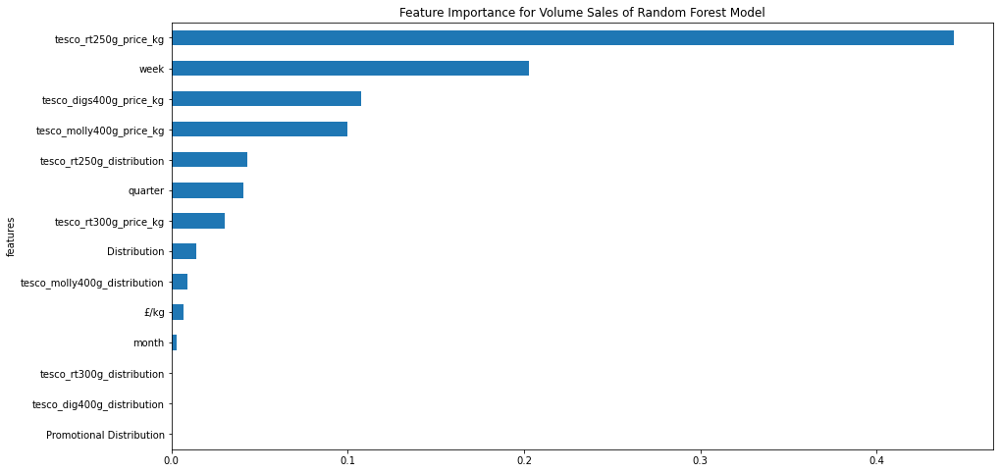

<Figure size 432x288 with 0 Axes>

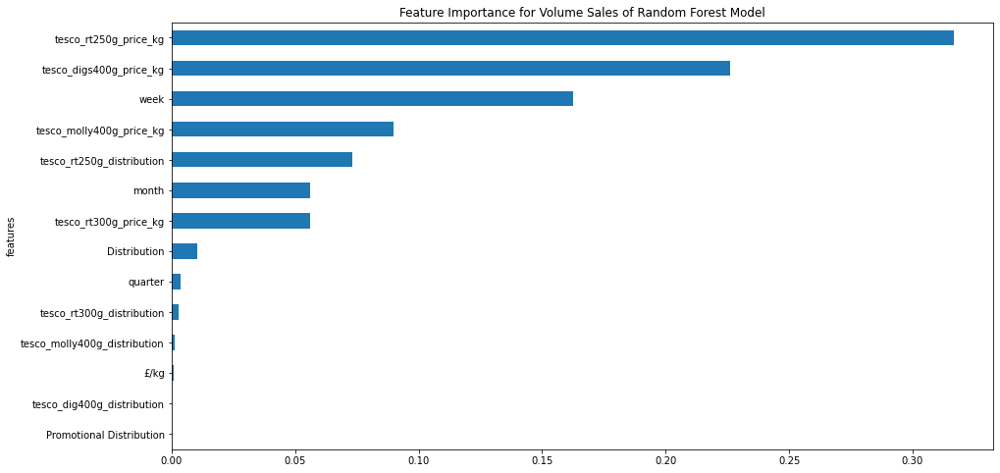

<Figure size 432x288 with 0 Axes>

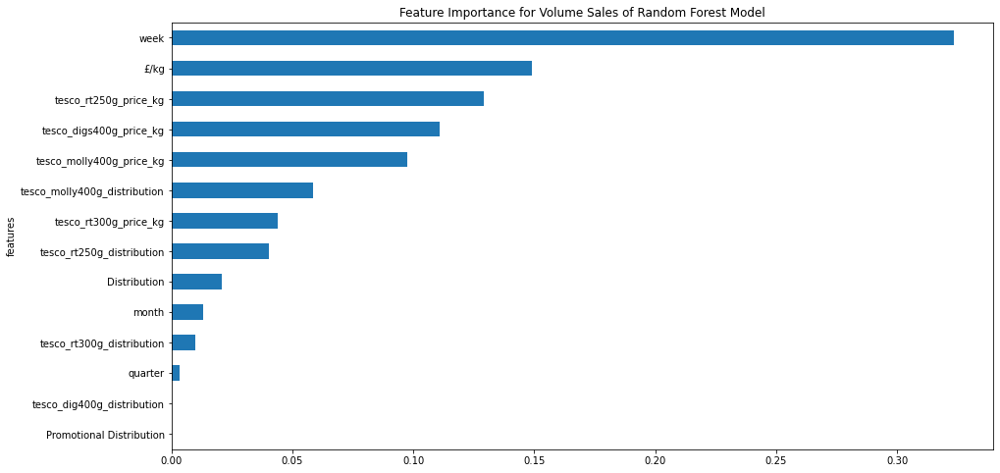

<Figure size 432x288 with 0 Axes>

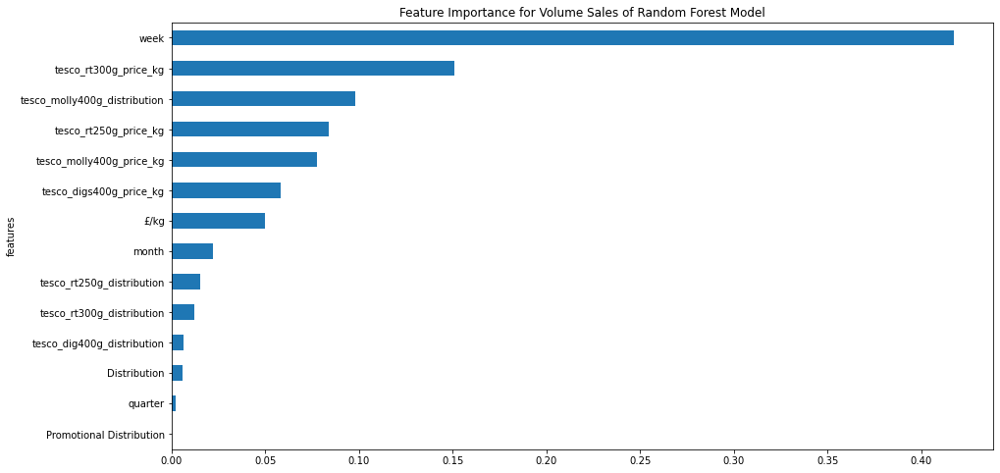

<Figure size 432x288 with 0 Axes>

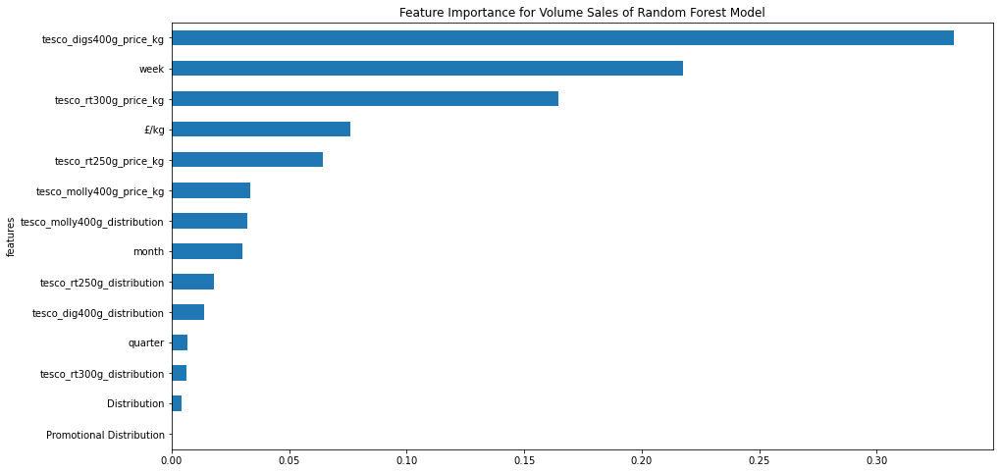

In [64]:
#drop columns
rf_regressor_mcv(mcv_dig_250g_input_X,mcv_dig_250g_input_Y)

### XGBoost Model

In [65]:
!pip3 install xgboost
from xgboost import XGBRegressor
import xgboost as xgb
# from sklearn.metrics import mean_squared_error


  Using cached xgboost-1.1.1-py3-none-manylinux2010_x86_64.whl (127.6 MB)


In [66]:
def xgb_regressor_mcv(X, y):
    splits = TimeSeriesSplit(n_splits=5)
    
    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler


        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                    max_depth = 5, alpha = 10, n_estimators = 10)
        xg_reg.fit(X_train, y_train)
        y_pred = xg_reg.predict(X_test)
        print(cross_val_score(xg_reg, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'month','quarter','week',
                 'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                                              'tesco_digs400g_price_kg','tesco_dig400g_distribution'], 'importance': xg_reg.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of XGBoost Model",legend=False, figsize=(20, 13))


In [67]:
mcv_dig_250g_input_X,mcv_dig_250g_input_Y=input_var(mcv_dig_250g_with_comp)

Observations: 27
Training Observations: 15
Testing Observations: 12
[-1.65159290e+03 -2.17435781e+03 -1.19163526e+01 -1.95421933e+04
 -6.34795198e+01]
Mean Absolute Error: 2195.2875244140623
Mean Squared Error: 4865566.857021967
Root Mean Squared Error: 2205.8029959681276
Observations: 39
Training Observations: 27
Testing Observations: 12
[  -9.57849787   -4.00962223 -169.45133468 -196.02865829 -135.46375059]
Mean Absolute Error: 1377.4523234049477
Mean Squared Error: 2016769.3276408592
Root Mean Squared Error: 1420.1300389896903
Observations: 51
Training Observations: 39
Testing Observations: 12
[  -1.79226712  -97.96065835 -153.22018419  -12.43073531 -125.70055102]
Mean Absolute Error: 1771.6057617187498
Mean Squared Error: 3363676.47412174
Root Mean Squared Error: 1834.032844341055
Observations: 63
Training Observations: 51
Testing Observations: 12
[  -4.26380138 -152.50832104  -14.32044123  -91.43104302  -26.4804078 ]
Mean Absolute Error: 963.5630533854168
Mean Squared Error: 11091

<Figure size 432x288 with 0 Axes>

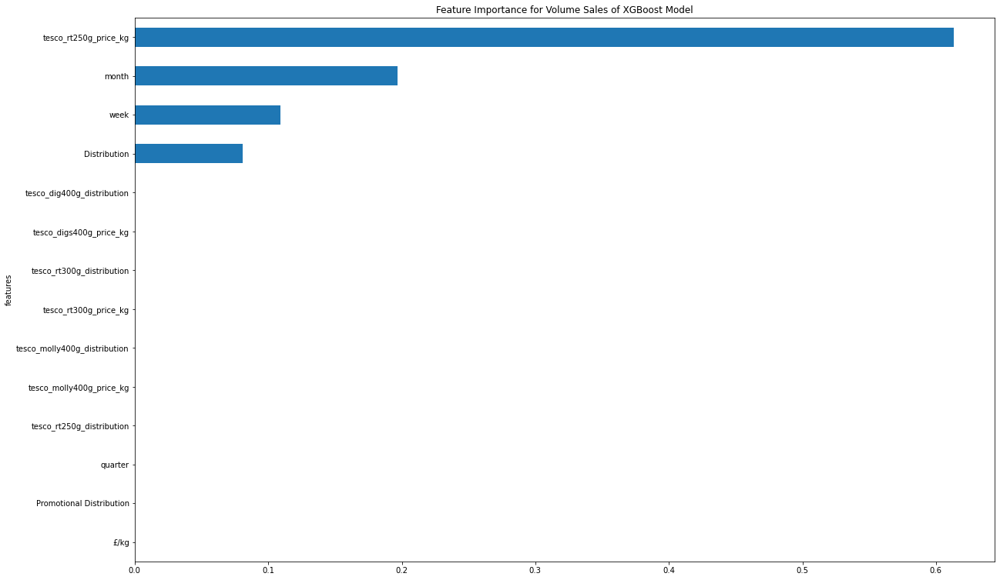

<Figure size 432x288 with 0 Axes>

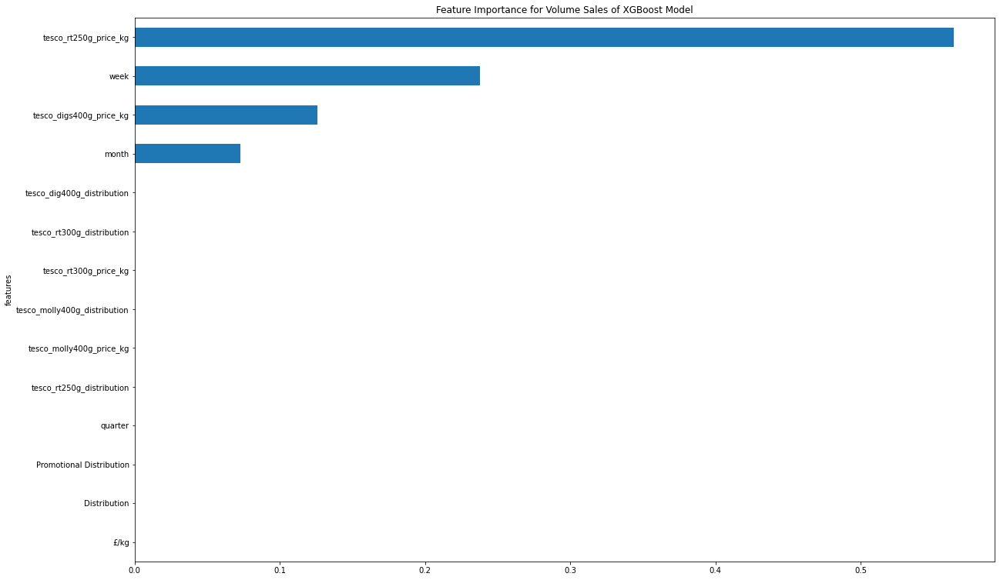

<Figure size 432x288 with 0 Axes>

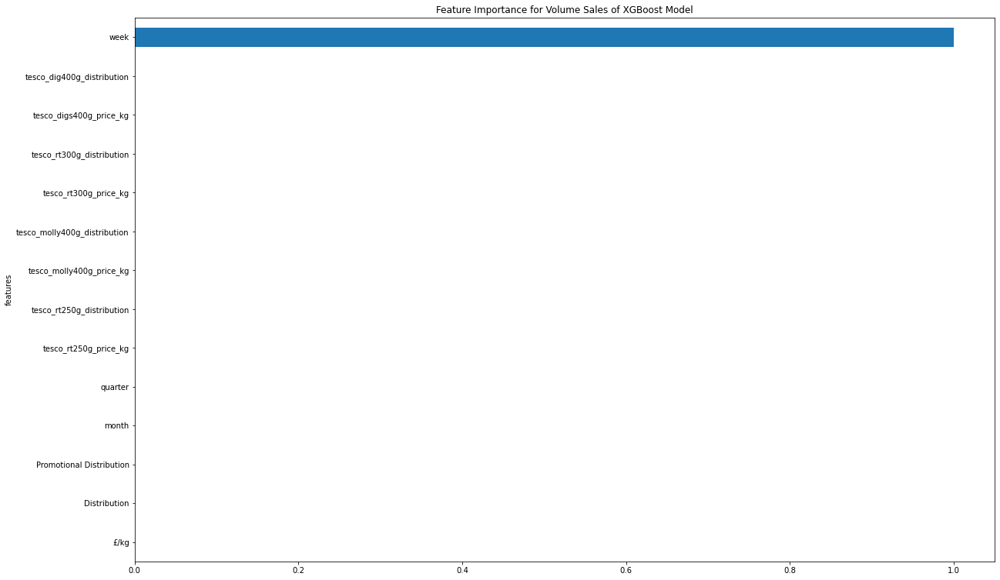

<Figure size 432x288 with 0 Axes>

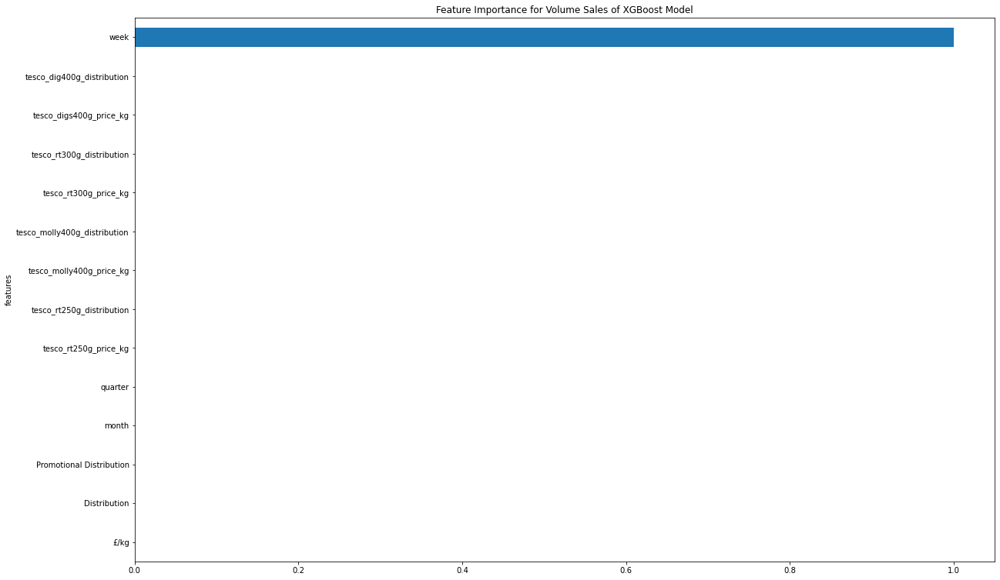

<Figure size 432x288 with 0 Axes>

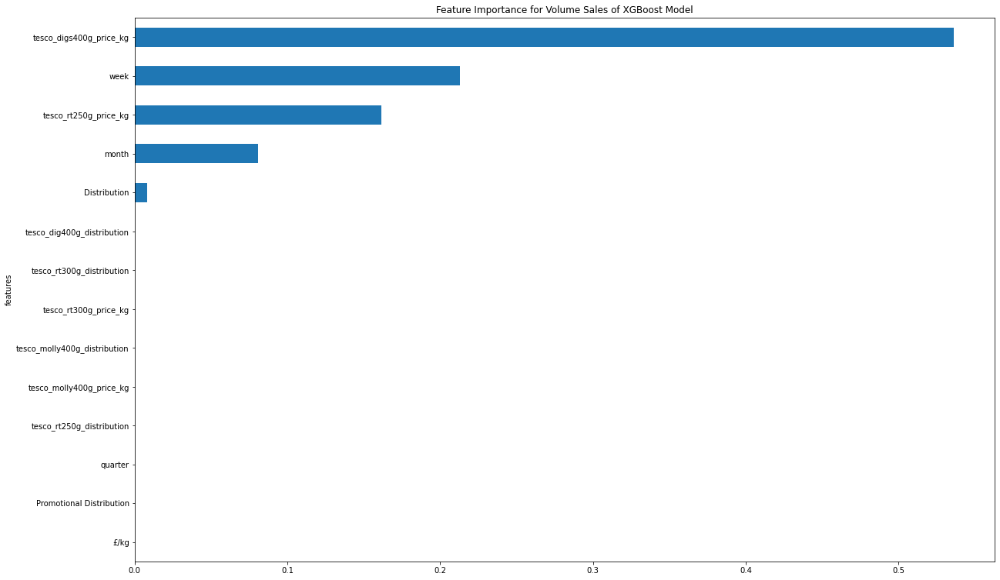

In [68]:
#dropna
xgb_regressor_mcv(mcv_dig_250g_input_X,mcv_dig_250g_input_Y)

### LSTM model

#### Univariate LSTM - Baseline Model

In [69]:
import numpy
import matplotlib.pyplot as plt
import pandas
import math
from pandas import DataFrame
from pandas import concat
!pip install tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it wi

In [70]:
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

In [71]:
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    if i == 0:
        names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
        names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
  # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [72]:
#def function version
def lstm_univariate(dataset):
    # load dataset
    values = dataset.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    print(reframed.head())
    
    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    # design network
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM univariate model loss vs. val loss',loc='center')
    plt.legend()
    plt.show()
    
    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

In [73]:
series_to_supervised(mcv_dig_250g_volume)

,var1(t-1),var1(t)
Date,,
2014-12-20,6563.0,7179.8
2014-12-27,7179.8,6617.0
2015-01-03,6617.0,4842.8
2015-01-10,4842.8,4856.0
2015-01-17,4856.0,5394.5
...,...,...
2020-02-15,4304.8,4527.5
2020-02-22,4527.5,4350.5
2020-02-29,4350.5,4605.0


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


   var1(t-1)   var1(t)
1   0.667107  0.761780
2   0.761780  0.675395
3   0.675395  0.403070
4   0.403070  0.405096
5   0.405096  0.487751
(219, 1, 1) (219,) (55, 1, 1) (55,)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 1s - loss: 0.4649 - val_loss: 0.3493
Epoch 2/50
219/219 - 0s - loss: 0.4490 - val_loss: 0.3339
Epoch 3/50
219/219 - 0s - loss: 0.4327 - val_loss: 0.3179
Epoch 4/50
219/219 - 0s - loss: 0.4157 - val_loss: 0.3009
Epoch 5/50
219/219 - 0s - loss: 0.3976 - val_loss: 0.2825
Epoch 6/50
219/219 - 0s - loss: 0.3781 - val_loss: 0.2627
Epoch 7/50
219/219 - 0s - loss: 0.3565 - val_loss: 0.2412
Epoch 8/50
219/219 - 0s - loss: 0.3327 - val_loss: 0.2173
Epoch 9/50
219/219 - 0s - loss: 0.3061 - val_loss: 0.1915
Epoch 10/50
219/219 - 0s - loss: 0.2766 - val_loss: 0.1637
Epoch 11/50
219/219 - 0s - loss: 0.2442 - val_loss: 0.1338
Epoch 12/50
219/219 - 0s - loss: 0.2106 - val_loss: 0.1068
Epoch 13/50
219/219 - 0s - loss: 0.1790 - val_loss: 0.0839
Epoch 14/50
219/219 - 0s - loss: 0.1492 - val_loss: 0.0687
Epoch 15/50
219/219 - 0s - loss: 0.1252 - val_loss: 0.0787
Epoch 00015: early stopping


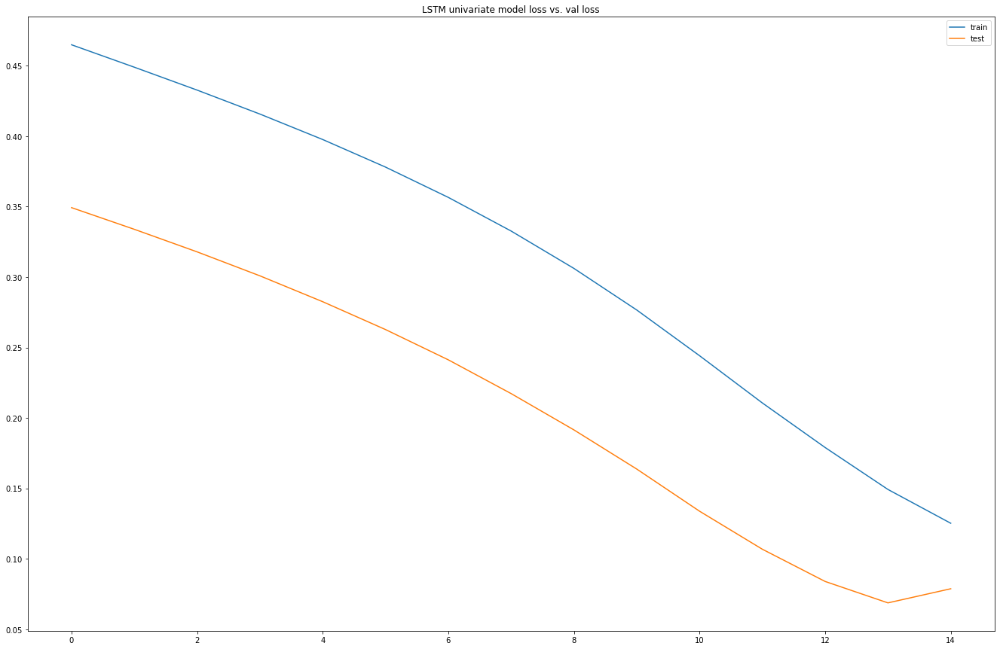

Test RMSE: 661.842


In [74]:
lstm_univariate(mcv_dig_250g_volume)

#### Multivariate LSTM - Without Competitors' Variables

In [75]:
# prepare data for lstm
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    if i == 0:
        names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
        names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
  # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg


In [76]:
def multivariate_lstm_without_competitor(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict

    reframed.drop(reframed.columns[[8,9,10,11,12,13]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]

    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    # design network
    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model without competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    # make a prediction
    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

In [77]:
series_to_supervised(mcv_dig_250g_own_variable)

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t)
Date,,,,,,,,,,,,,,
2014-12-20,6563.0,3.560262,97.0,0.0,12.0,4.0,50.0,7179.8,3.560043,97,0,12,4,51
2014-12-27,7179.8,3.560043,97.0,0.0,12.0,4.0,51.0,6617.0,3.560118,97,0,12,4,52
2015-01-03,6617.0,3.560118,97.0,0.0,12.0,4.0,52.0,4842.8,3.560110,97,0,1,1,1
2015-01-10,4842.8,3.560110,97.0,0.0,1.0,1.0,1.0,4856.0,3.559761,97,0,1,1,2
2015-01-17,4856.0,3.559761,97.0,0.0,1.0,1.0,2.0,5394.5,3.556789,97,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,4304.8,3.999605,58.0,0.0,2.0,1.0,6.0,4527.5,3.999050,58,0,2,1,7
2020-02-22,4527.5,3.999050,58.0,0.0,2.0,1.0,7.0,4350.5,3.999678,58,0,2,1,8
2020-02-29,4350.5,3.999678,58.0,0.0,2.0,1.0,8.0,4605.0,3.998827,58,0,2,1,9


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.667107   0.227363   0.951219        0.0        1.0        1.0   
2   0.761780   0.226979   0.951219        0.0        1.0        1.0   
3   0.675395   0.227110   0.951219        0.0        1.0        1.0   
4   0.403070   0.227096   0.951219        0.0        0.0        0.0   
5   0.405096   0.226483   0.951219        0.0        0.0        0.0   

   var7(t-1)   var1(t)  
1   0.942308  0.761780  
2   0.961538  0.675395  
3   0.980769  0.403070  
4   0.000000  0.405096  
5   0.019231  0.487751  
(219, 1, 7) (219,) (55, 1, 7) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 1s - loss: 0.4544 - val_loss: 0.3368
Epoch 2/50
219/219 - 0s - loss: 0.4231 - val_loss: 0.3087
Epoch 3/50
219/219 - 0s - loss: 0.3907 - val_loss: 0.2789
Epoch 4/50
219/219 - 0s - loss: 0.3548 - val_loss: 0.2459
Epoch 5/50
219/219 - 0s - loss: 0.3139 - val_loss: 0.2094
Epoch 6/50
219/219 - 0s - loss: 0.2685 - val_loss: 0

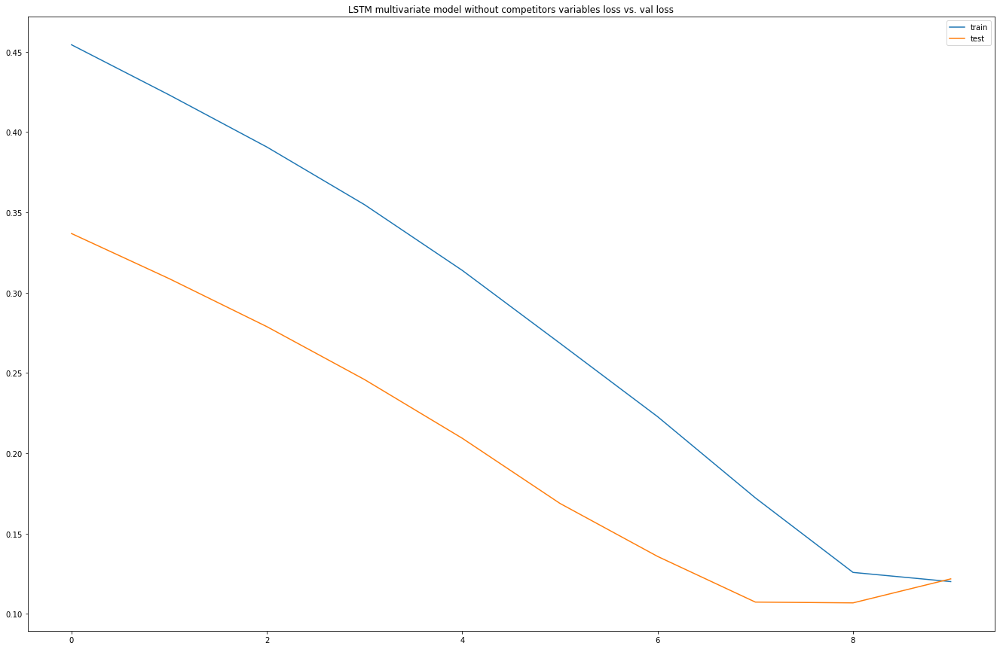

Test RMSE: 1030.588


In [78]:
multivariate_lstm_without_competitor(mcv_dig_250g_own_variable)

### LSTM Multivariate with Competitors'

In [79]:
mcv_dig_250g_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,
2018-10-13,4850.3,3.559244,69,0,10,4,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,5179.0,3.558718,69,0,10,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,5293.5,3.557684,68,0,10,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,5335.8,3.558061,68,0,11,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,5111.3,3.557921,68,0,11,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [80]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    if i == 0:
        names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
        names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
  # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg


In [81]:
def multivariate_with_competitor(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[16,17,18,19,20,21,22,23,24,25,26,27,28,29]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model with competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)


In [82]:
series_to_supervised(mcv_dig_250g_with_comp)

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var6(t),var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-20,4850.3,3.559244,69.0,0.0,10.0,4.0,41.0,2.241567,100.0,0.775123,...,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,5179.0,3.558718,69.0,0.0,10.0,4.0,42.0,2.241541,100.0,0.775011,...,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,5293.5,3.557684,68.0,0.0,10.0,4.0,43.0,2.241566,100.0,0.774954,...,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,5335.8,3.558061,68.0,0.0,11.0,4.0,44.0,2.241457,100.0,0.775021,...,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,5111.3,3.557921,68.0,0.0,11.0,4.0,45.0,2.241417,100.0,0.774982,...,4,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,4304.8,3.999605,58.0,0.0,2.0,1.0,6.0,2.241456,100.0,0.774977,...,1,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,4527.5,3.999050,58.0,0.0,2.0,1.0,7.0,2.241447,100.0,0.774976,...,1,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,4350.5,3.999678,58.0,0.0,2.0,1.0,8.0,2.241482,100.0,0.774958,...,1,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.479544   0.009893   1.000000        0.0   0.818182        1.0   
2   0.554461   0.008713   1.000000        0.0   0.818182        1.0   
3   0.580558   0.006390   0.909091        0.0   0.818182        1.0   
4   0.590199   0.007236   0.909091        0.0   0.909091        1.0   
5   0.539031   0.006921   0.909091        0.0   0.909091        1.0   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1   0.784314   0.994400        1.0    0.980005    0.136842    0.982941   
2   0.803922   0.993778        1.0    0.979163    0.589474    0.982361   
3   0.823529   0.994396        1.0    0.978738    0.589474    0.995712   
4   0.843137   0.991779        1.0    0.979244    0.589474    0.993225   
5   0.862745   0.990829        1.0    0.978948    0.600000    0.986877   

   var13(t-1)  var14(t-1)  var15(t-1)   var1(t)  
1         0.5    0.760128         1.0  0.554461  
2         0.5    0.759899   

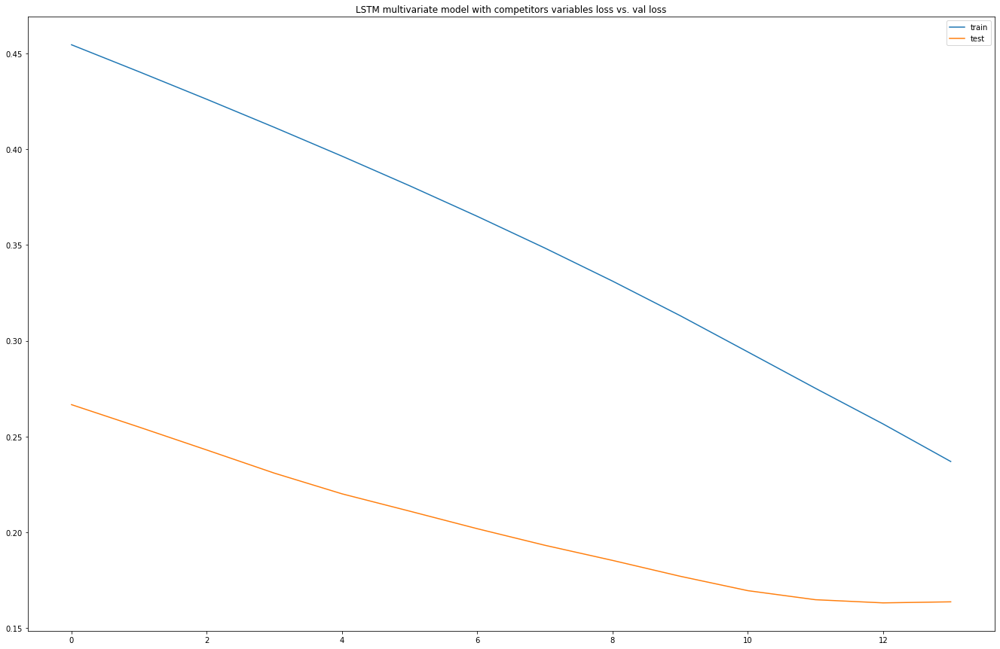

Test RMSE: 910.239


In [83]:
multivariate_with_competitor(mcv_dig_250g_with_comp)

### Tesco Large - McVitie's Digestives 400g

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
0,2014-12-13,78347,39173.5,79616.2,100,0,1.016200,2.032399,4,12,50
1,2014-12-20,83568,41784.0,84988.2,100,0,1.016995,2.033989,4,12,51
2,2014-12-27,68893,34446.5,70350.9,100,0,1.021162,2.042324,4,12,52
3,2015-01-03,51032,25516.0,52059.5,100,0,1.020134,2.040269,1,1,1
4,2015-01-10,57749,28874.5,58890.2,100,0,1.019761,2.039523,1,1,2


(275, 11)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000
mean,75168.345455,34708.030182,76682.187636,99.418182,0.0,1.019348,2.219072,2.469091,6.414545,26.043636
std,12253.884201,5818.124410,12669.131085,4.666588,0.0,0.055092,0.260179,1.140635,3.547767,15.490223
min,11859.000000,5929.500000,8659.900000,32.000000,0.0,0.688175,1.376351,1.000000,1.000000,1.000000
25%,68407.000000,31948.000000,70161.900000,100.000000,0.0,1.000520,2.001226,1.000000,3.000000,12.000000
50%,74856.000000,34194.500000,77097.200000,100.000000,0.0,1.000696,2.201081,2.000000,6.000000,26.000000
75%,81863.000000,37139.250000,83212.100000,100.000000,0.0,1.030717,2.501570,3.500000,9.500000,39.500000
95%,95479.400000,46621.200000,95618.290000,100.000000,0.0,1.100870,2.501947,4.000000,12.000000,50.000000
99%,103800.840000,48888.840000,107197.874000,100.000000,0.0,1.190843,2.977107,4.000000,12.000000,52.000000
max,111030.000000,53374.000000,112421.200000,100.000000,0.0,1.191022,2.977555,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg       

<Figure size 432x288 with 0 Axes>

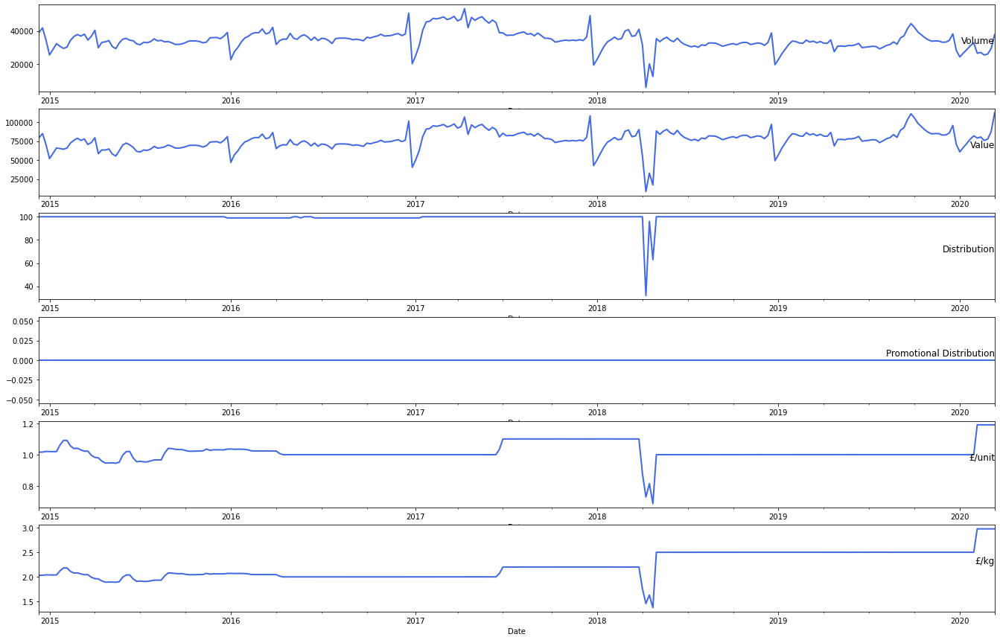

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd90cb4ed30>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd90cac3ba8>)

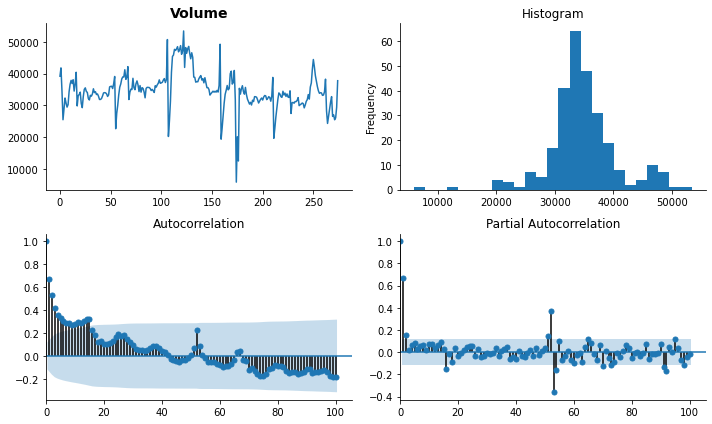

In [84]:
basic_info(mcv_dig_400g_origin)
plot_data(mcv_dig_400g_origin)
tsplot(mcv_dig_400g_origin['Volume'].dropna(), title=mcv_dig_400g_origin.columns[2], lags=100)


Test Statistic                -5.782802e+00
p-value                        5.079624e-07
#Lags Used                     1.000000e+00
Number of Observations Used    2.730000e+02
Critical Value (1%)           -3.454533e+00
Critical Value (5%)           -2.872186e+00
Critical Value (10%)          -2.572443e+00
dtype: float64


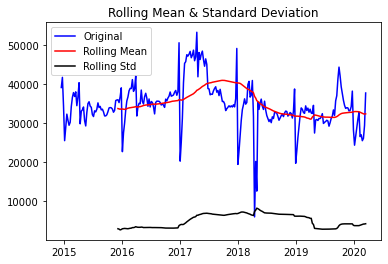

In [85]:
plot(mcv_dig_400g_origin)

#plot stationary graph
# series_transformed=mcv_dig_400g_origin.copy()
# series_transformed['Volume_transformed']=np.log(mcv_dig_400g_origin.Volume).diff(1)
# tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)
# plot_transform(mcv_dig_400g_origin)

       t-1      t+1
0      NaN  39173.5
1  39173.5  41784.0
2  41784.0  34446.5
3  34446.5  25516.0
4  25516.0  28874.5
Test MSE: 7777203.177
Test RMSE: 2788.764


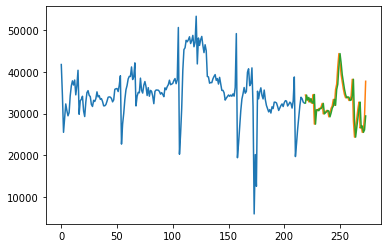

Observations: 275
Training Observations: 220
Testing Observations: 55


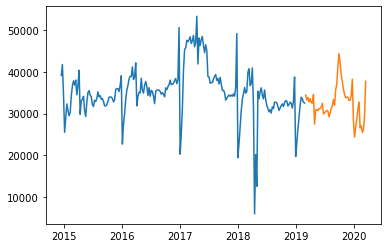

RMSE for Simple Exponential Smoothing α= 0.1 is: 4209.84
RMSE for Simple Exponential Smoothing α= 0.2 is: 4139.35
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 4056.71
RMSE for Simple Exponential Smoothing α= 0.4 is: 4033.71
RMSE for Simple Exponential Smoothing α= 0.5 is: 4035.82
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 4037.96
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 4036.89
RMSE for Simple Exponential Smoothing α= 0.8 is: 4035.14
RMSE for Simple Exponential Smoothing α= 0.9 is: 4034.04


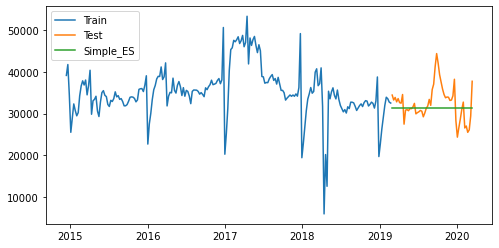

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 4312.06
Observations: 275
Training Observations: 220
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.2 and β= 0.1 is: 4145.46


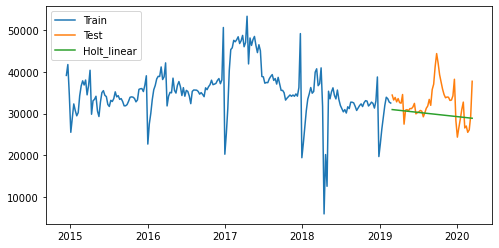

Observations: 275
Training Observations: 208
Testing Observations: 55


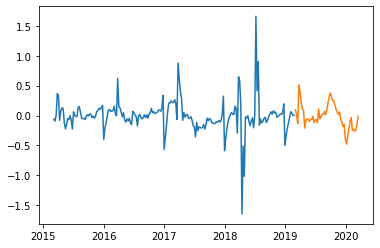

             Volume    pred_value
Date                             
2019-03-02  34455.2  31833.150239
2019-03-09  33267.6  30529.840288
2019-03-16  33879.6  30883.005097
2019-03-23  32824.4  29720.512413
2019-03-30  33608.8  30226.698937
2019-04-06  32637.6  29156.416612
2019-04-13  32506.0  28844.145677
2019-04-20  34588.8  30486.520634
2019-04-27  27474.0  24053.178729
2019-05-04  30836.8  26816.253725
2019-05-11  30958.8  26741.830896
2019-05-18  30700.8  26341.162022
2019-05-25  31223.6  26610.095270
2019-06-01  31192.0  26404.922342
2019-06-08  31597.6  26568.925249
2019-06-15  32459.6  27110.733710
2019-06-22  29940.8  24839.321311
2019-06-29  30234.0  24914.383862
2019-07-06  30444.0  24919.221680
2019-07-13  30760.4  25009.381791
2019-07-20  30580.4  24696.326450
2019-07-27  29236.8  23452.937701
2019-08-03  30151.2  24024.271771
2019-08-10  31284.0  24759.742597
2019-08-17  31829.6  25022.646853
2019-08-24  33411.6  26090.208923
2019-08-31  31990.8  24813.247171
2019-09-07  35

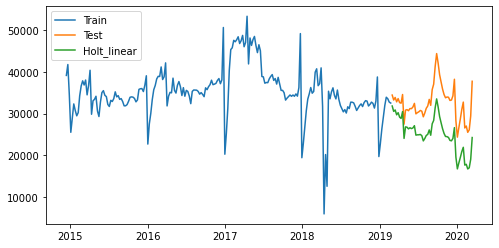

RMSE for Holt Linear Forecasting with transformation is: 7786.804837758103


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/

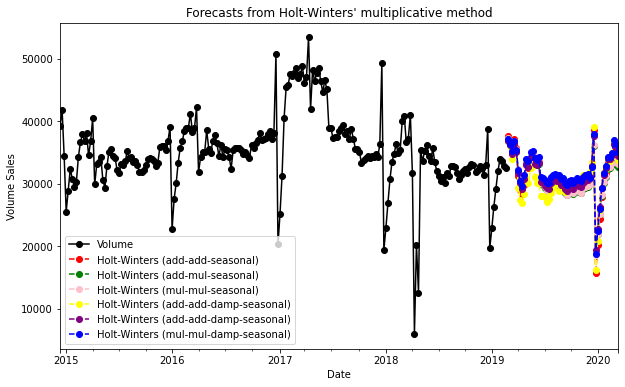

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
5331.343677002187
5390.417944406693
5409.026487994974
5301.032332412285
5181.09088282195
5010.362739906475


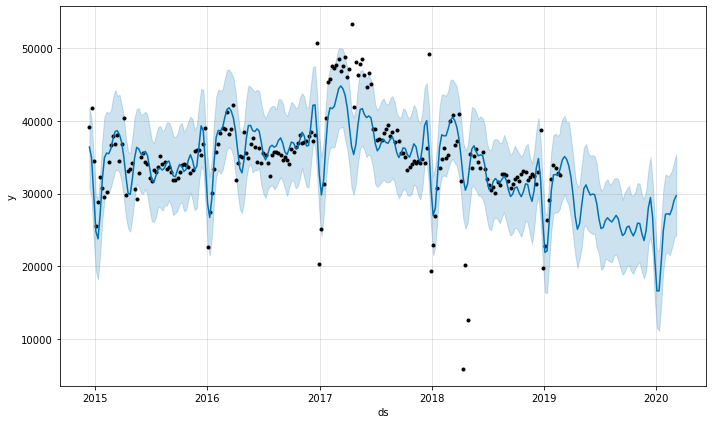

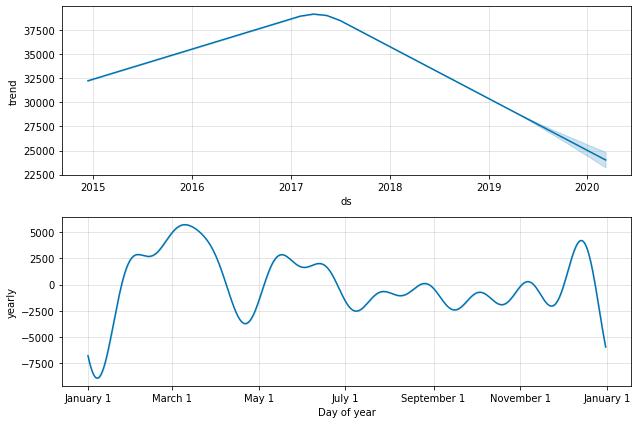

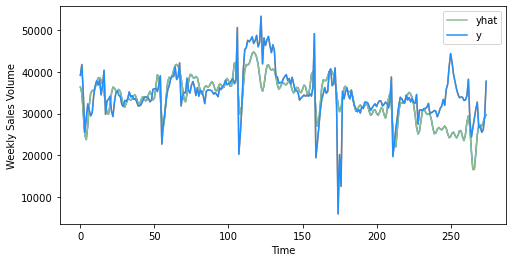

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 5048.407437410792


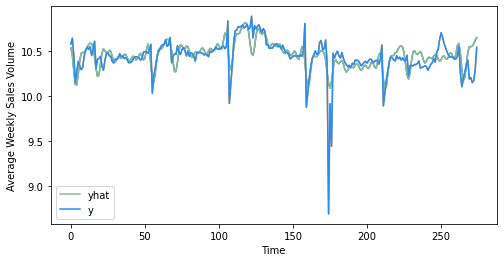

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 4174.285950060743
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

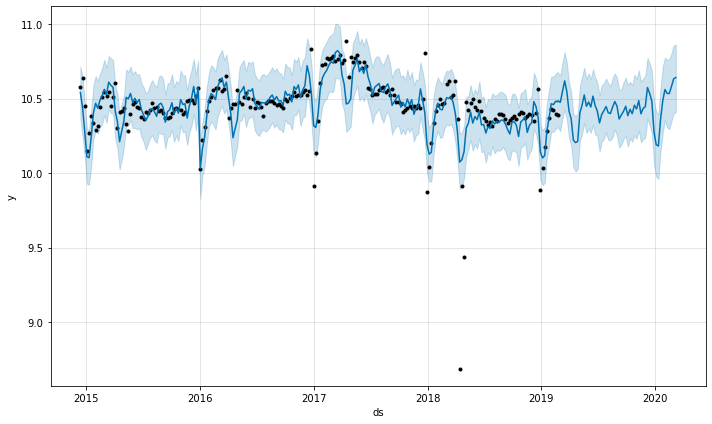

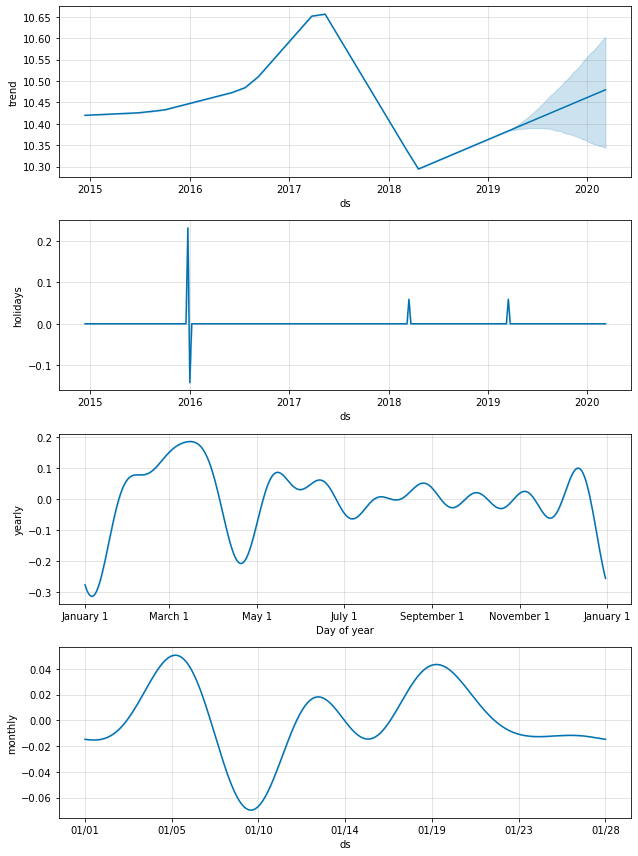

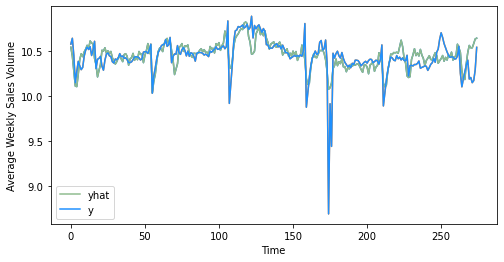

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 4186.581503045961


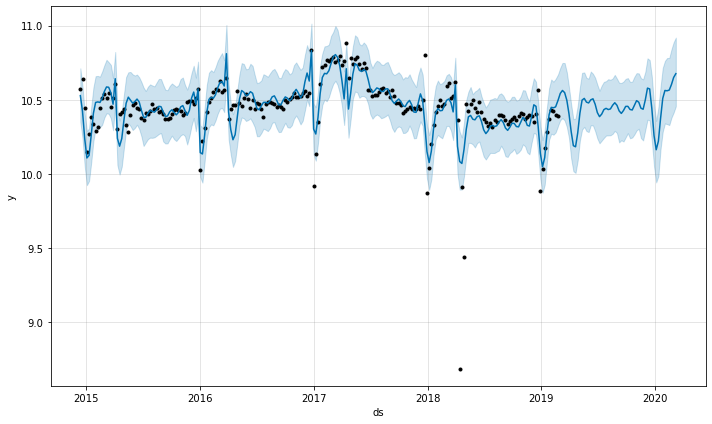

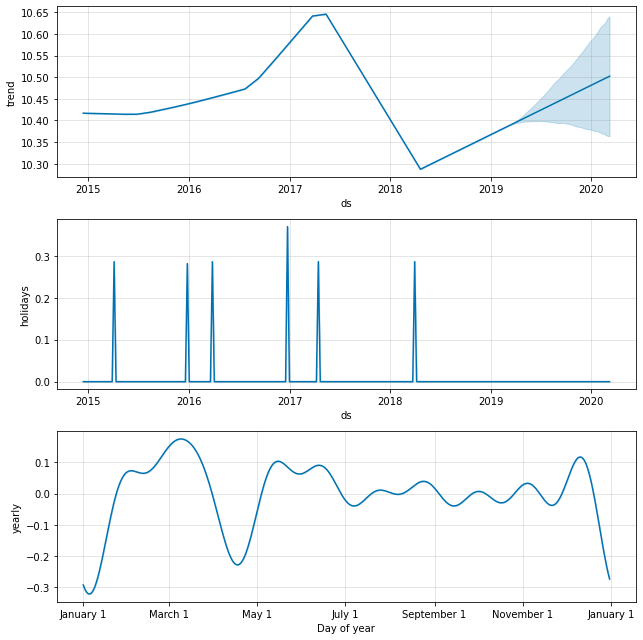

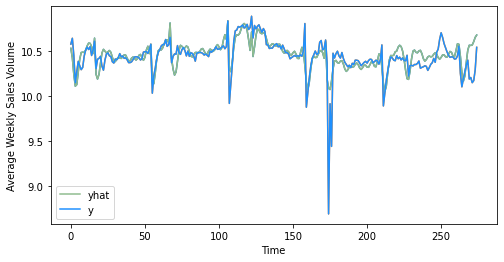

4004.8712115929848


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [132]:
# #plot stationary graph
# series_transformed=mcv_dig_400g_origin.copy()
# series_transformed['Volume_transformed']=np.log(mcv_dig_400g_origin.Volume).diff(1)
# tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)
# plot_transform(mcv_dig_400g_origin)

#time series models
baseline_model(mcv_dig_400g_origin)
ses_model(mcv_dig_400g_origin)
holt_linear_model(mcv_dig_400g_origin)
holt_linear_model_log(mcv_dig_400g_origin)
holt_winter_model(mcv_dig_400g_origin)
prophet_model(mcv_dig_400g_origin)
prophet_model_log(mcv_dig_400g_origin)
prophet_log_season(mcv_dig_400g_origin)
prophet_log_two_holiday(mcv_dig_400g_origin)


Observations: 27
Training Observations: 15
Testing Observations: 12
[  0.50495614  -2.67383117  -1.49482443 -59.83498942 -11.47956437]
Mean Absolute Error: 3451.9033333333405
Mean Squared Error: 12729396.87153338
Root Mean Squared Error: 3567.8280327859666
Observations: 39
Training Observations: 27
Testing Observations: 12
[ -0.21136685  -6.13988269 -18.12677748   0.20638762  -0.15936959]
Mean Absolute Error: 2957.3933333333293
Mean Squared Error: 15063050.085133309
Root Mean Squared Error: 3881.114541614729
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.40529447 -16.46581451  -0.2842669   -4.81276492  -0.72300587]
Mean Absolute Error: 3083.1366666666668
Mean Squared Error: 22487591.430066675
Root Mean Squared Error: 4742.108331751467
Observations: 63
Training Observations: 51
Testing Observations: 12
[-0.83417359  0.33319334 -5.48066035 -2.58335598 -0.60536698]
Mean Absolute Error: 2134.143333333337
Mean Squared Error: 6608134.783533342
Root Mean Squared Erro

,var1(t-1),var1(t)
Date,,
2014-12-20,39173.5,41784.0
2014-12-27,41784.0,34446.5
2015-01-03,34446.5,25516.0
2015-01-10,25516.0,28874.5
2015-01-17,28874.5,32329.0
...,...,...
2020-02-15,26556.8,27026.8
2020-02-22,27026.8,25507.2
2020-02-29,25507.2,26099.6


   var1(t-1)   var1(t)
1   0.700692  0.755715
2   0.755715  0.601060
3   0.601060  0.412830
4   0.412830  0.483618
5   0.483618  0.556429
(219, 1, 1) (219,) (55, 1, 1) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 2s - loss: 0.6076 - val_loss: 0.5381
Epoch 2/50
219/219 - 0s - loss: 0.5910 - val_loss: 0.5214
Epoch 3/50
219/219 - 0s - loss: 0.5736 - val_loss: 0.5039
Epoch 4/50
219/219 - 0s - loss: 0.5553 - val_loss: 0.4850
Epoch 5/50
219/219 - 0s - loss: 0.5356 - val_loss: 0.4646
Epoch 6/50
219/219 - 0s - loss: 0.5141 - val_loss: 0.4421
Epoch 7/50
219/219 - 0s - loss: 0.4904 - val_loss: 0.4171
Epoch 8/50
219/219 - 0s - loss: 0.4640 - val_loss: 0.3892
Epoch 9/50
219/219 - 0s - loss: 0.4345 - val_loss: 0.3578
Epoch 10/50
219/219 - 0s - loss: 0.4013 - val_loss: 0.3222
Epoch 11/50
219/219 - 0s - loss: 0.3640 - val_loss: 0.2820
Epoch 12/50
219/219 - 0s - loss: 0.3226 - val_loss: 0.2362
Epoch 13/50
219/219 - 0s - loss: 0.2756 - val_loss: 0.1842
Epoch 14/50
219/219 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

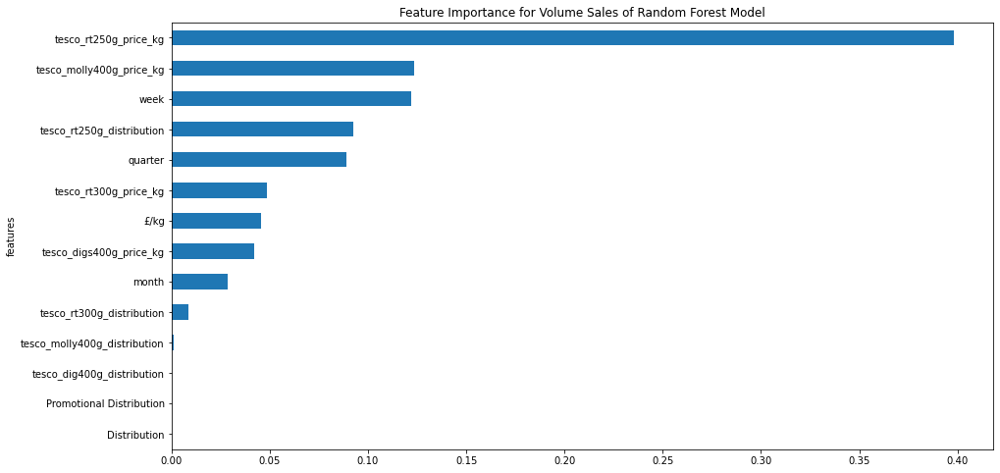

<Figure size 432x288 with 0 Axes>

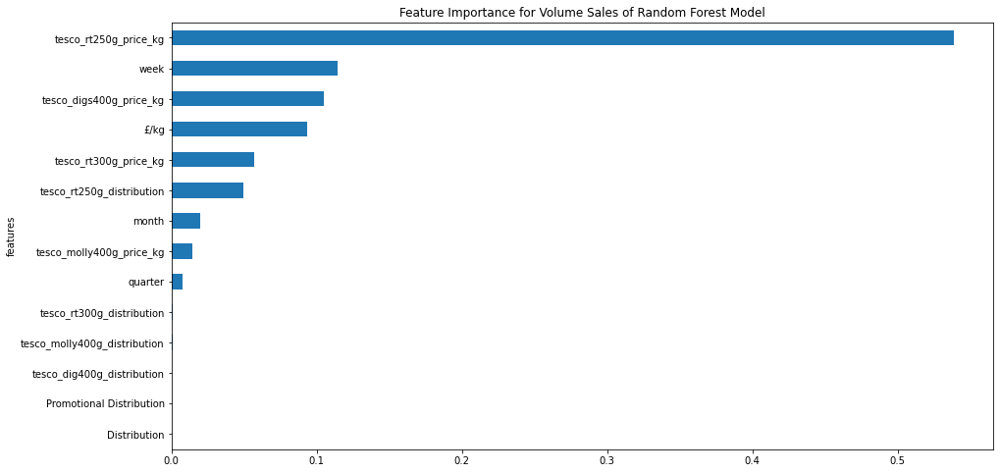

<Figure size 432x288 with 0 Axes>

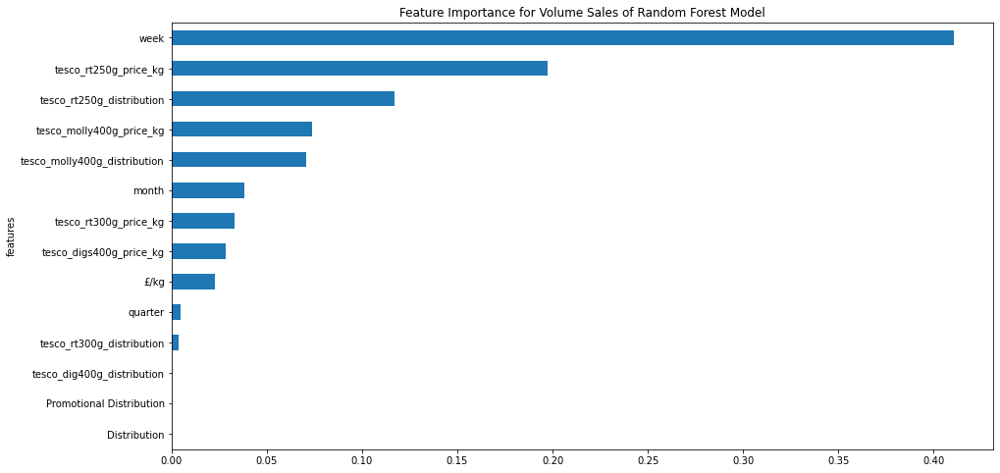

<Figure size 432x288 with 0 Axes>

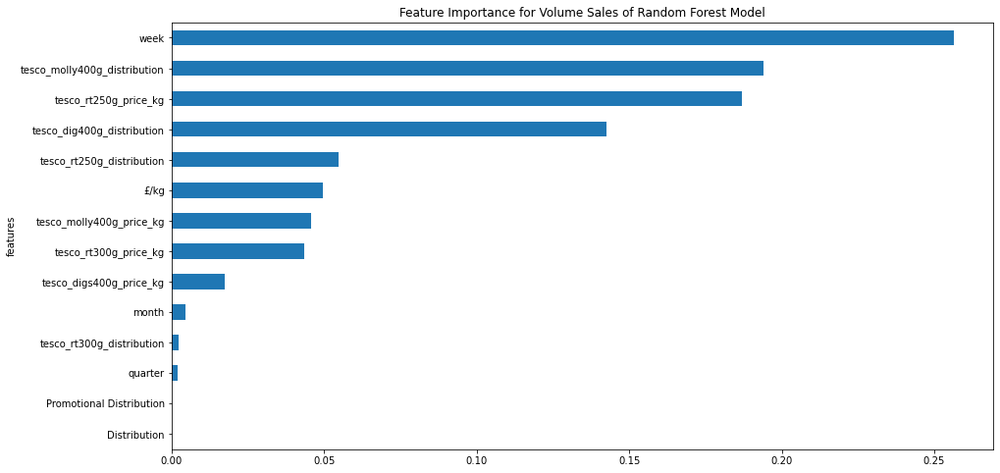

<Figure size 432x288 with 0 Axes>

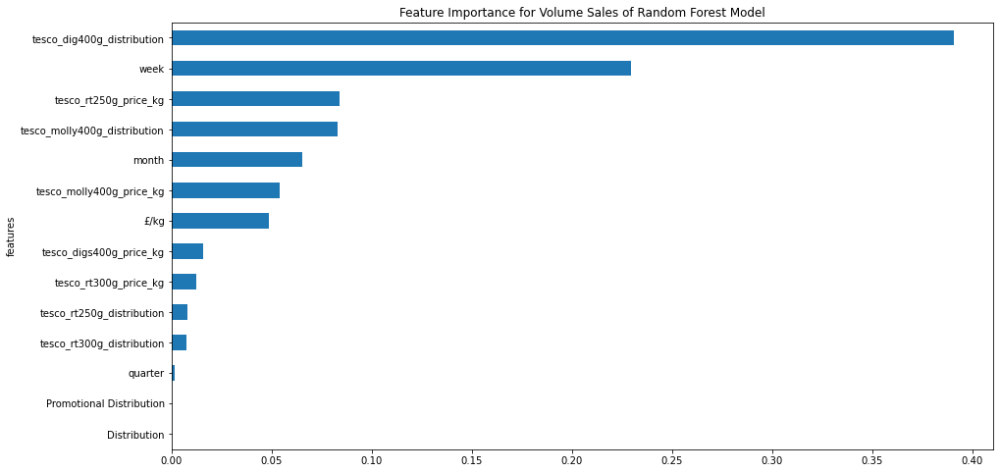

<Figure size 432x288 with 0 Axes>

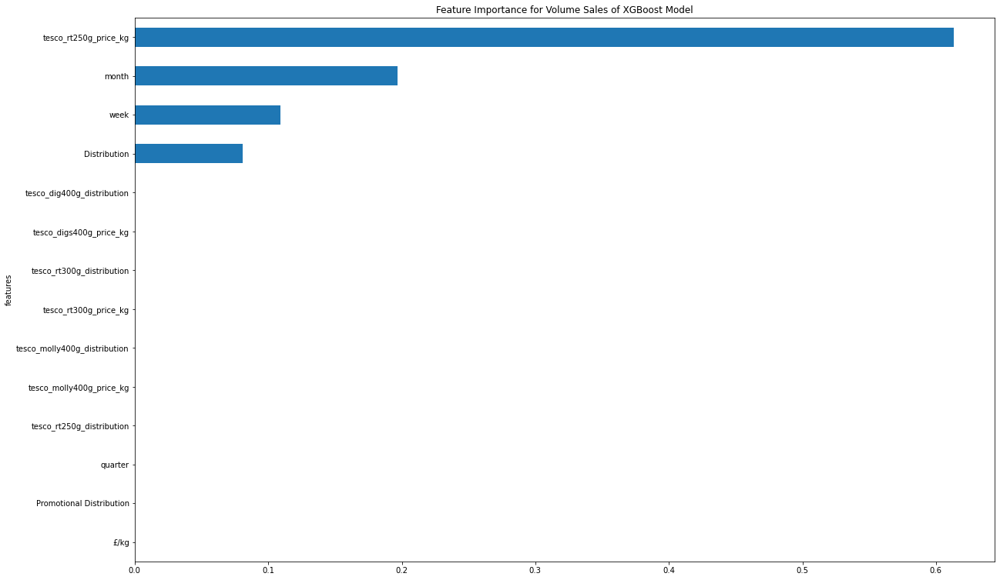

<Figure size 432x288 with 0 Axes>

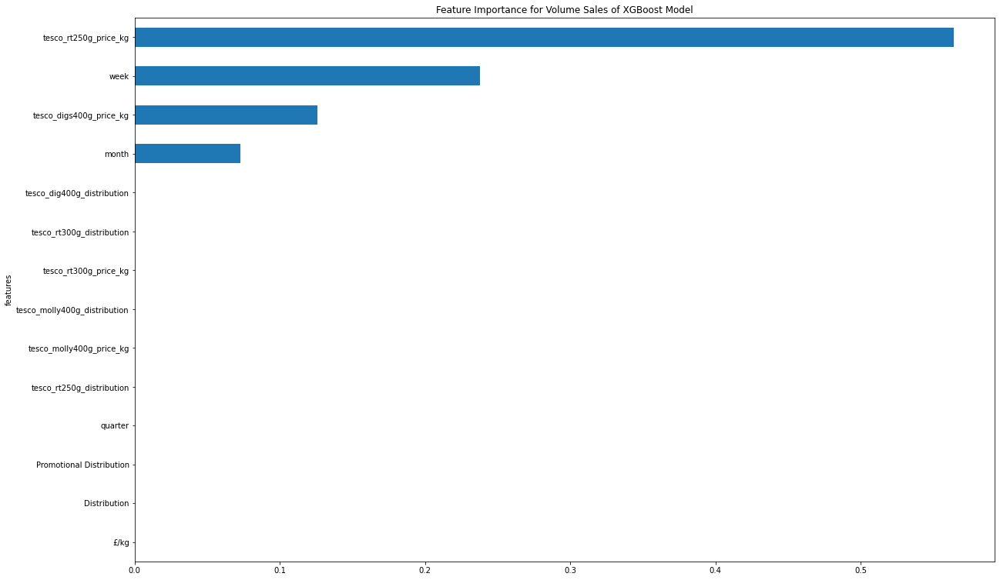

<Figure size 432x288 with 0 Axes>

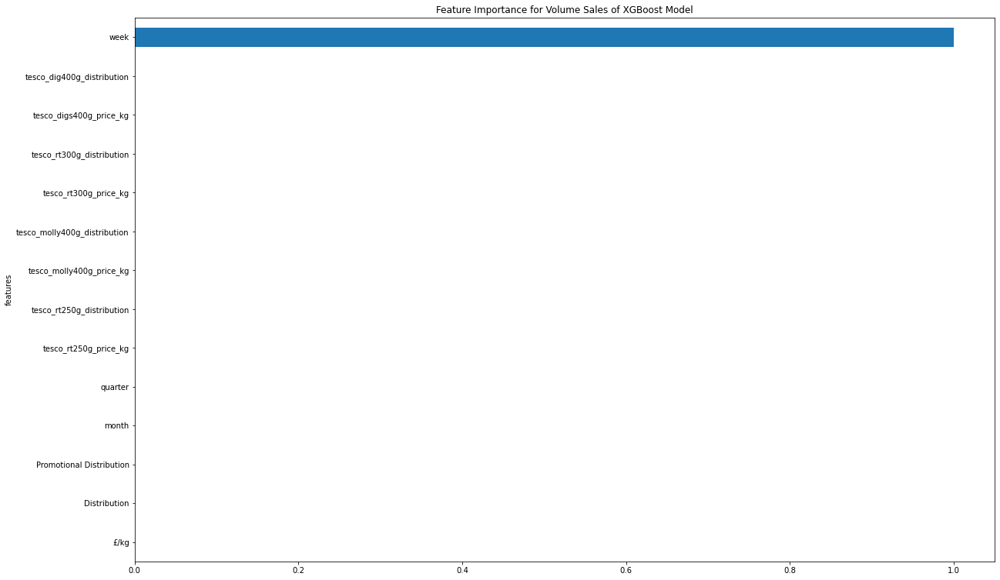

<Figure size 432x288 with 0 Axes>

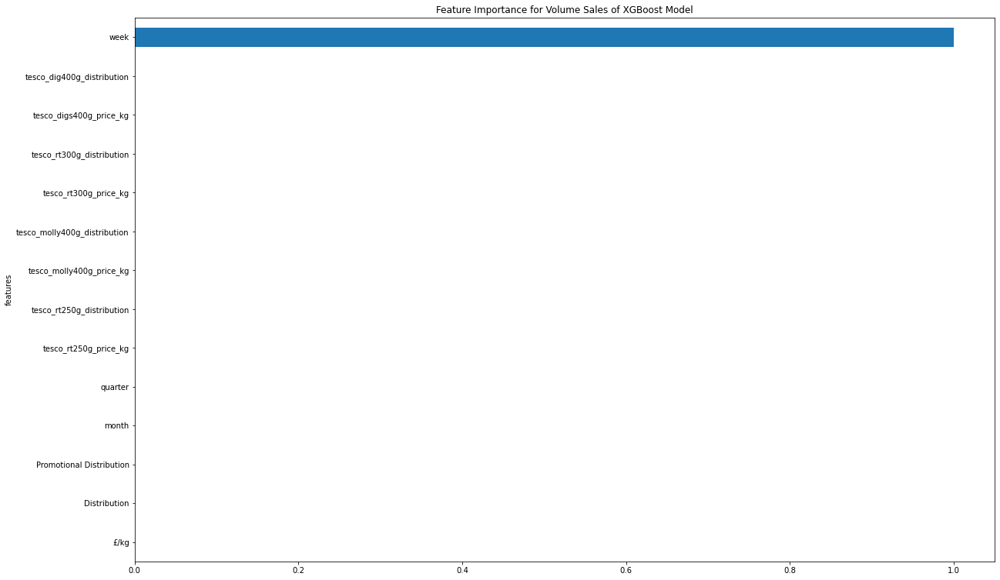

<Figure size 432x288 with 0 Axes>

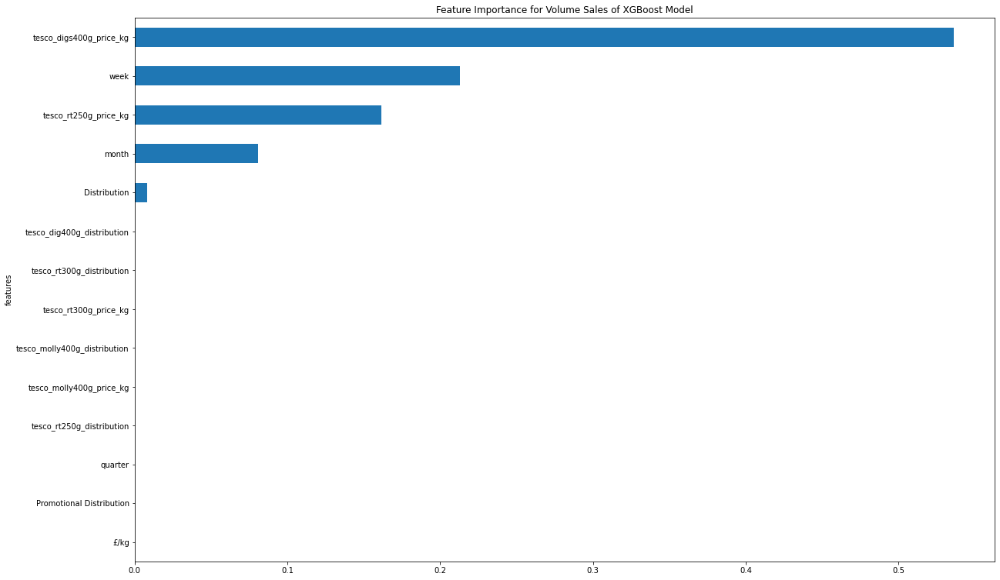

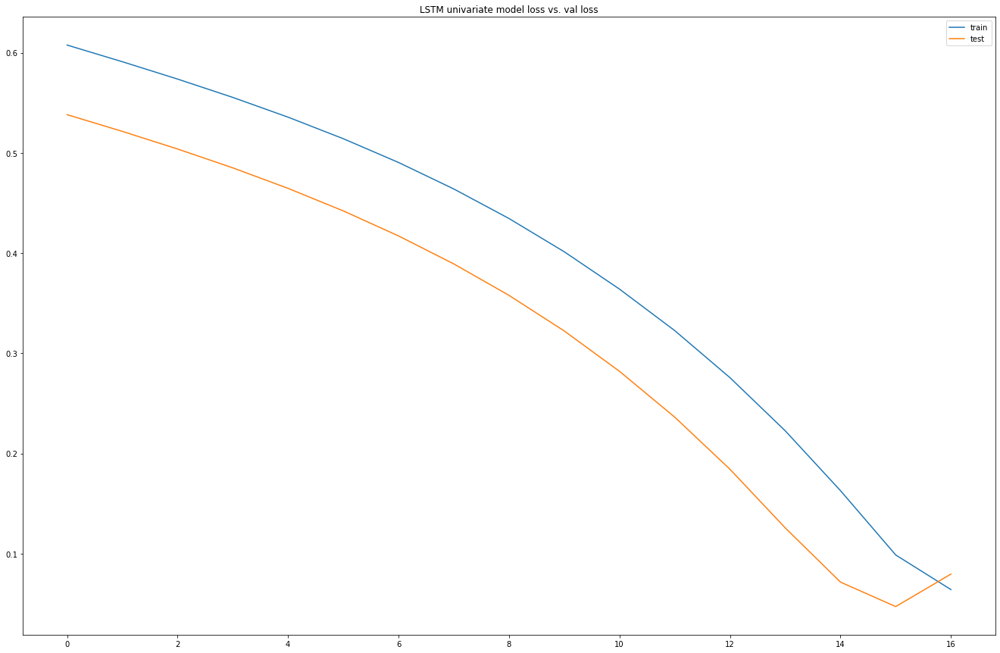

Test RMSE: 4379.034


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t)
Date,,,,,,,,,,,,,,
2014-12-20,39173.5,2.032399,100.0,0.0,12.0,4.0,50.0,41784.0,2.033989,100,0,12,4,51
2014-12-27,41784.0,2.033989,100.0,0.0,12.0,4.0,51.0,34446.5,2.042324,100,0,12,4,52
2015-01-03,34446.5,2.042324,100.0,0.0,12.0,4.0,52.0,25516.0,2.040269,100,0,1,1,1
2015-01-10,25516.0,2.040269,100.0,0.0,1.0,1.0,1.0,28874.5,2.039523,100,0,1,1,2
2015-01-17,28874.5,2.039523,100.0,0.0,1.0,1.0,2.0,32329.0,2.040478,100,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,26556.8,2.977072,100.0,0.0,2.0,1.0,6.0,27026.8,2.977519,100,0,2,1,7
2020-02-22,27026.8,2.977519,100.0,0.0,2.0,1.0,7.0,25507.2,2.977555,100,0,2,1,8
2020-02-29,25507.2,2.977555,100.0,0.0,2.0,1.0,8.0,26099.6,2.977099,100,0,2,1,9


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.700692   0.409722        1.0        0.0        1.0        1.0   
2   0.755715   0.410715        1.0        0.0        1.0        1.0   
3   0.601060   0.415920        1.0        0.0        1.0        1.0   
4   0.412830   0.414637        1.0        0.0        0.0        0.0   
5   0.483618   0.414171        1.0        0.0        0.0        0.0   

   var7(t-1)   var1(t)  
1   0.942308  0.755715  
2   0.961538  0.601060  
3   0.980769  0.412830  
4   0.000000  0.483618  
5   0.019231  0.556429  
(219, 1, 7) (219,) (55, 1, 7) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 2s - loss: 0.6174 - val_loss: 0.5337
Epoch 2/50
219/219 - 0s - loss: 0.5826 - val_loss: 0.4976
Epoch 3/50
219/219 - 0s - loss: 0.5473 - val_loss: 0.4591
Epoch 4/50
219/219 - 0s - loss: 0.5092 - val_loss: 0.4160
Epoch 5/50
219/219 - 0s - loss: 0.4660 - val_loss: 0.3656
Epoch 6/50
219/219 - 0s - loss: 0.4153 - val_loss: 0

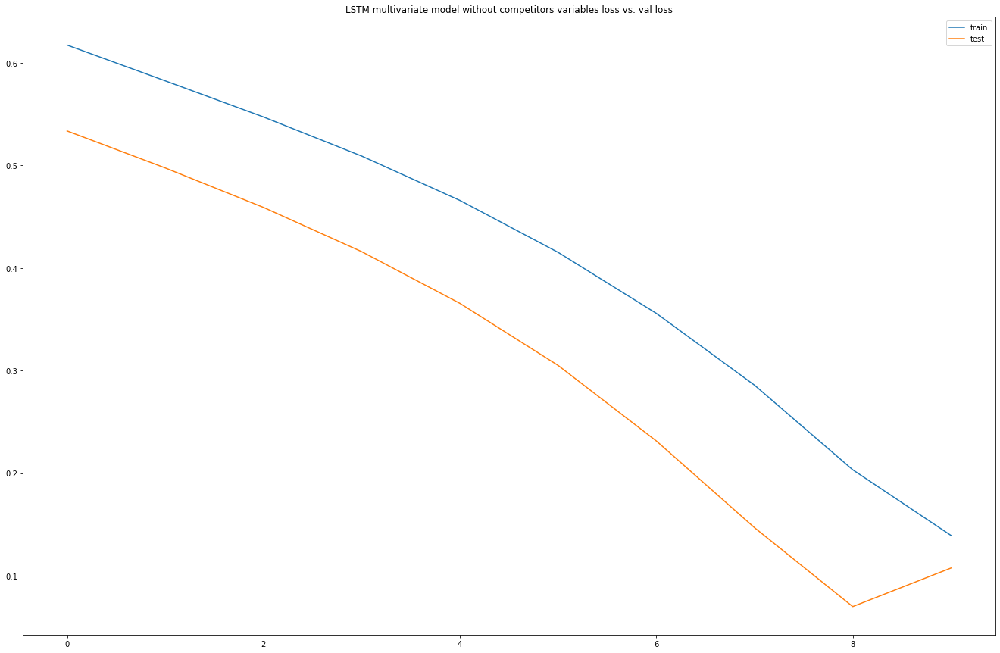

Test RMSE: 6255.587


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var6(t),var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-20,31698.0,2.501574,100.0,0.0,10.0,4.0,41.0,2.241567,100.0,0.775123,...,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,32629.2,2.501698,100.0,0.0,10.0,4.0,42.0,2.241541,100.0,0.775011,...,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,33110.0,2.501824,100.0,0.0,10.0,4.0,43.0,2.241566,100.0,0.774954,...,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,33014.8,2.501599,100.0,0.0,11.0,4.0,44.0,2.241457,100.0,0.775021,...,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,31830.0,2.501929,100.0,0.0,11.0,4.0,45.0,2.241417,100.0,0.774982,...,4,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,26556.8,2.977072,100.0,0.0,2.0,1.0,6.0,2.241456,100.0,0.774977,...,1,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,27026.8,2.977519,100.0,0.0,2.0,1.0,7.0,2.241447,100.0,0.774976,...,1,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,25507.2,2.977555,100.0,0.0,2.0,1.0,8.0,2.241482,100.0,0.774958,...,1,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.485638   0.000515        0.0        0.0   0.818182        1.0   
2   0.523311   0.000773        0.0        0.0   0.818182        1.0   
3   0.542762   0.001039        0.0        0.0   0.818182        1.0   
4   0.538911   0.000567        0.0        0.0   0.909091        1.0   
5   0.490978   0.001259        0.0        0.0   0.909091        1.0   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1   0.784314   0.994400        1.0    0.980005    0.136842    0.982941   
2   0.803922   0.993778        1.0    0.979163    0.589474    0.982361   
3   0.823529   0.994396        1.0    0.978738    0.589474    0.995712   
4   0.843137   0.991779        1.0    0.979244    0.589474    0.993225   
5   0.862745   0.990829        1.0    0.978948    0.600000    0.986877   

   var13(t-1)  var14(t-1)  var15(t-1)   var1(t)  
1         0.5    0.760128         1.0  0.523311  
2         0.5    0.759899   

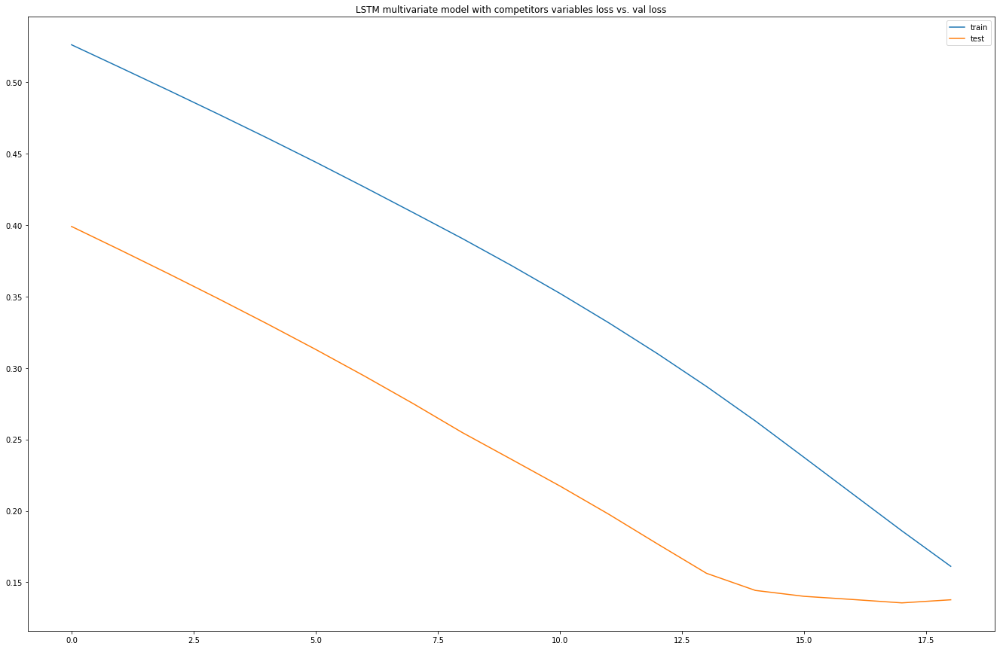

Test RMSE: 4070.847


In [87]:
#ml models
mcv_dig_400g_input_X,mcv_dig_400g_input_Y=input_var(mcv_dig_400g_with_comp)
rf_regressor_mcv(mcv_dig_400g_input_X,mcv_dig_400g_input_Y)

mcv_dig_250g_input_X,mcv_dig_250g_input_Y=input_var(mcv_dig_250g_with_comp)
xgb_regressor_mcv(mcv_dig_250g_input_X,mcv_dig_250g_input_Y)

#lstm models
series_to_supervised(mcv_dig_400g_volume)
lstm_univariate(mcv_dig_400g_volume)

series_to_supervised(mcv_dig_400g_own_variable)
multivariate_lstm_without_competitor(mcv_dig_400g_own_variable)

series_to_supervised(mcv_dig_400g_with_comp)
multivariate_with_competitor(mcv_dig_400g_with_comp)

### Tesco Large - McVitie's Digestives 400g Twin Pack

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
0,2014-12-13,40945,40945.0,77372.6,96,0,1.889672,1.889672,4,12,50
1,2014-12-20,43265,43265.0,81754.1,96,0,1.889613,1.889613,4,12,51
2,2014-12-27,34195,34195.0,64618.4,96,0,1.889703,1.889703,4,12,52
3,2015-01-03,26667,26667.0,50390.0,96,0,1.889601,1.889601,1,1,1
4,2015-01-10,31957,31957.0,60388.8,96,0,1.889689,1.889689,1,1,2


(275, 11)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000
mean,36779.381818,33916.016727,69716.069455,94.858182,0.0,1.896369,2.067643,2.469091,6.414545,26.043636
std,6871.435738,6245.329915,12820.214358,8.254941,0.0,0.082345,0.250159,1.140635,3.547767,15.490223
min,6129.000000,6129.000000,8001.000000,23.000000,0.0,1.305433,1.305433,1.000000,1.000000,1.000000
25%,33385.500000,30186.900000,62796.650000,97.000000,0.0,1.889671,1.889799,1.000000,3.000000,12.000000
50%,37153.000000,33301.000000,70816.300000,98.000000,0.0,1.889863,1.890073,2.000000,6.000000,26.000000
75%,39870.500000,37904.500000,75634.250000,98.000000,0.0,1.890003,2.362057,3.500000,9.500000,39.500000
95%,45736.900000,42645.840000,85332.960000,98.000000,0.0,1.989909,2.362570,4.000000,12.000000,50.000000
99%,61387.080000,54761.120000,101580.580000,98.000000,0.0,1.989997,2.487385,4.000000,12.000000,52.000000
max,78414.000000,63655.000000,156042.300000,98.000000,0.0,2.612341,3.265426,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg       

<Figure size 432x288 with 0 Axes>

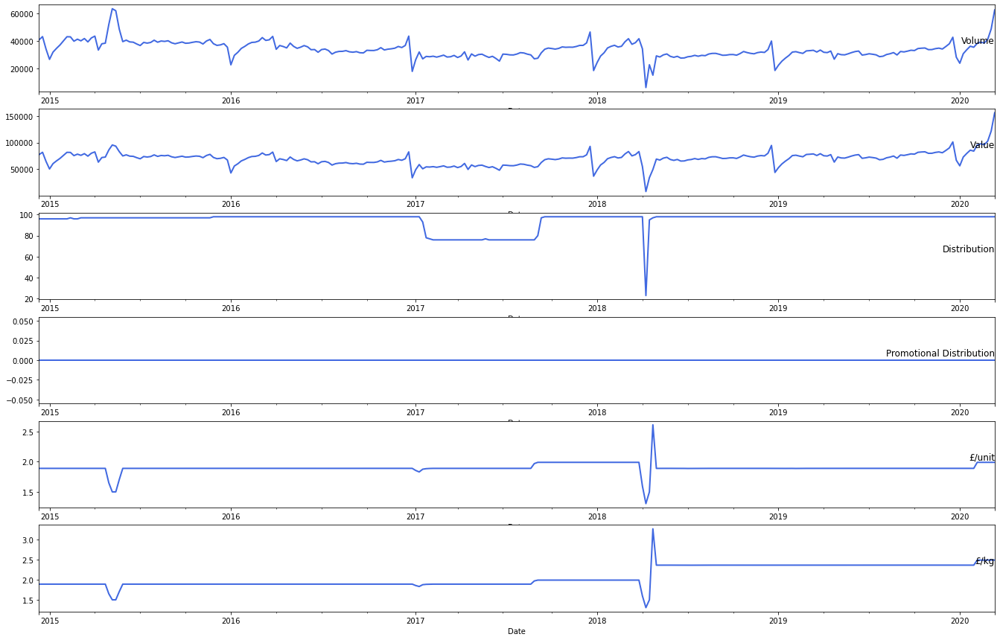

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8f8676630>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8f85e8940>)

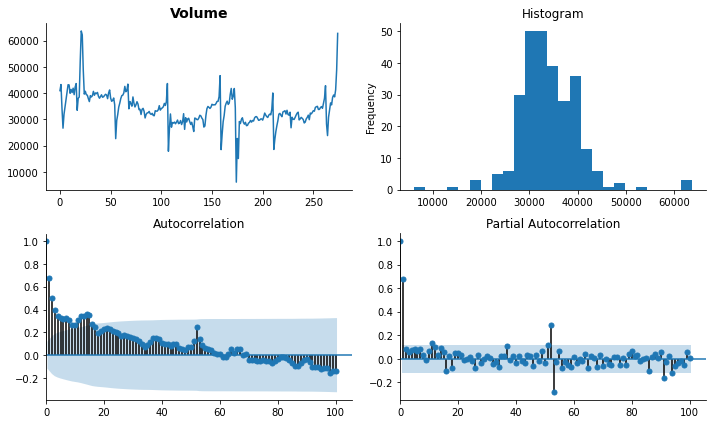

In [88]:
basic_info(mcv_dig_400g_twin_origin)
plot_data(mcv_dig_400g_twin_origin)
tsplot(mcv_dig_400g_twin_origin['Volume'].dropna(), title=mcv_dig_400g_twin_origin.columns[2], lags=100)


Test Statistic                  -4.984032
p-value                          0.000024
#Lags Used                       1.000000
Number of Observations Used    273.000000
Critical Value (1%)             -3.454533
Critical Value (5%)             -2.872186
Critical Value (10%)            -2.572443
dtype: float64


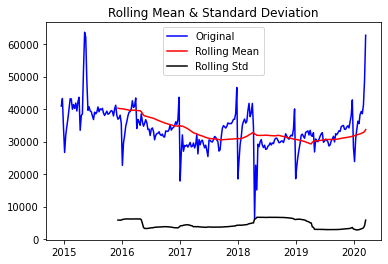

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8f84a7cc0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8f83423c8>)

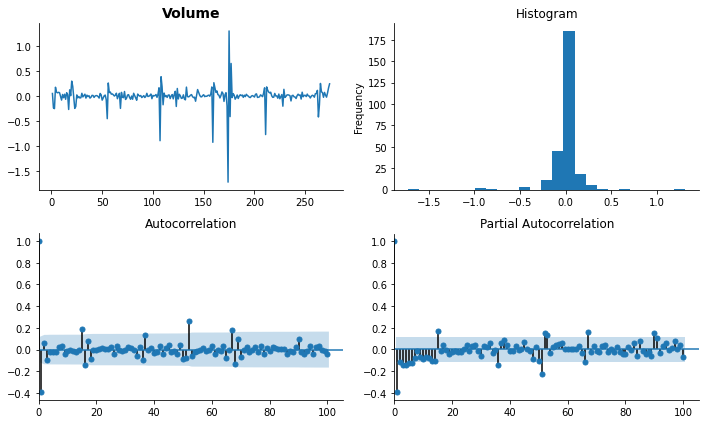

In [89]:
plot(mcv_dig_400g_twin_origin)
series_transformed=mcv_dig_400g_twin_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_dig_400g_twin_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_400g_twin_origin.columns[2], lags=100)


       t-1      t+1
0      NaN  40945.0
1  40945.0  43265.0
2  43265.0  34195.0
3  34195.0  26667.0
4  26667.0  31957.0
Test MSE: 12481696.733
Test RMSE: 3532.944


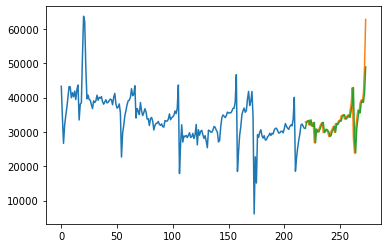

Observations: 275
Training Observations: 220
Testing Observations: 55


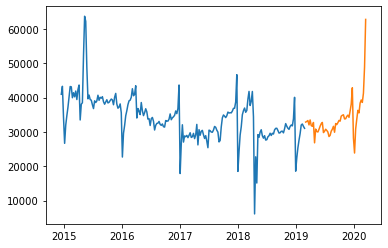

RMSE for Simple Exponential Smoothing α= 0.1 is: 6654.97
RMSE for Simple Exponential Smoothing α= 0.2 is: 6547.99
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 6357.34
RMSE for Simple Exponential Smoothing α= 0.4 is: 6204.51
RMSE for Simple Exponential Smoothing α= 0.5 is: 6124.74
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 6101.84
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 6112.2
RMSE for Simple Exponential Smoothing α= 0.8 is: 6137.69
RMSE for Simple Exponential Smoothing α= 0.9 is: 6166.79


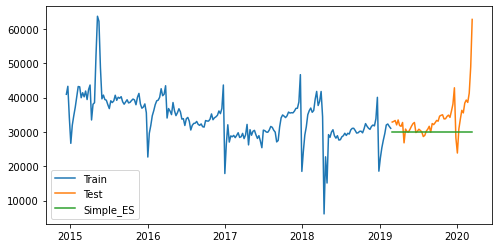

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 6839.18
Observations: 275
Training Observations: 220
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.1 and β= 0.8 is: 4798.27


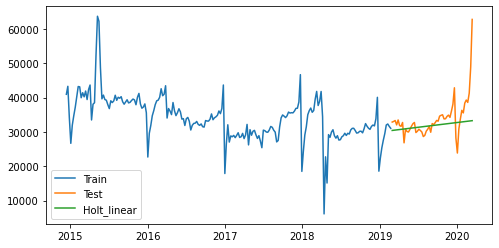

Observations: 275
Training Observations: 208
Testing Observations: 55


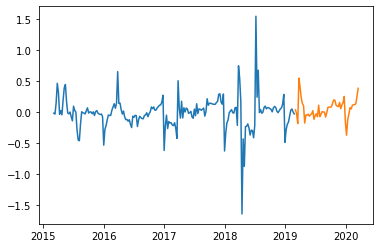

             Volume    pred_value
Date                             
2019-03-02  32858.4  31927.054422
2019-03-09  33044.8  31915.507903
2019-03-16  33306.4  31975.144668
2019-03-23  32035.2  30570.212414
2019-03-30  33474.4  31751.921353
2019-04-06  31841.6  30021.907551
2019-04-13  31624.0  29637.829435
2019-04-20  32735.2  30495.150691
2019-04-27  26814.4  24829.619303
2019-05-04  30820.0  28367.483029
2019-05-11  30091.2  27530.485399
2019-05-18  29973.6  27258.343550
2019-05-25  30748.8  27795.527302
2019-06-01  31648.8  28437.419568
2019-06-08  32377.6  28917.702352
2019-06-15  32746.4  29071.596649
2019-06-22  29802.4  26299.213060
2019-06-29  30188.8  26480.339963
2019-07-06  30772.0  26829.935094
2019-07-13  30415.2  26359.718435
2019-07-20  29964.0  25812.856728
2019-07-27  28642.4  24526.291188
2019-08-03  28981.6  24667.834430
2019-08-10  30220.0  25567.562062
2019-08-17  30779.2  25884.416454
2019-08-24  31623.2  26434.619148
2019-08-31  29894.4  24839.524413
2019-09-07  32

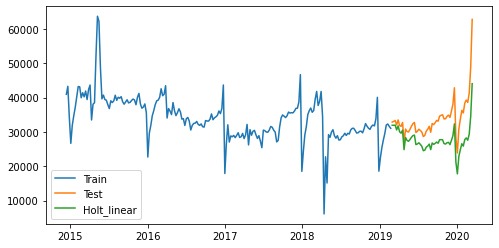

RMSE for Holt Linear Forecasting with transformation is: 6952.5021027550465


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

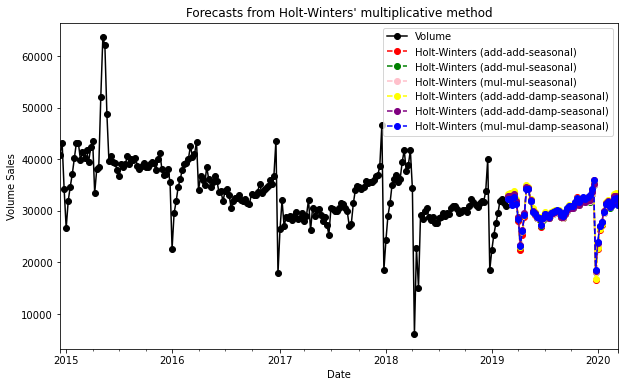

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
6260.271164228724
6335.365796425167
6292.340961731638
6076.84683375971
6149.536608321851
6176.926623305657


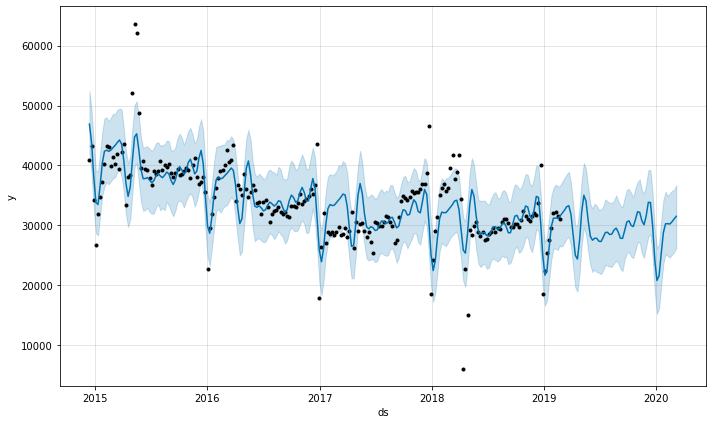

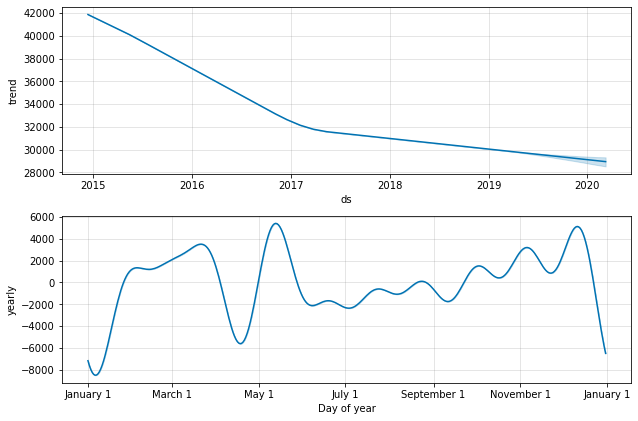

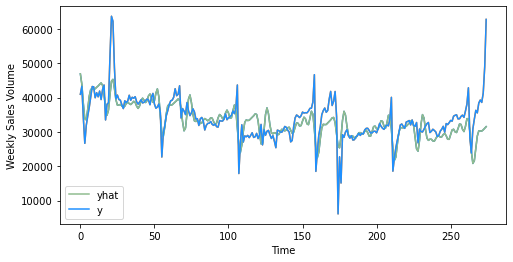

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 4809.125119002391


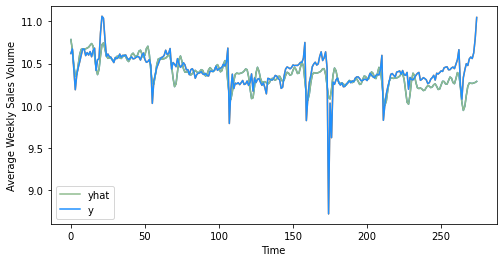

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 5026.988836311825
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

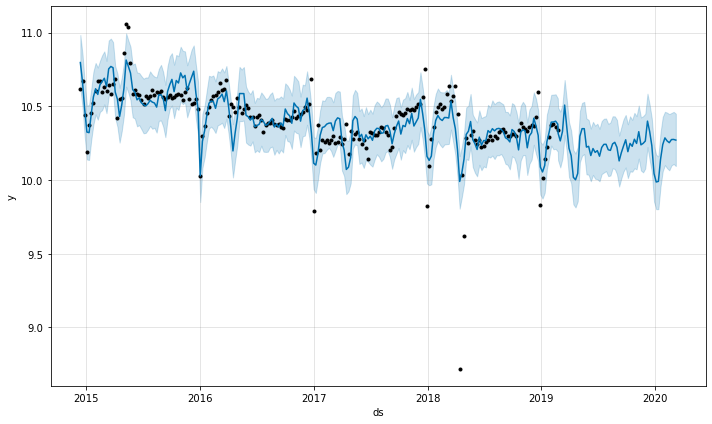

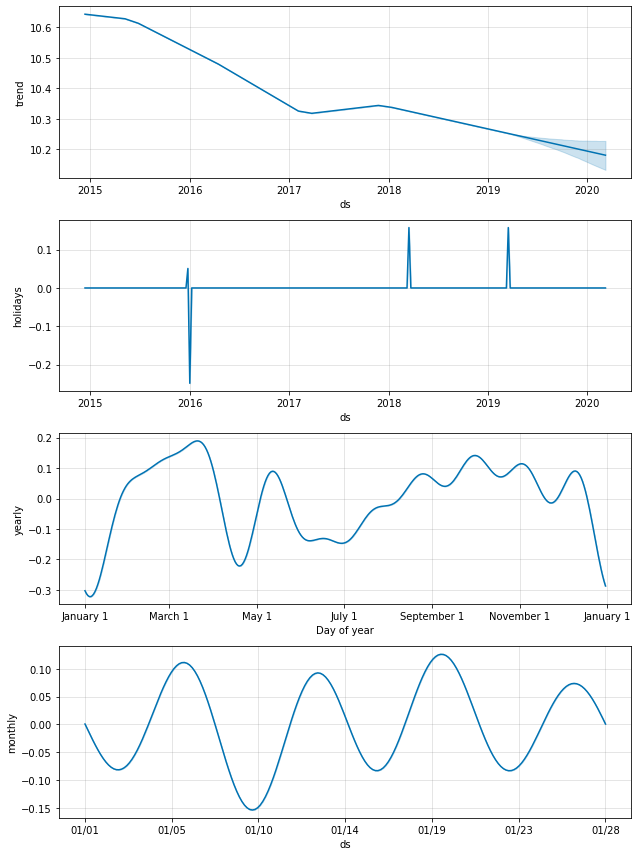

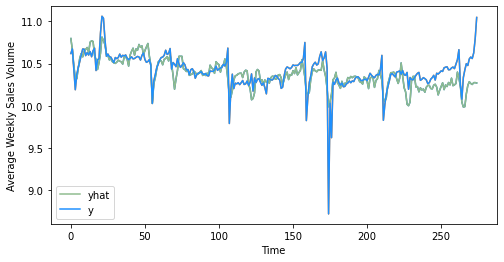

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 5059.318876463421


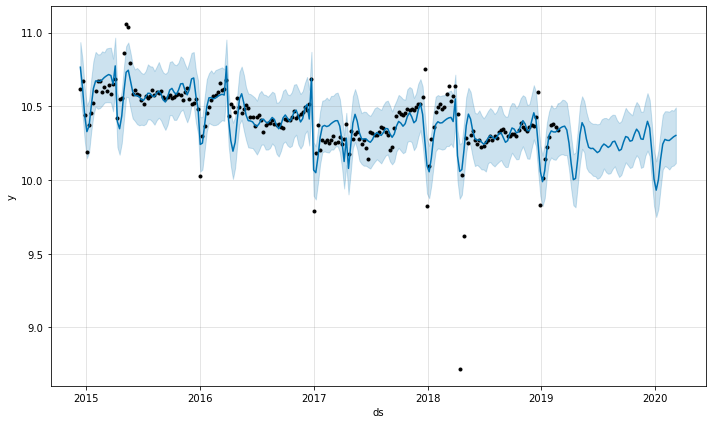

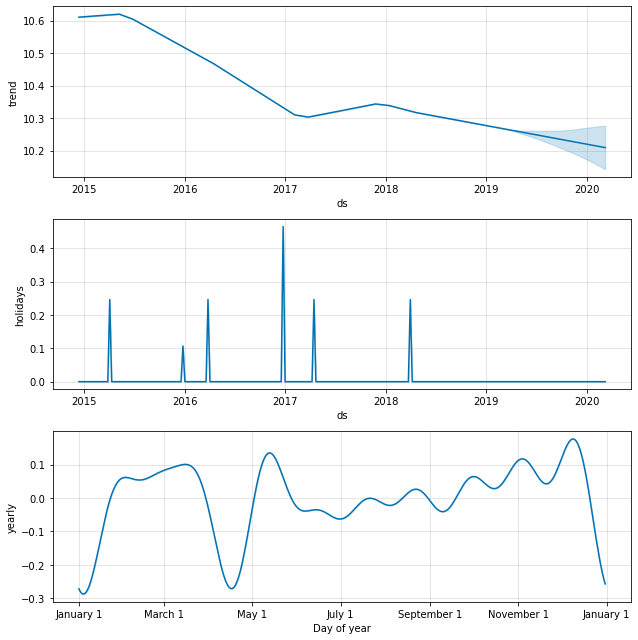

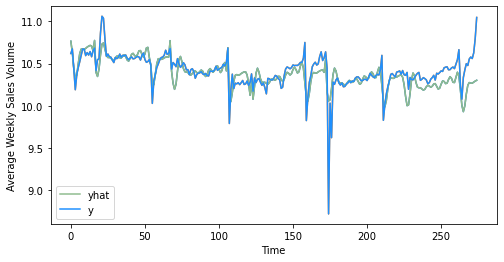

4865.595713578276


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [133]:
#time series models
baseline_model(mcv_dig_400g_twin_origin)
ses_model(mcv_dig_400g_twin_origin)
holt_linear_model(mcv_dig_400g_twin_origin)
holt_linear_model_log(mcv_dig_400g_twin_origin)
holt_winter_model(mcv_dig_400g_twin_origin)
prophet_model(mcv_dig_400g_twin_origin)
prophet_model_log(mcv_dig_400g_twin_origin)
prophet_log_season(mcv_dig_400g_twin_origin)
prophet_log_two_holiday(mcv_dig_400g_twin_origin)

Observations: 27
Training Observations: 15
Testing Observations: 12
[ -0.41201729 -18.88181248  -2.97548778 -45.26102236 -12.33493523]
Mean Absolute Error: 3221.3433333333355
Mean Squared Error: 12059172.628133344
Root Mean Squared Error: 3472.63194538859
Observations: 39
Training Observations: 27
Testing Observations: 12
[-0.9153443  -8.21380925 -4.46792435 -0.26265452  0.14374022]
Mean Absolute Error: 2391.606666666667
Mean Squared Error: 9600920.422133345
Root Mean Squared Error: 3098.5352058889607
Observations: 51
Training Observations: 39
Testing Observations: 12
[-0.20990724 -4.27243536 -0.23174148 -4.27220829 -0.58528938]
Mean Absolute Error: 1112.0733333333321
Mean Squared Error: 1582924.9194666625
Root Mean Squared Error: 1258.1434415306796
Observations: 63
Training Observations: 51
Testing Observations: 12
[-1.44871373 -0.17319038 -3.18032438 -0.75181276 -0.32868258]
Mean Absolute Error: 3664.5499999999975
Mean Squared Error: 18306084.823066667
Root Mean Squared Error: 4278.5

,var1(t-1),var1(t)
Date,,
2014-12-20,40945.0,43265.0
2014-12-27,43265.0,34195.0
2015-01-03,34195.0,26667.0
2015-01-10,26667.0,31957.0
2015-01-17,31957.0,34705.0
...,...,...
2020-02-15,38378.4,39277.6
2020-02-22,39277.6,38577.6
2020-02-29,38577.6,41269.6


   var1(t-1)   var1(t)
1   0.605222  0.645552
2   0.645552  0.487884
3   0.487884  0.357021
4   0.357021  0.448980
5   0.448980  0.496749
(219, 1, 1) (219,) (55, 1, 1) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 3s - loss: 0.4755 - val_loss: 0.4580
Epoch 2/50
219/219 - 0s - loss: 0.4587 - val_loss: 0.4408
Epoch 3/50
219/219 - 0s - loss: 0.4413 - val_loss: 0.4225
Epoch 4/50
219/219 - 0s - loss: 0.4228 - val_loss: 0.4029
Epoch 5/50
219/219 - 0s - loss: 0.4027 - val_loss: 0.3815
Epoch 6/50
219/219 - 0s - loss: 0.3808 - val_loss: 0.3579
Epoch 7/50
219/219 - 0s - loss: 0.3565 - val_loss: 0.3316
Epoch 8/50
219/219 - 0s - loss: 0.3295 - val_loss: 0.3022
Epoch 9/50
219/219 - 0s - loss: 0.2993 - val_loss: 0.2691
Epoch 10/50
219/219 - 0s - loss: 0.2664 - val_loss: 0.2318
Epoch 11/50
219/219 - 0s - loss: 0.2294 - val_loss: 0.1895
Epoch 12/50
219/219 - 0s - loss: 0.1875 - val_loss: 0.1420
Epoch 13/50
219/219 - 0s - loss: 0.1405 - val_loss: 0.0923
Epoch 14/50
219/219 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

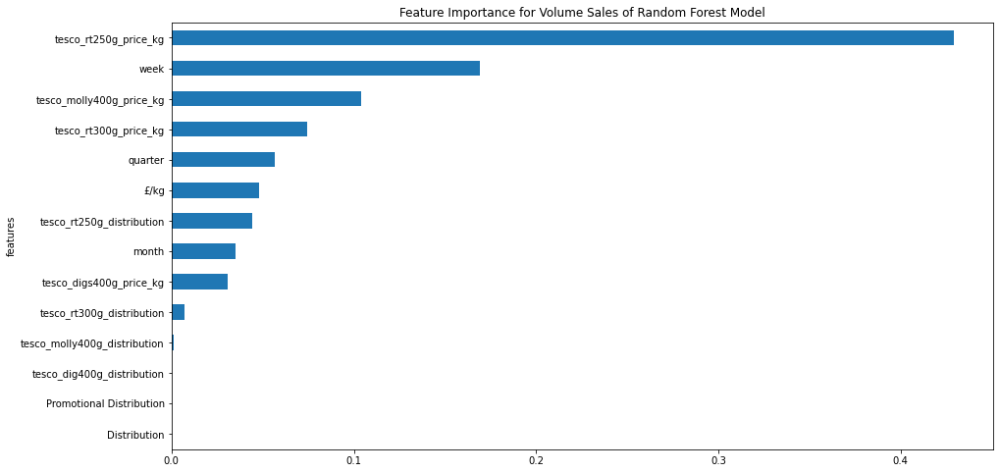

<Figure size 432x288 with 0 Axes>

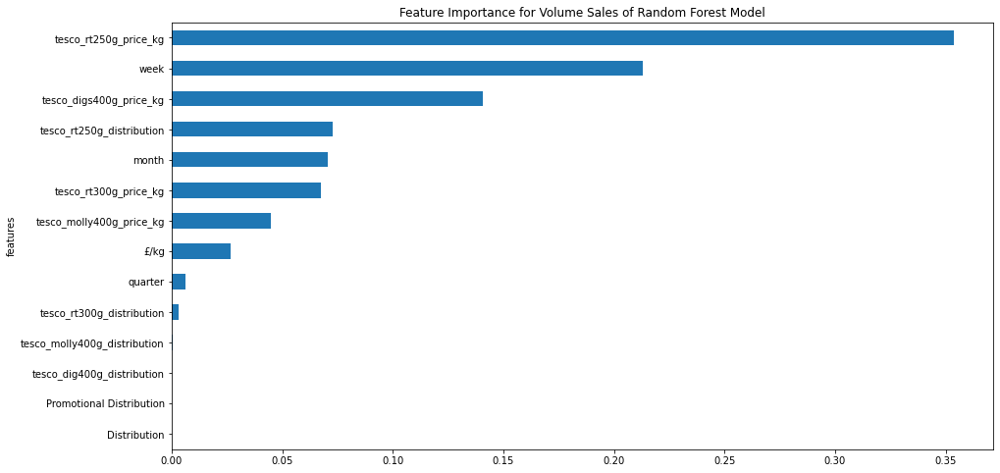

<Figure size 432x288 with 0 Axes>

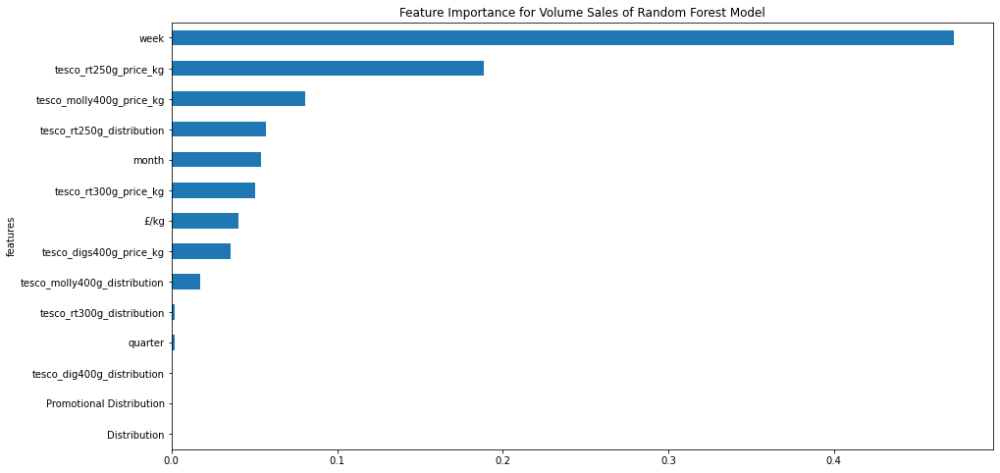

<Figure size 432x288 with 0 Axes>

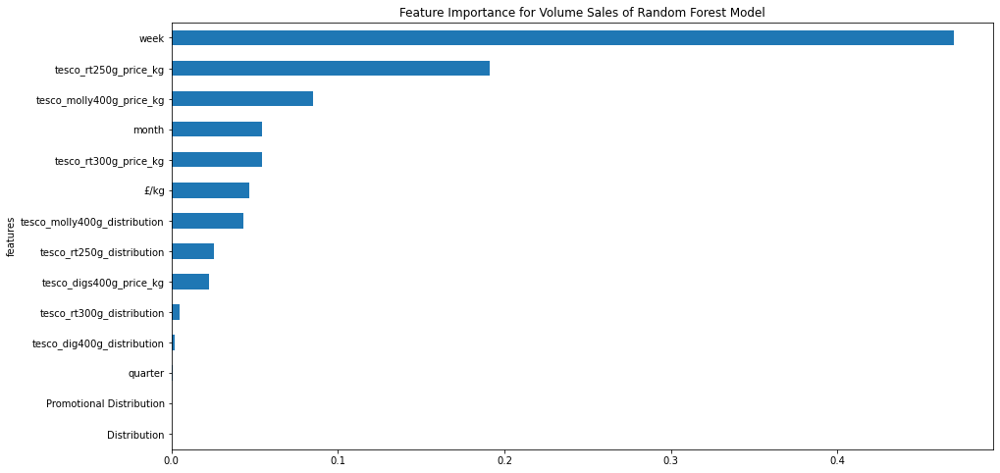

<Figure size 432x288 with 0 Axes>

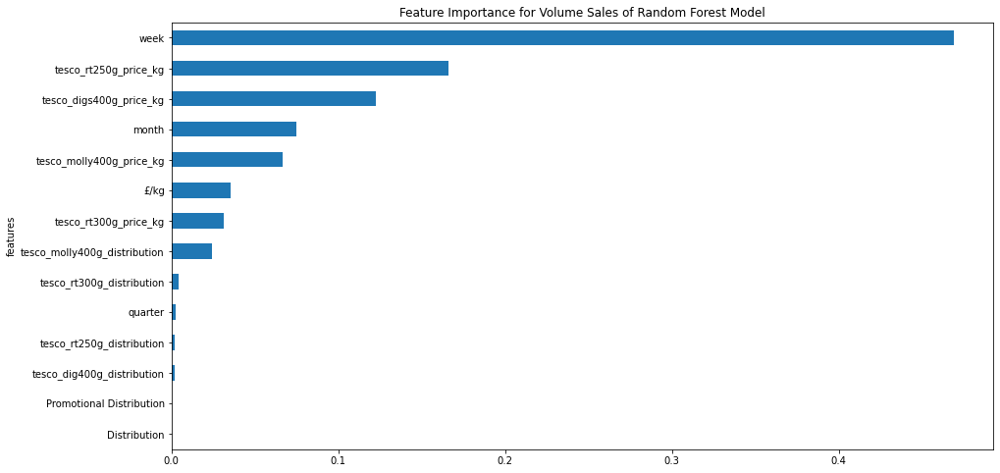

<Figure size 432x288 with 0 Axes>

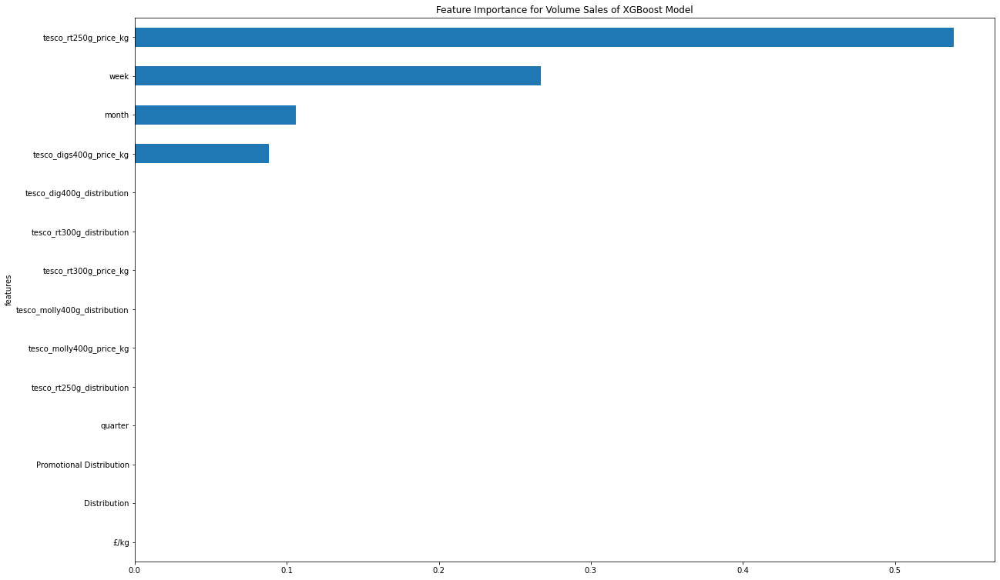

<Figure size 432x288 with 0 Axes>

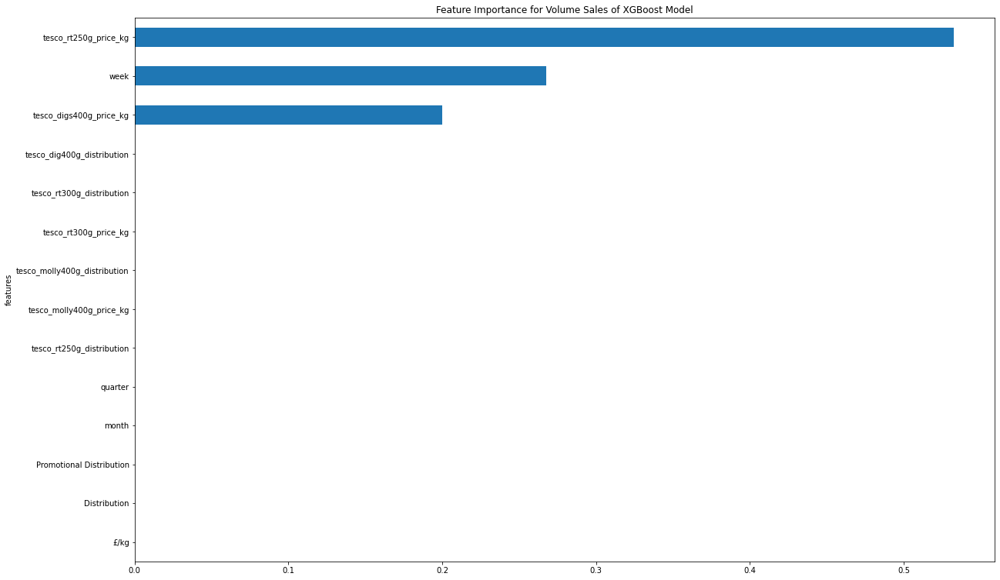

<Figure size 432x288 with 0 Axes>

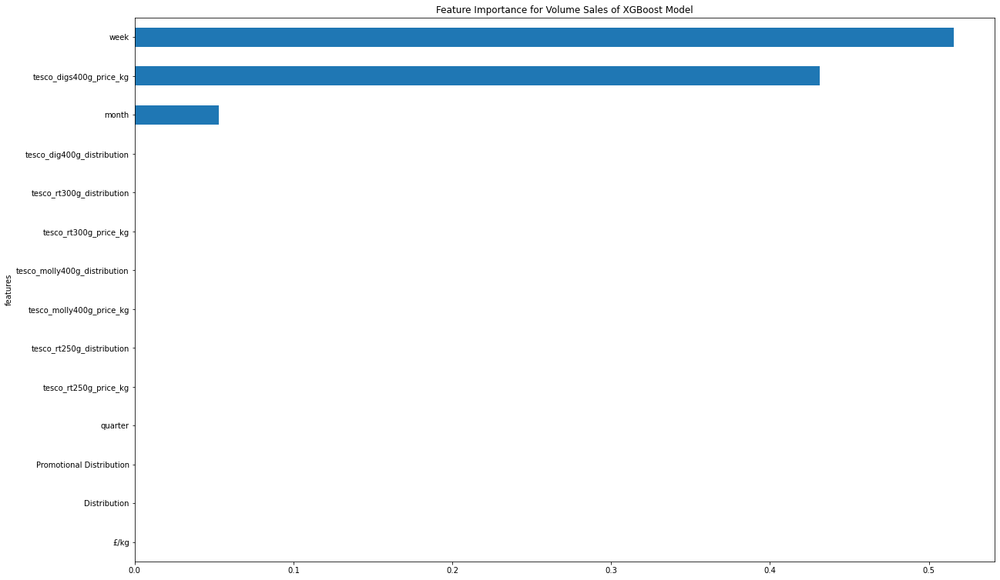

<Figure size 432x288 with 0 Axes>

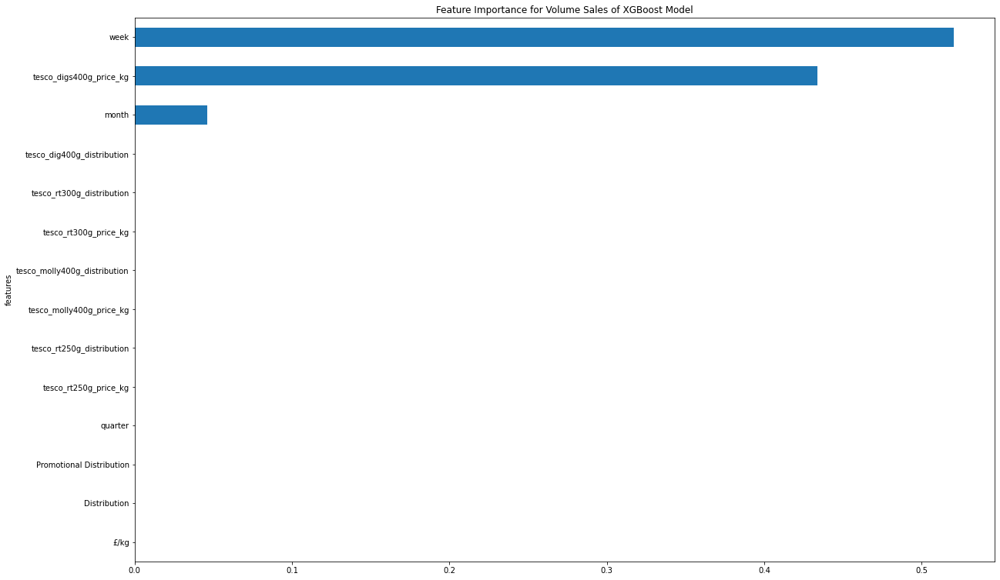

<Figure size 432x288 with 0 Axes>

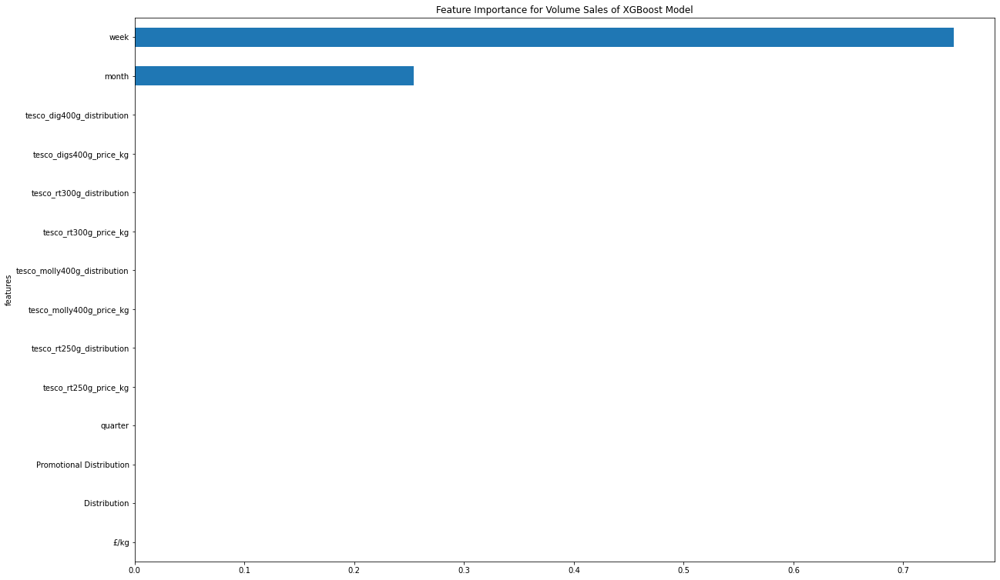

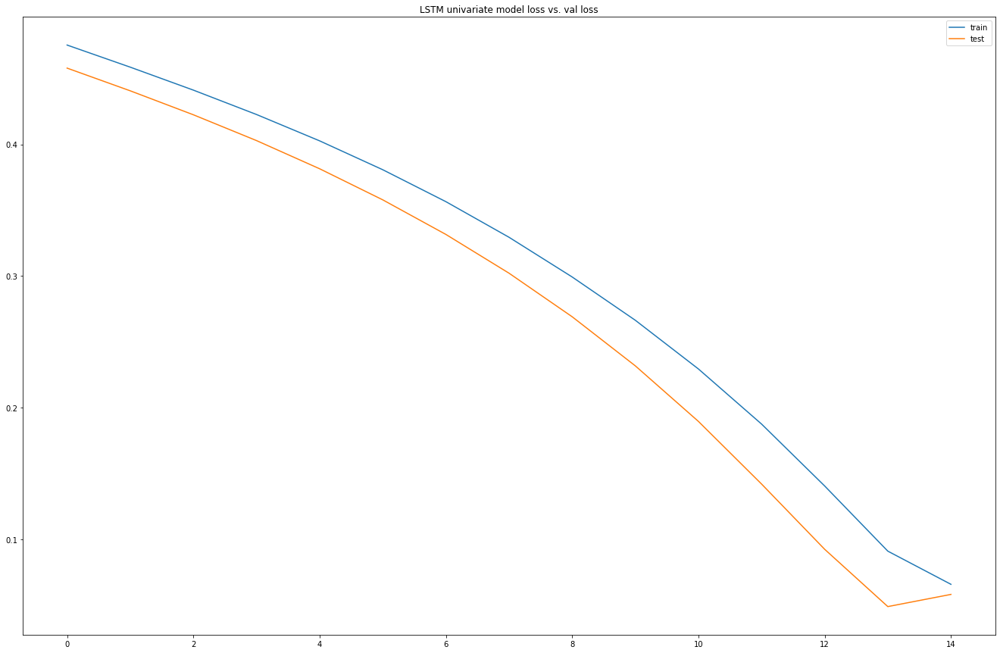

Test RMSE: 4768.072


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t)
Date,,,,,,,,,,,,,,
2014-12-20,40945.0,1.889672,96.0,0.0,12.0,4.0,50.0,43265.0,1.889613,96,0,12,4,51
2014-12-27,43265.0,1.889613,96.0,0.0,12.0,4.0,51.0,34195.0,1.889703,96,0,12,4,52
2015-01-03,34195.0,1.889703,96.0,0.0,12.0,4.0,52.0,26667.0,1.889601,96,0,1,1,1
2015-01-10,26667.0,1.889601,96.0,0.0,1.0,1.0,1.0,31957.0,1.889689,96,0,1,1,2
2015-01-17,31957.0,1.889689,96.0,0.0,1.0,1.0,2.0,34705.0,1.889442,96,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,38378.4,2.487324,98.0,0.0,2.0,1.0,6.0,39277.6,2.487499,98,0,2,1,7
2020-02-22,39277.6,2.487499,98.0,0.0,2.0,1.0,7.0,38577.6,2.487350,98,0,2,1,8
2020-02-29,38577.6,2.487350,98.0,0.0,2.0,1.0,8.0,41269.6,2.487354,98,0,2,1,9


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.605222   0.298082   0.973333        0.0        1.0        1.0   
2   0.645552   0.298052   0.973333        0.0        1.0        1.0   
3   0.487884   0.298098   0.973333        0.0        1.0        1.0   
4   0.357021   0.298046   0.973333        0.0        0.0        0.0   
5   0.448980   0.298091   0.973333        0.0        0.0        0.0   

   var7(t-1)   var1(t)  
1   0.942308  0.645552  
2   0.961538  0.487884  
3   0.980769  0.357021  
4   0.000000  0.448980  
5   0.019231  0.496749  
(219, 1, 7) (219,) (55, 1, 7) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 3s - loss: 0.4880 - val_loss: 0.4589
Epoch 2/50
219/219 - 0s - loss: 0.4561 - val_loss: 0.4256
Epoch 3/50
219/219 - 0s - loss: 0.4235 - val_loss: 0.3900
Epoch 4/50
219/219 - 0s - loss: 0.3885 - val_loss: 0.3504
Epoch 5/50
219/219 - 0s - loss: 0.3490 - val_loss: 0.3044
Epoch 6/50
219/219 - 0s - loss: 0.3040 - val_loss: 0

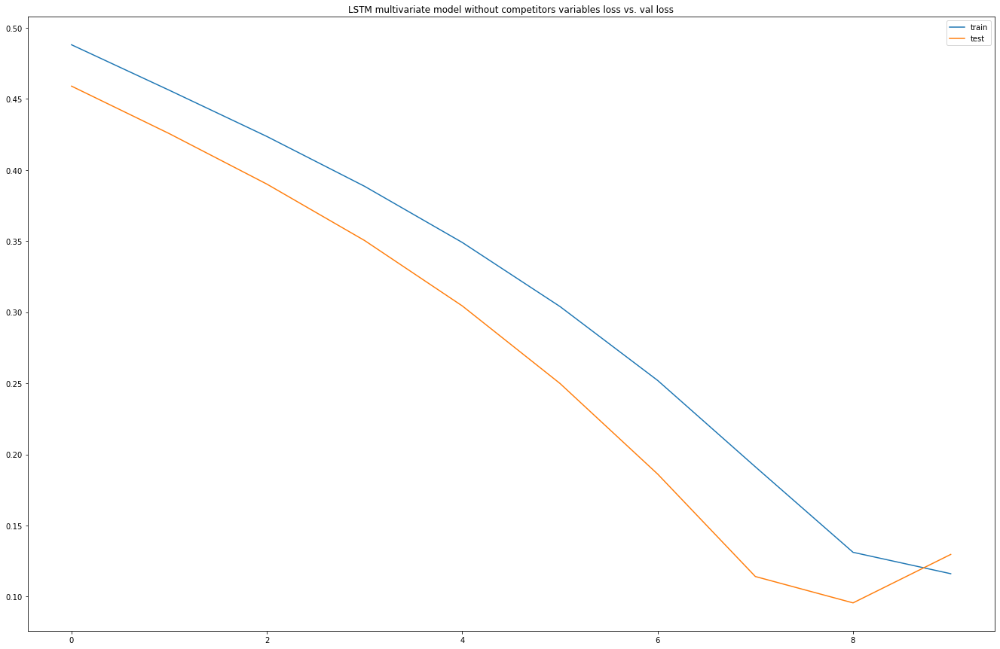

Test RMSE: 8993.285


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var6(t),var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-20,29722.4,2.361640,98.0,0.0,10.0,4.0,41.0,2.241567,100.0,0.775123,...,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,30899.2,2.362333,98.0,0.0,10.0,4.0,42.0,2.241541,100.0,0.775011,...,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,32409.6,2.362053,98.0,0.0,10.0,4.0,43.0,2.241566,100.0,0.774954,...,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,31647.2,2.362421,98.0,0.0,11.0,4.0,44.0,2.241457,100.0,0.775021,...,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,31065.6,2.361049,98.0,0.0,11.0,4.0,45.0,2.241417,100.0,0.774982,...,4,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,38378.4,2.487324,98.0,0.0,2.0,1.0,6.0,2.241456,100.0,0.774977,...,1,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,39277.6,2.487499,98.0,0.0,2.0,1.0,7.0,2.241447,100.0,0.774976,...,1,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,38577.6,2.487350,98.0,0.0,2.0,1.0,8.0,2.241482,100.0,0.774958,...,1,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.252613   0.008791        0.0        0.0   0.818182        1.0   
2   0.279258   0.014252        0.0        0.0   0.818182        1.0   
3   0.313457   0.012047        0.0        0.0   0.818182        1.0   
4   0.296194   0.014942        0.0        0.0   0.909091        1.0   
5   0.283026   0.004137        0.0        0.0   0.909091        1.0   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1   0.784314   0.994400        1.0    0.980005    0.136842    0.982941   
2   0.803922   0.993778        1.0    0.979163    0.589474    0.982361   
3   0.823529   0.994396        1.0    0.978738    0.589474    0.995712   
4   0.843137   0.991779        1.0    0.979244    0.589474    0.993225   
5   0.862745   0.990829        1.0    0.978948    0.600000    0.986877   

   var13(t-1)  var14(t-1)  var15(t-1)   var1(t)  
1         0.5    0.760128         1.0  0.279258  
2         0.5    0.759899   

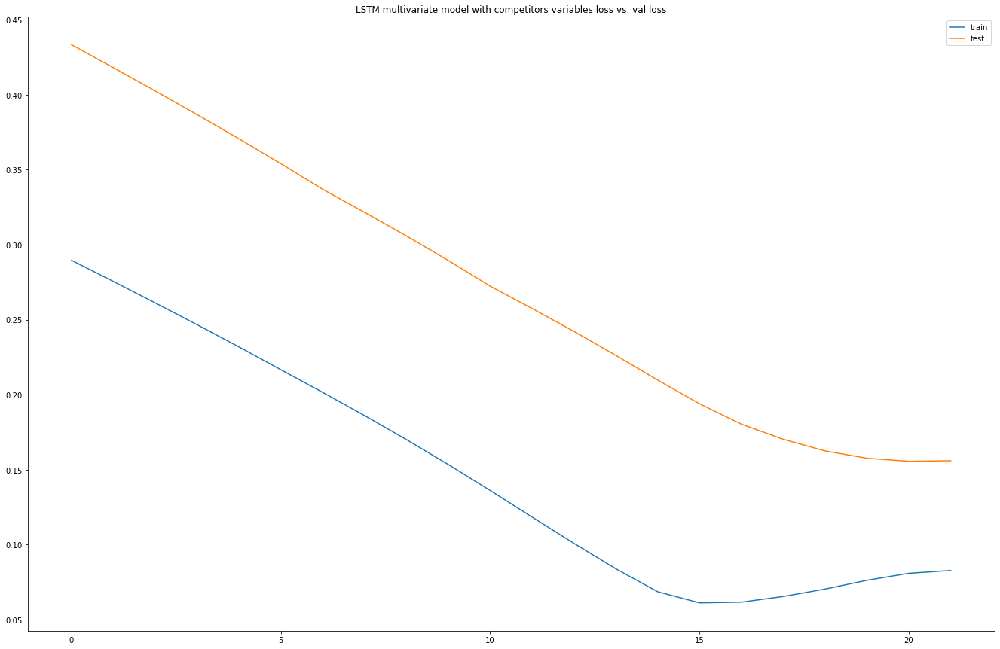

Test RMSE: 9842.500


In [91]:
#ml models
mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y=input_var(mcv_dig_400g_twin_with_comp)
rf_regressor_mcv(mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y)

mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y=input_var(mcv_dig_400g_twin_with_comp)
xgb_regressor_mcv(mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y)

#lstm models
series_to_supervised(mcv_dig_400g_twin_volume)
lstm_univariate(mcv_dig_400g_twin_volume)

series_to_supervised(mcv_dig_400g_twin_own_variable)
multivariate_lstm_without_competitor(mcv_dig_400g_twin_own_variable)

series_to_supervised(mcv_dig_400g_twin_with_comp)
multivariate_with_competitor(mcv_dig_400g_twin_with_comp)

### Tesco Large - McVitie's Digestives Rich Tea 300g

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
0,2014-12-13,57531,17259.3,58416.3,100,0,1.015388,3.384627,4,12,50
1,2014-12-20,56103,16830.9,57004.8,100,0,1.016074,3.386913,4,12,51
2,2014-12-27,38403,11520.9,39167.2,100,0,1.019899,3.399665,4,12,52
3,2015-01-03,38308,11492.4,39034.1,100,0,1.018954,3.396514,1,1,1
4,2015-01-10,50283,15084.9,51242.8,100,0,1.019088,3.396960,1,1,2


(275, 11)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000
mean,53297.174545,16001.358545,53642.773091,98.647273,0.0,1.007279,3.355066,2.469091,6.414545,26.043636
std,7029.099821,2111.164423,6974.649766,2.031491,0.0,0.032892,0.109373,1.140635,3.547767,15.490223
min,22252.000000,6675.600000,22264.700000,94.000000,0.0,0.940687,3.135623,1.000000,1.000000,1.000000
25%,48920.500000,14689.500000,49196.050000,98.000000,0.0,1.000430,3.328587,1.000000,3.000000,12.000000
50%,54834.000000,16462.200000,54877.300000,100.000000,0.0,1.000639,3.333905,2.000000,6.000000,26.000000
75%,57466.500000,17249.700000,58015.300000,100.000000,0.0,1.000832,3.335557,3.500000,9.500000,39.500000
95%,63412.900000,19023.870000,63635.850000,100.000000,0.0,1.036534,3.455112,4.000000,12.000000,50.000000
99%,65649.020000,19694.706000,65800.988000,100.000000,0.0,1.191097,3.963430,4.000000,12.000000,52.000000
max,67015.000000,20130.900000,70512.700000,100.000000,0.0,1.191153,3.967342,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg       

<Figure size 432x288 with 0 Axes>

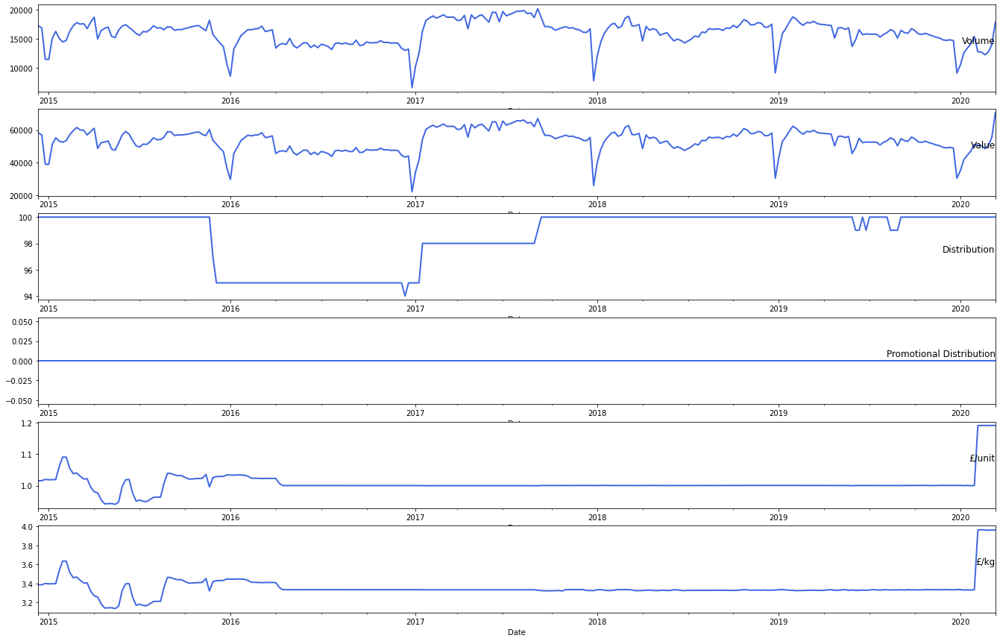

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8eff6dba8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8efe89208>)

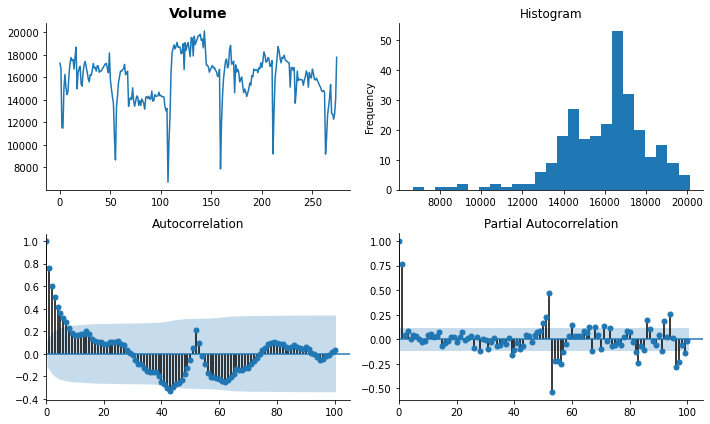

In [92]:
basic_info(mcv_rt_300g_origin)
plot_data(mcv_rt_300g_origin)
tsplot(mcv_rt_300g_origin['Volume'].dropna(), title=mcv_rt_300g_origin.columns[2], lags=100)


Test Statistic                -5.996790e+00
p-value                        1.694113e-07
#Lags Used                     0.000000e+00
Number of Observations Used    2.740000e+02
Critical Value (1%)           -3.454444e+00
Critical Value (5%)           -2.872147e+00
Critical Value (10%)          -2.572422e+00
dtype: float64


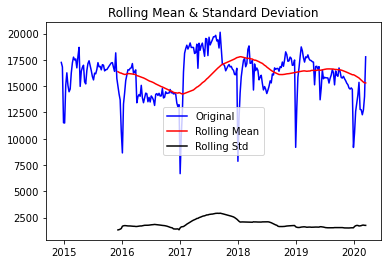

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning:

invalid value encountered in sqrt



(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8efd3c198>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8efc6a2e8>)

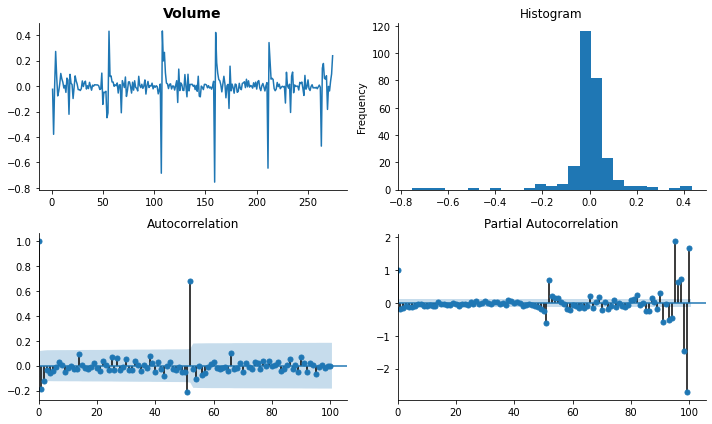

In [93]:
plot(mcv_rt_300g_origin)
series_transformed=mcv_rt_300g_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_rt_300g_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_rt_300g_origin.columns[2], lags=100)


       t-1      t+1
0      NaN  17259.3
1  17259.3  16830.9
2  16830.9  11520.9
3  11520.9  11492.4
4  11492.4  15084.9
Test MSE: 1655675.655
Test RMSE: 1286.731


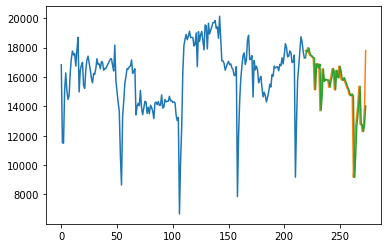

Observations: 275
Training Observations: 220
Testing Observations: 55


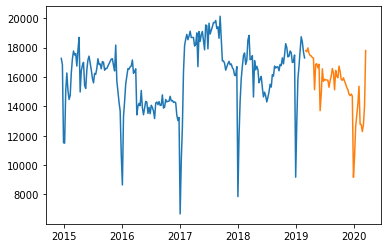

RMSE for Simple Exponential Smoothing α= 0.1 is: 2244.14
RMSE for Simple Exponential Smoothing α= 0.2 is: 2448.54
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 2643.61
RMSE for Simple Exponential Smoothing α= 0.4 is: 2758.31
RMSE for Simple Exponential Smoothing α= 0.5 is: 2783.73
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 2753.26
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 2700.79
RMSE for Simple Exponential Smoothing α= 0.8 is: 2647.14
RMSE for Simple Exponential Smoothing α= 0.9 is: 2601.53


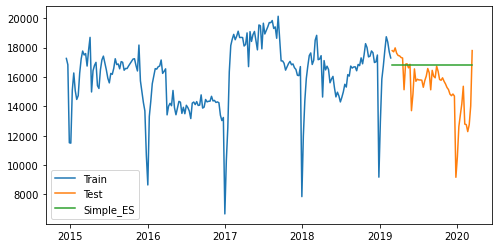

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 2149.58
Observations: 275
Training Observations: 220
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.1 and β= 0.30000000000000004 is: 1472.81


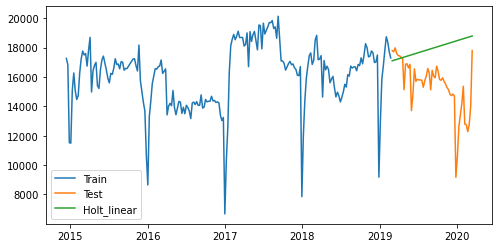

Observations: 275
Training Observations: 208
Testing Observations: 55


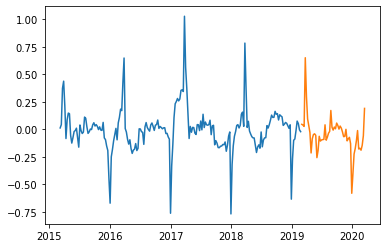

             Volume    pred_value
Date                             
2019-03-02  17789.1  16965.309881
2019-03-09  17710.5  16796.810835
2019-03-16  17978.1  16956.178878
2019-03-23  17613.3  16520.116999
2019-03-30  17459.1  16284.799942
2019-04-06  17432.1  16169.570064
2019-04-13  17323.5  15979.846126
2019-04-20  17287.8  15858.600947
2019-04-27  15129.0  13801.413029
2019-05-04  16863.9  15298.876441
2019-05-11  16895.1  15242.298915
2019-05-18  16617.9  14909.189597
2019-05-25  16860.9  15043.428900
2019-06-01  13703.7  12158.839239
2019-06-08  14822.4  13078.591997
2019-06-15  16547.7  14520.055960
2019-06-22  15704.4  13703.774026
2019-06-29  15844.8  13749.717982
2019-07-06  15794.7  13630.337171
2019-07-13  15794.4  13554.594784
2019-07-20  15776.7  13464.423476
2019-07-27  15295.8  12981.712302
2019-08-03  15747.0  13290.637107
2019-08-10  16058.4  13478.402856
2019-08-17  16572.6  13832.956087
2019-08-24  16279.8  13513.305775
2019-08-31  15124.2  12484.557079
2019-09-07  16

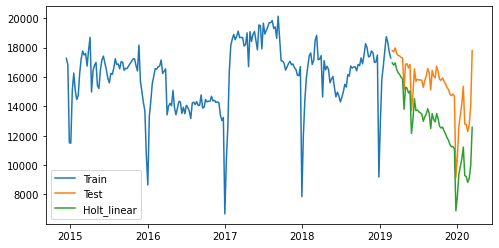

RMSE for Holt Linear Forecasting with transformation is: 2803.4762227736496


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

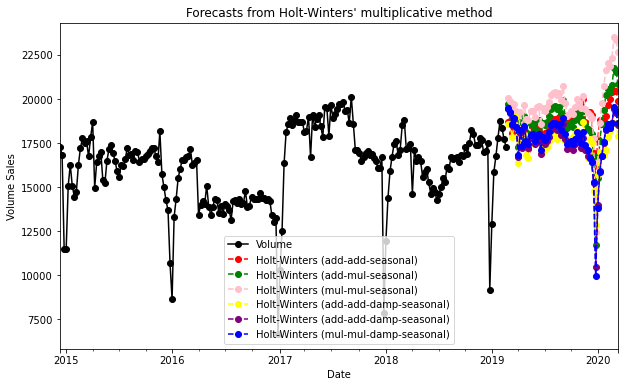

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
3782.271455666888
3865.2761169766236
4756.533717796079
2638.880994214825
2606.738150022409
2723.5256070420032


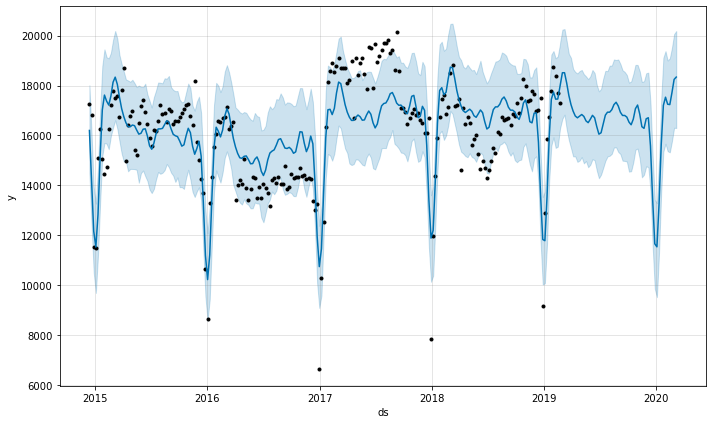

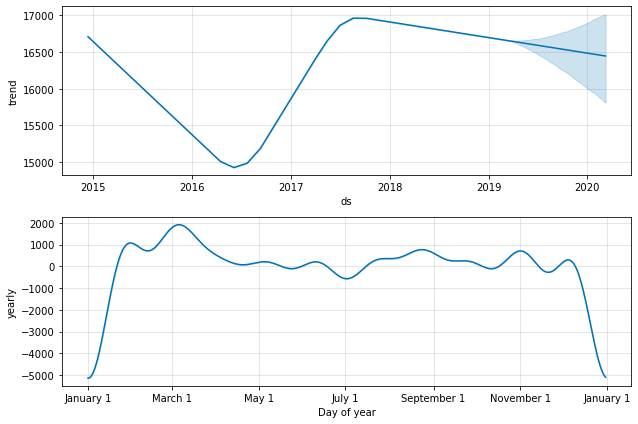

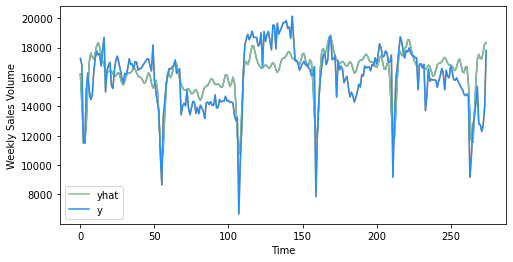

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 1482.0211478032347


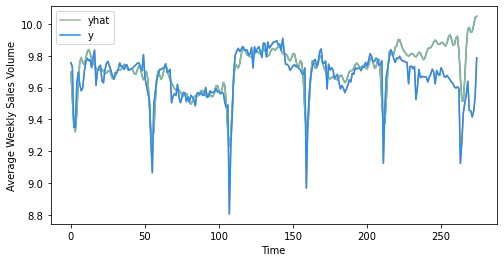

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 2092.9169734364827
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern I

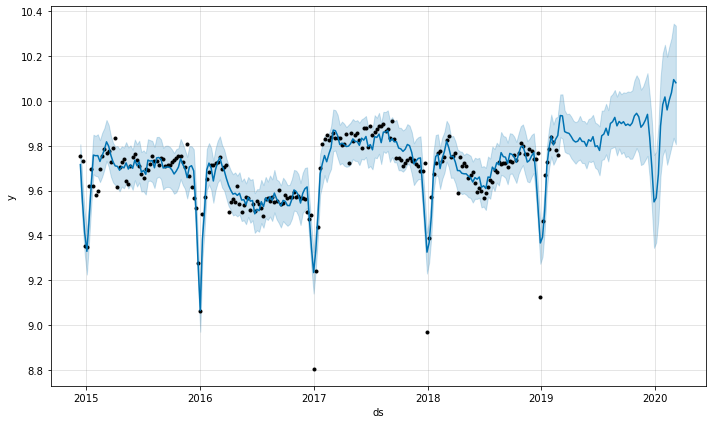

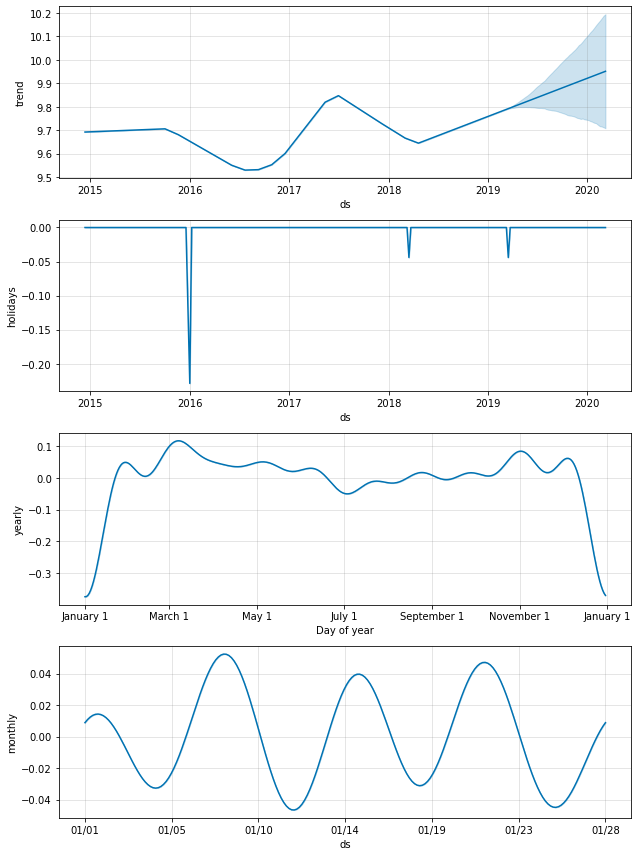

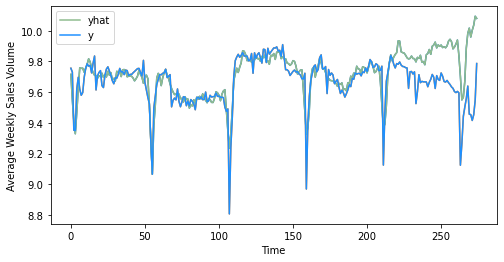

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 2248.0153554250087


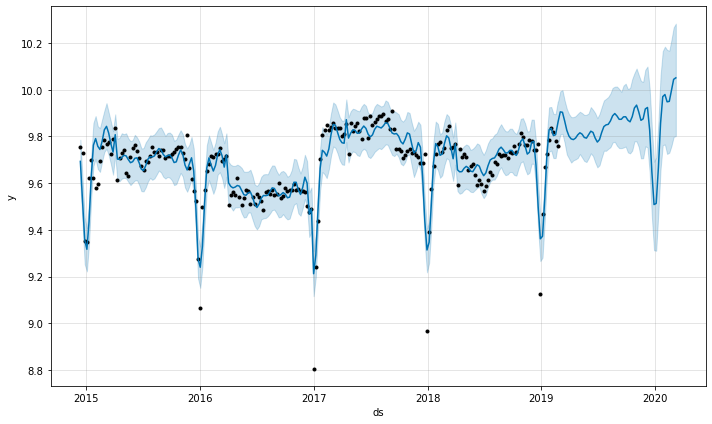

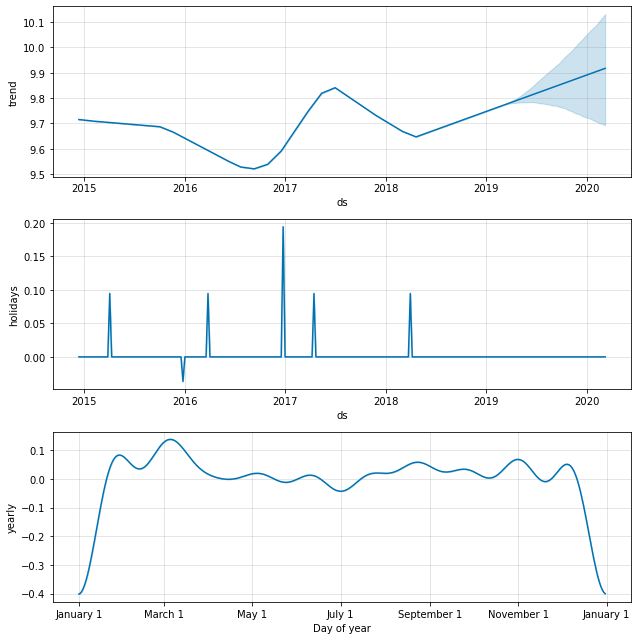

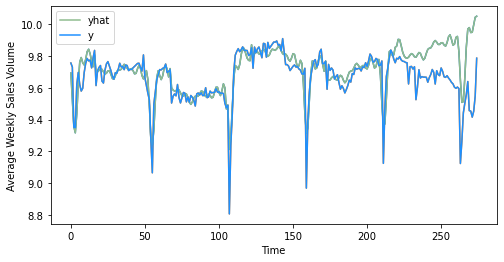

2084.076333134686


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [136]:
#time series models
baseline_model(mcv_rt_300g_origin)
ses_model(mcv_rt_300g_origin)
holt_linear_model(mcv_rt_300g_origin)
holt_linear_model_log(mcv_rt_300g_origin)
holt_winter_model(mcv_rt_300g_origin)
prophet_model(mcv_rt_300g_origin)
prophet_model_log(mcv_rt_300g_origin)
prophet_log_season(mcv_rt_300g_origin)
prophet_log_two_holiday(mcv_rt_300g_origin)


Observations: 27
Training Observations: 15
Testing Observations: 12
[ -0.17295394  -1.65943125  -1.56766486 -12.15418919  -2.81075744]
Mean Absolute Error: 1322.2274999999959
Mean Squared Error: 1972881.350962489
Root Mean Squared Error: 1404.5929484952176
Observations: 39
Training Observations: 27
Testing Observations: 12
[ -1.50572084  -1.76969749 -16.04716948  -4.74921027  -8.64725152]
Mean Absolute Error: 1839.3524999999997
Mean Squared Error: 4826439.787949999
Root Mean Squared Error: 2196.9159719820873
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.8624715  -10.24618344  -0.30226079  -8.31614795  -1.27507035]
Mean Absolute Error: 476.59874999999965
Mean Squared Error: 328129.3646437499
Root Mean Squared Error: 572.8257716302138
Observations: 63
Training Observations: 51
Testing Observations: 12
[ -0.32857856  -5.95034841  -3.16590671 -10.1552447   -0.41411412]
Mean Absolute Error: 555.5600000000023
Mean Squared Error: 455129.5407000031
Root Mean Squared 

,var1(t-1),var1(t)
Date,,
2014-12-20,17259.3,16830.9
2014-12-27,16830.9,11520.9
2015-01-03,11520.9,11492.4
2015-01-10,11492.4,15084.9
2015-01-17,15084.9,16269.3
...,...,...
2020-02-15,12789.0,12756.6
2020-02-22,12756.6,12278.4
2020-02-29,12278.4,12749.4


   var1(t-1)   var1(t)
1   0.786582  0.754743
2   0.754743  0.360103
3   0.360103  0.357985
4   0.357985  0.624980
5   0.624980  0.713005
(219, 1, 1) (219,) (55, 1, 1) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 4s - loss: 0.7108 - val_loss: 0.6455
Epoch 2/50
219/219 - 0s - loss: 0.6925 - val_loss: 0.6277
Epoch 3/50
219/219 - 0s - loss: 0.6744 - val_loss: 0.6098
Epoch 4/50
219/219 - 0s - loss: 0.6560 - val_loss: 0.5914
Epoch 5/50
219/219 - 0s - loss: 0.6370 - val_loss: 0.5720
Epoch 6/50
219/219 - 0s - loss: 0.6170 - val_loss: 0.5511
Epoch 7/50
219/219 - 0s - loss: 0.5954 - val_loss: 0.5282
Epoch 8/50
219/219 - 0s - loss: 0.5717 - val_loss: 0.5029
Epoch 9/50
219/219 - 0s - loss: 0.5453 - val_loss: 0.4744
Epoch 10/50
219/219 - 0s - loss: 0.5157 - val_loss: 0.4429
Epoch 11/50
219/219 - 0s - loss: 0.4826 - val_loss: 0.4076
Epoch 12/50
219/219 - 0s - loss: 0.4448 - val_loss: 0.3673
Epoch 13/50
219/219 - 0s - loss: 0.4014 - val_loss: 0.3210
Epoch 14/50
219/219 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

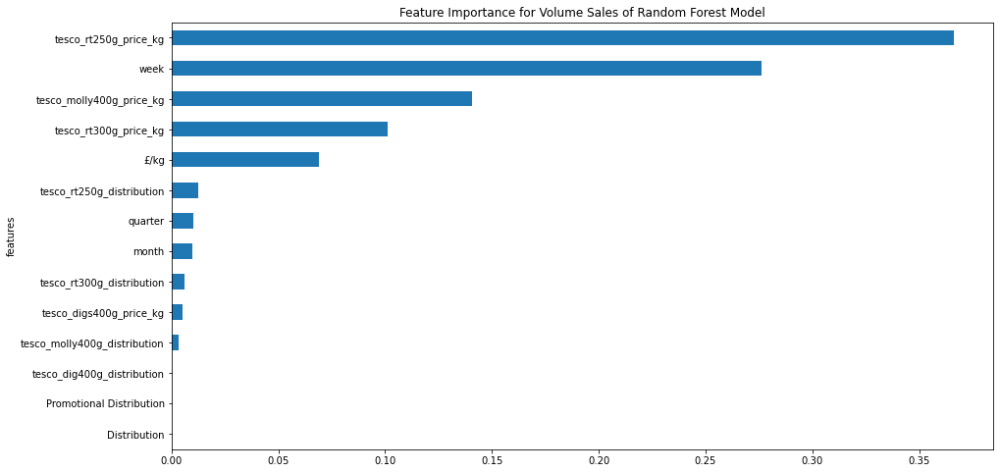

<Figure size 432x288 with 0 Axes>

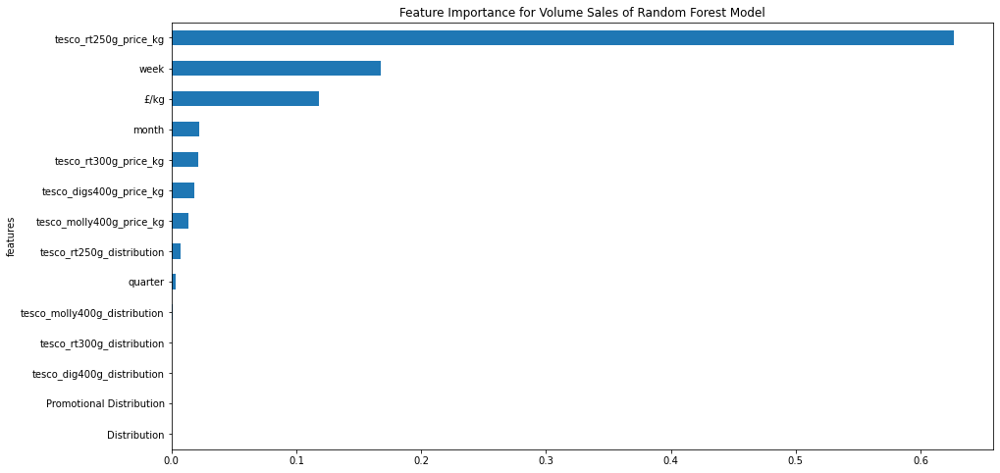

<Figure size 432x288 with 0 Axes>

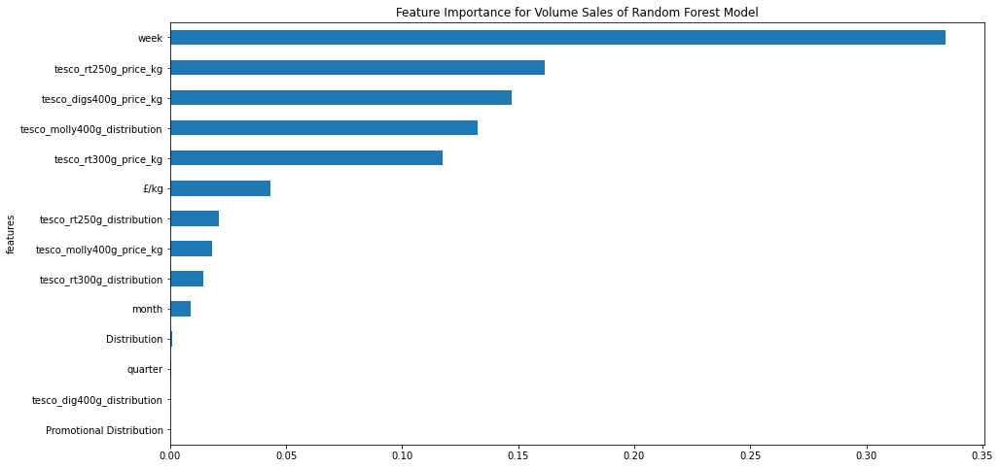

<Figure size 432x288 with 0 Axes>

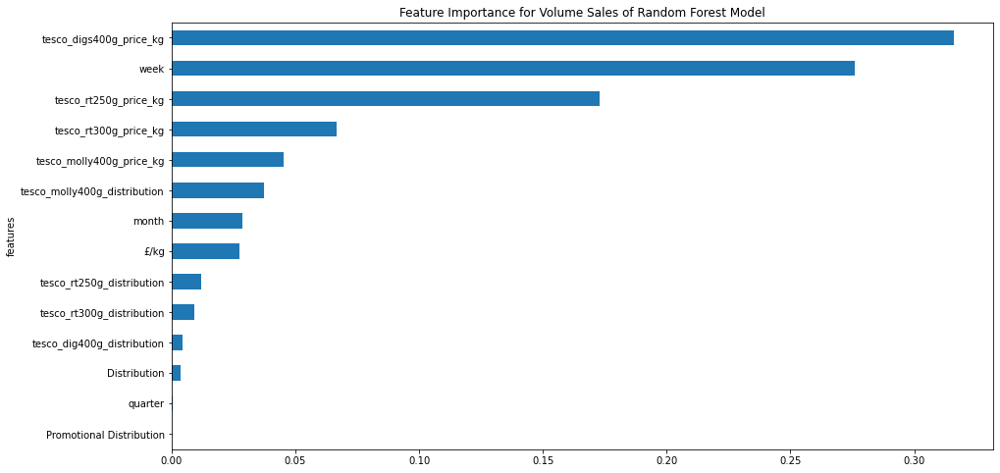

<Figure size 432x288 with 0 Axes>

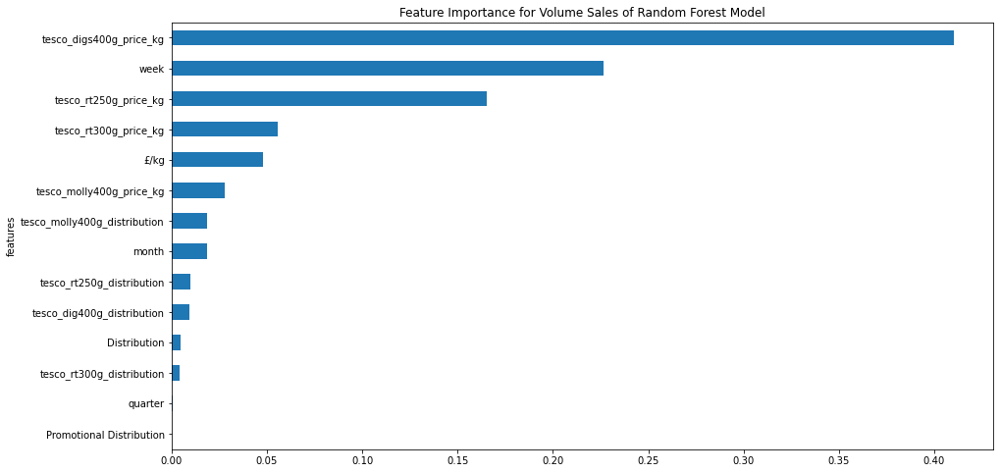

<Figure size 432x288 with 0 Axes>

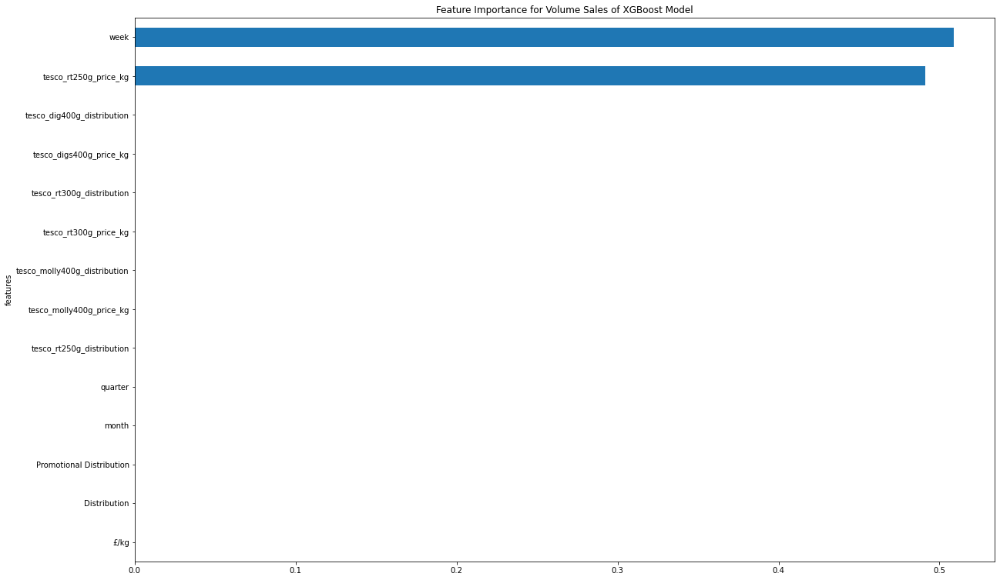

<Figure size 432x288 with 0 Axes>

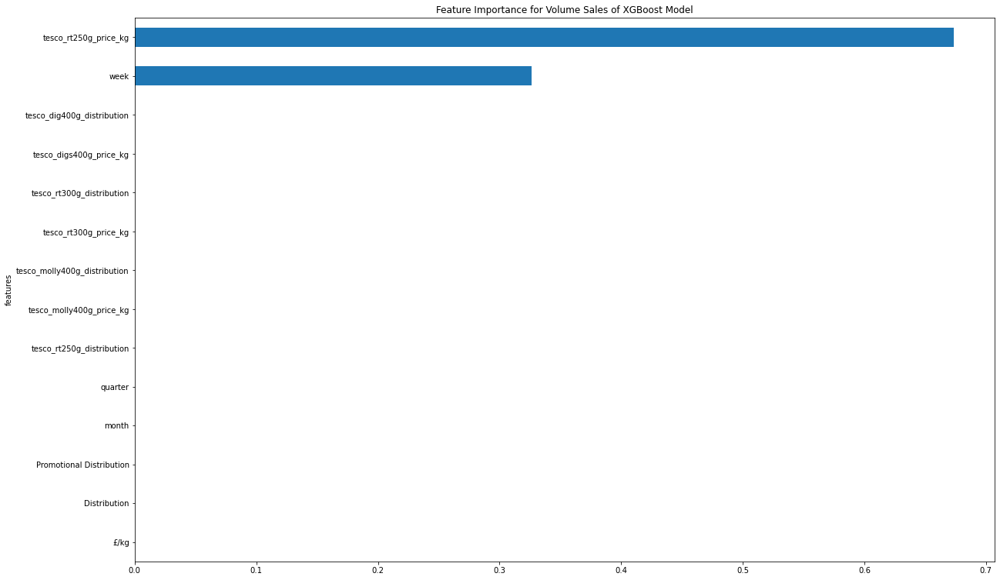

<Figure size 432x288 with 0 Axes>

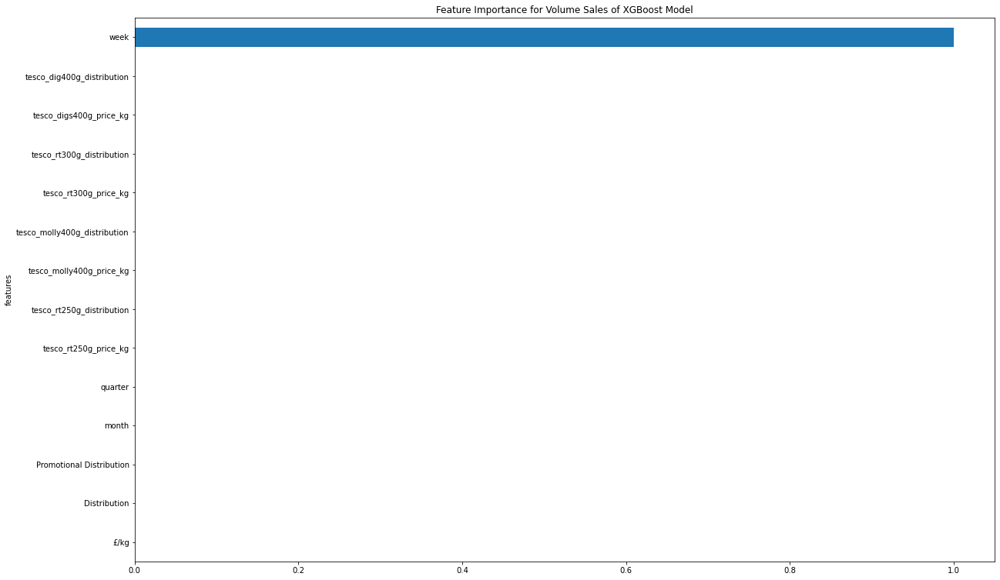

<Figure size 432x288 with 0 Axes>

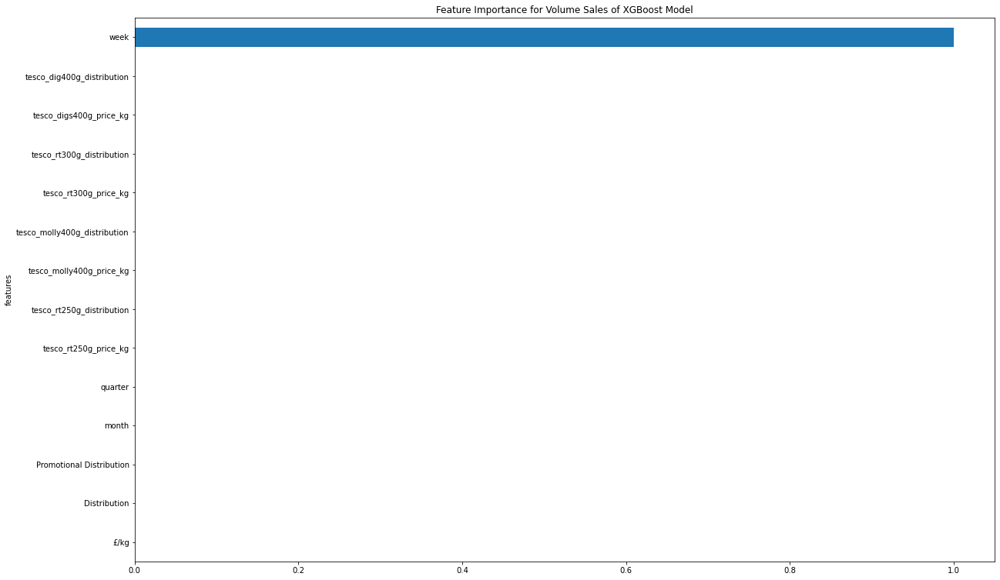

<Figure size 432x288 with 0 Axes>

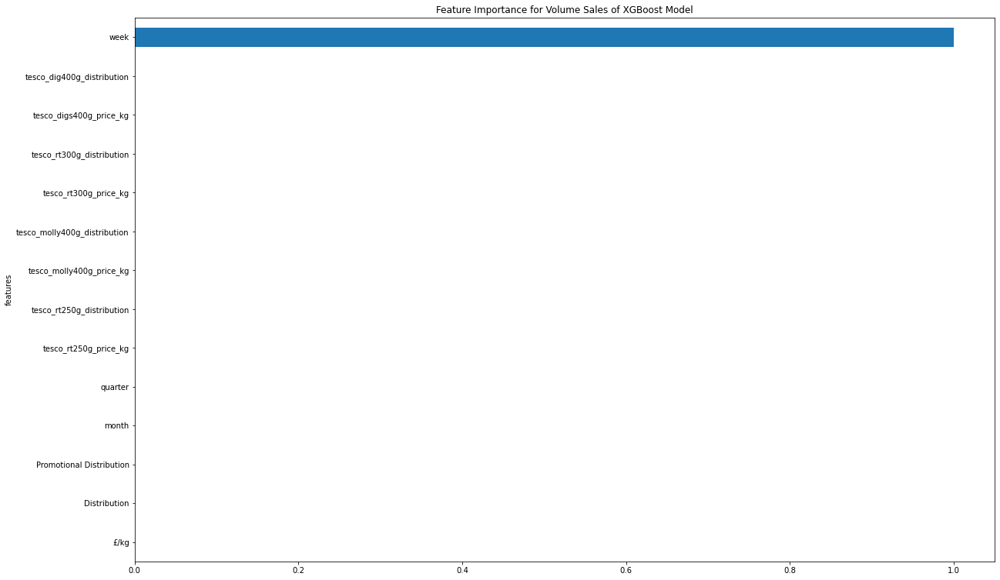

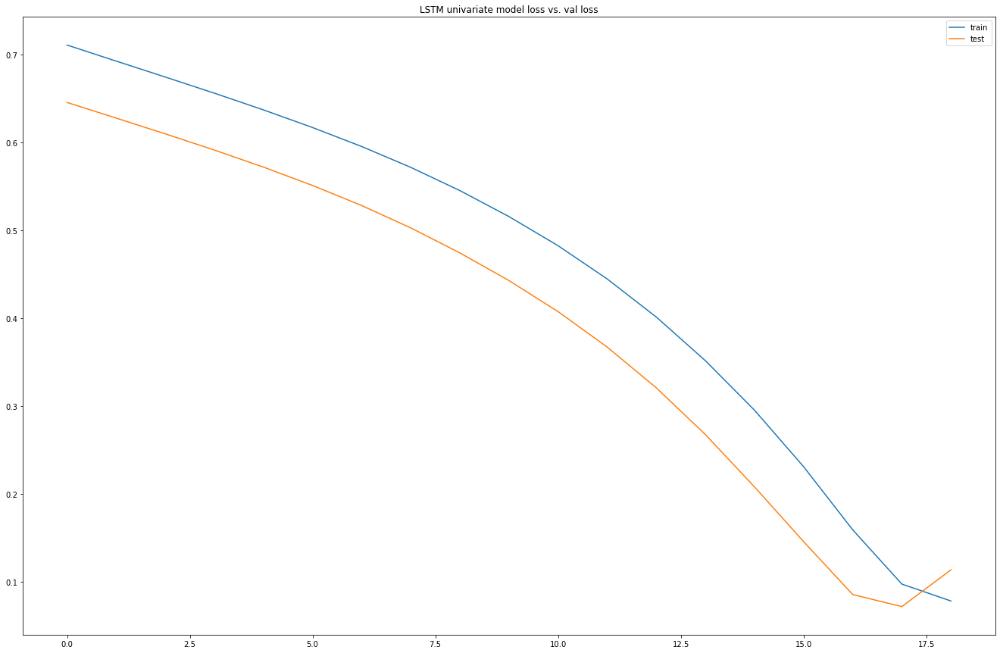

Test RMSE: 1949.069


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t)
Date,,,,,,,,,,,,,,
2014-12-20,17259.3,3.384627,100.0,0.0,12.0,4.0,50.0,16830.9,3.386913,100,0,12,4,51
2014-12-27,16830.9,3.386913,100.0,0.0,12.0,4.0,51.0,11520.9,3.399665,100,0,12,4,52
2015-01-03,11520.9,3.399665,100.0,0.0,12.0,4.0,52.0,11492.4,3.396514,100,0,1,1,1
2015-01-10,11492.4,3.396514,100.0,0.0,1.0,1.0,1.0,15084.9,3.396960,100,0,1,1,2
2015-01-17,15084.9,3.396960,100.0,0.0,1.0,1.0,2.0,16269.3,3.398573,100,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,12789.0,3.963390,100.0,0.0,2.0,1.0,6.0,12756.6,3.967342,100,0,2,1,7
2020-02-22,12756.6,3.967342,100.0,0.0,2.0,1.0,7.0,12278.4,3.963619,100,0,2,1,8
2020-02-29,12278.4,3.963619,100.0,0.0,2.0,1.0,8.0,12749.4,3.960884,100,0,2,1,9


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.786582   0.299385   1.000001        0.0        1.0        1.0   
2   0.754743   0.302134   1.000001        0.0        1.0        1.0   
3   0.360103   0.317465   1.000001        0.0        1.0        1.0   
4   0.357985   0.313677   1.000001        0.0        0.0        0.0   
5   0.624980   0.314213   1.000001        0.0        0.0        0.0   

   var7(t-1)   var1(t)  
1   0.942308  0.754743  
2   0.961538  0.360103  
3   0.980769  0.357985  
4   0.000000  0.624980  
5   0.019231  0.713005  
(219, 1, 7) (219,) (55, 1, 7) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 4s - loss: 0.6854 - val_loss: 0.6103
Epoch 2/50
219/219 - 0s - loss: 0.6561 - val_loss: 0.5781
Epoch 3/50
219/219 - 0s - loss: 0.6249 - val_loss: 0.5418
Epoch 4/50
219/219 - 0s - loss: 0.5897 - val_loss: 0.4994
Epoch 5/50
219/219 - 0s - loss: 0.5486 - val_loss: 0.4508
Epoch 6/50
219/219 - 0s - loss: 0.4999 - val_loss: 0

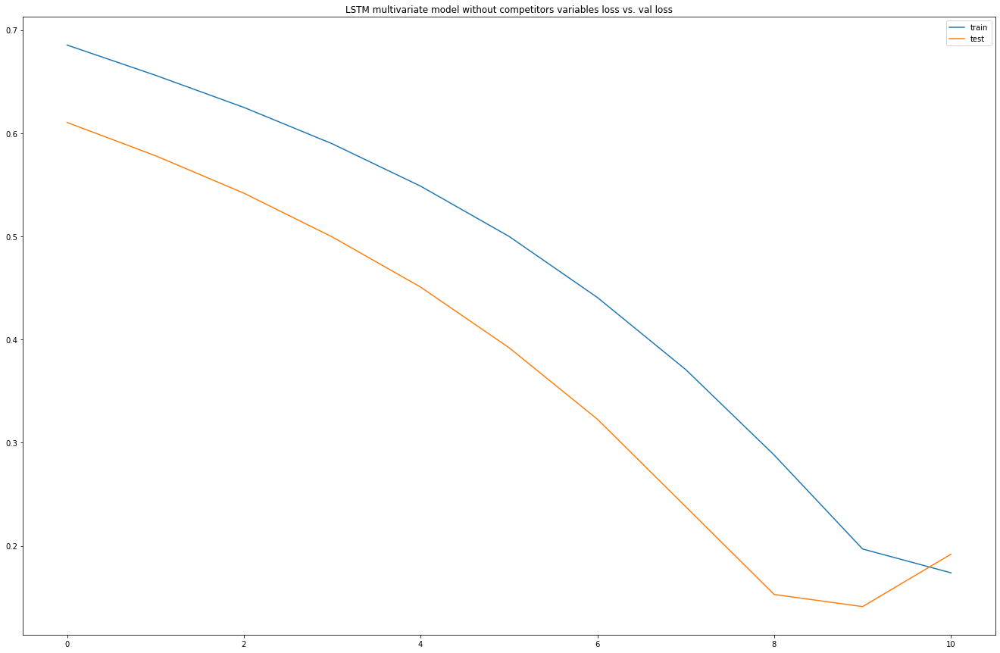

Test RMSE: 3288.049


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var6(t),var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-20,16893.0,3.328089,100.0,0.0,10.0,4.0,41.0,2.241567,100.0,0.775123,...,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,17493.9,3.330738,100.0,0.0,10.0,4.0,42.0,2.241541,100.0,0.775011,...,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,18264.9,3.335835,100.0,0.0,10.0,4.0,43.0,2.241566,100.0,0.774954,...,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,18000.0,3.332644,100.0,0.0,11.0,4.0,44.0,2.241457,100.0,0.775021,...,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,17365.2,3.329135,100.0,0.0,11.0,4.0,45.0,2.241417,100.0,0.774982,...,4,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,12789.0,3.963390,100.0,0.0,2.0,1.0,6.0,2.241456,100.0,0.774977,...,1,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,12756.6,3.967342,100.0,0.0,2.0,1.0,7.0,2.241447,100.0,0.774976,...,1,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,12278.4,3.963619,100.0,0.0,2.0,1.0,8.0,2.241482,100.0,0.774958,...,1,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.807426   0.004945        1.0        0.0   0.818182        1.0   
2   0.870237   0.009069        1.0        0.0   0.818182        1.0   
3   0.950829   0.017004        1.0        0.0   0.818182        1.0   
4   0.923140   0.012037        1.0        0.0   0.909091        1.0   
5   0.856784   0.006575        1.0        0.0   0.909091        1.0   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1   0.784314   0.994400        1.0    0.980005    0.136842    0.982941   
2   0.803922   0.993778        1.0    0.979163    0.589474    0.982361   
3   0.823529   0.994396        1.0    0.978738    0.589474    0.995712   
4   0.843137   0.991779        1.0    0.979244    0.589474    0.993225   
5   0.862745   0.990829        1.0    0.978948    0.600000    0.986877   

   var13(t-1)  var14(t-1)  var15(t-1)   var1(t)  
1         0.5    0.760128         1.0  0.870237  
2         0.5    0.759899   

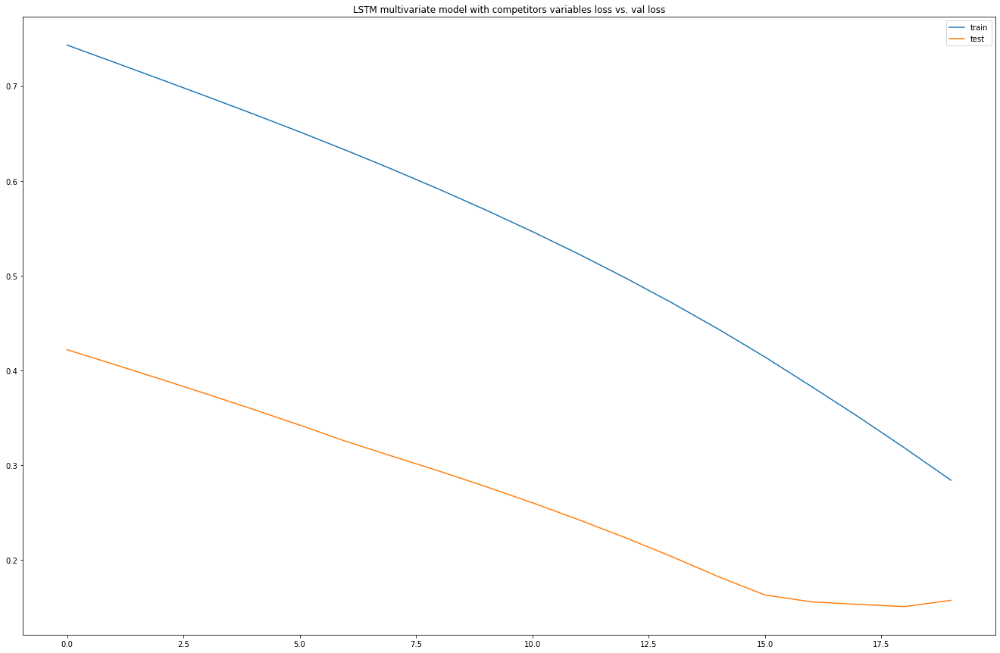

Test RMSE: 2208.898


In [95]:
#ml models
mcv_rt_300g_input_X,mcv_rt_300g_input_Y=input_var(mcv_rt_300g_with_comp)
rf_regressor_mcv(mcv_rt_300g_input_X,mcv_rt_300g_input_Y)

mcv_rt_300g_input_X,mcv_rt_300g_input_Y=input_var(mcv_rt_300g_with_comp)
xgb_regressor_mcv(mcv_rt_300g_input_X,mcv_rt_300g_input_Y)

#lstm models
series_to_supervised(mcv_rt_300g_volume)
lstm_univariate(mcv_rt_300g_volume)

series_to_supervised(mcv_rt_300g_own_variable)
multivariate_lstm_without_competitor(mcv_rt_300g_own_variable)

series_to_supervised(mcv_rt_300g_with_comp)
multivariate_with_competitor(mcv_rt_300g_with_comp)

### Tesco Large - McVitie's Digestives Rich Tea 300g Twin Pack

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
0,2014-12-13,29186,17512,55159,96,0,1.89,3.15,4,12,50
1,2014-12-20,29296,17578,55368,96,0,1.89,3.15,4,12,51
2,2014-12-27,19627,11776,37097,96,0,1.89,3.15,4,12,52
3,2015-01-03,20399,12239,38553,96,0,1.89,3.15,1,1,1
4,2015-01-10,26463,15878,50015,96,0,1.89,3.15,1,1,2


(275, 11)

Date                        datetime64[ns]
Units                                int64
Volume                               int64
Value                                int64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.00000,275.000000,275.000000,275.000000,275.000000
mean,30580.287273,18348.160000,57701.327273,93.810909,0.0,1.88720,3.145345,2.469091,6.414545,26.043636
std,5783.902741,3470.324743,11033.581557,11.254548,0.0,0.04098,0.068520,1.140635,3.547767,15.490223
min,16518.000000,9911.000000,31211.000000,62.000000,0.0,1.50000,2.500000,1.000000,1.000000,1.000000
25%,28326.000000,16995.500000,53532.500000,97.000000,0.0,1.89000,3.150000,1.000000,3.000000,12.000000
50%,31847.000000,19108.000000,60114.000000,98.000000,0.0,1.89000,3.150000,2.000000,6.000000,26.000000
75%,33942.000000,20365.500000,64057.500000,98.000000,0.0,1.89000,3.150000,3.500000,9.500000,39.500000
95%,37289.300000,22373.700000,69994.900000,99.000000,0.0,1.89000,3.150000,4.000000,12.000000,50.000000
99%,41694.480000,25016.340000,77315.800000,99.000000,0.0,1.99000,3.320000,4.000000,12.000000,52.000000
max,61037.000000,36622.000000,121479.000000,99.000000,0.0,1.99000,3.320000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg       

<Figure size 432x288 with 0 Axes>

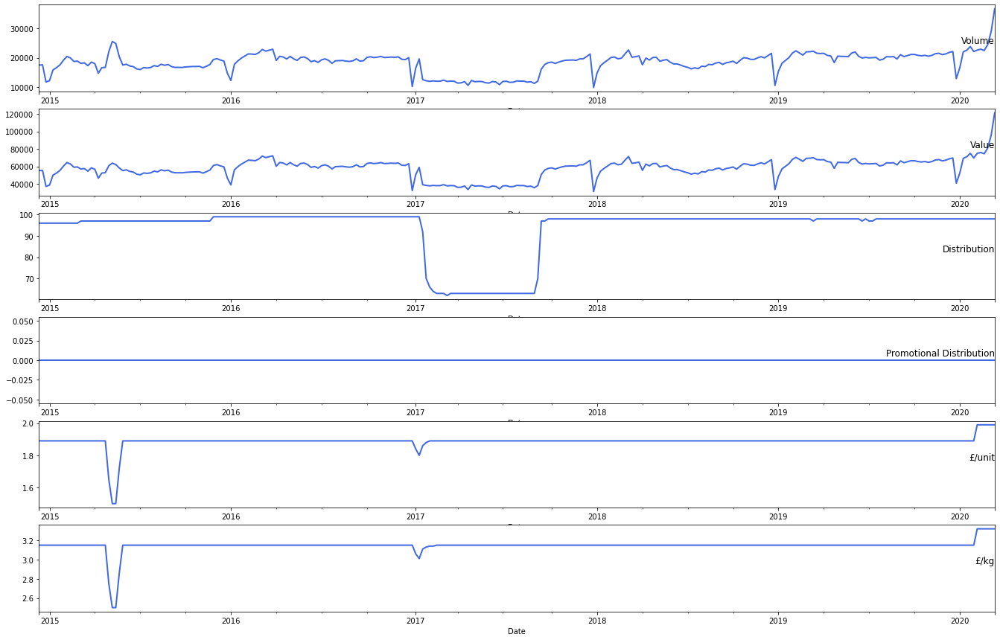

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8ef45fef0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8eee18a90>)

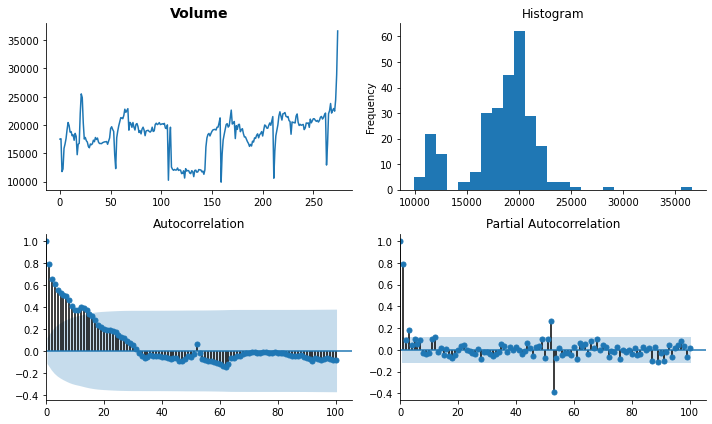

In [96]:
basic_info(mcv_rt_300g_twin_origin)
plot_data(mcv_rt_300g_twin_origin)
tsplot(mcv_rt_300g_twin_origin['Volume'].dropna(), title=mcv_rt_300g_twin_origin.columns[2], lags=100)


Test Statistic                  -2.115810
p-value                          0.238205
#Lags Used                       2.000000
Number of Observations Used    272.000000
Critical Value (1%)             -3.454622
Critical Value (5%)             -2.872225
Critical Value (10%)            -2.572464
dtype: float64


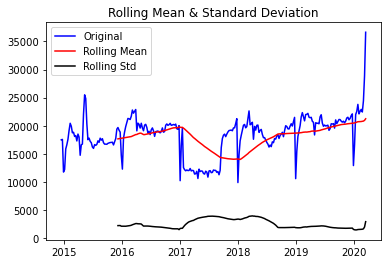

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning:

invalid value encountered in sqrt



(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8eb734f28>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8eb620ac8>)

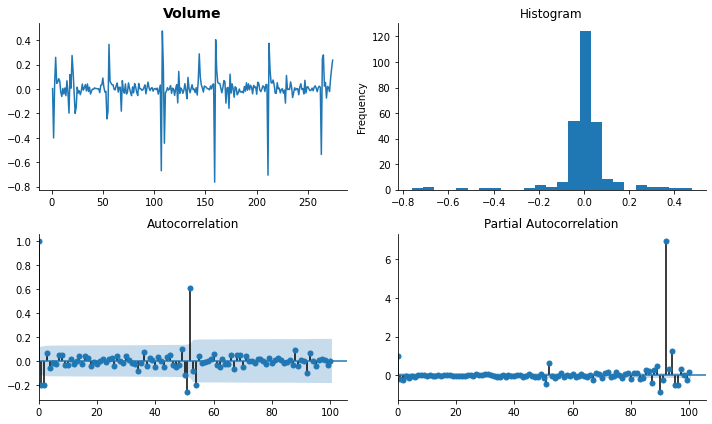

In [97]:

plot(mcv_rt_300g_twin_origin)
series_transformed=mcv_rt_300g_twin_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_rt_300g_twin_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_rt_300g_twin_origin.columns[2], lags=100)

       t-1    t+1
0      NaN  17512
1  17512.0  17578
2  17578.0  11776
3  11776.0  12239
4  12239.0  15878
Test MSE: 4334739.673
Test RMSE: 2082.004


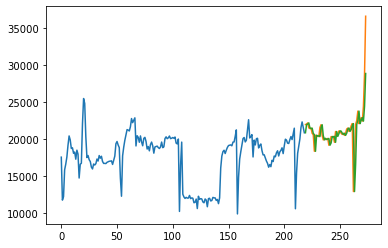

Observations: 275
Training Observations: 220
Testing Observations: 55


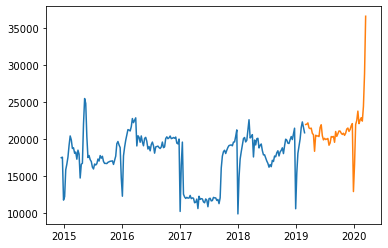

RMSE for Simple Exponential Smoothing α= 0.1 is: 3346.5
RMSE for Simple Exponential Smoothing α= 0.2 is: 3039.89
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 2909.15
RMSE for Simple Exponential Smoothing α= 0.4 is: 2868.6
RMSE for Simple Exponential Smoothing α= 0.5 is: 2860.72
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 2860.34
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 2862.85
RMSE for Simple Exponential Smoothing α= 0.8 is: 2868.64
RMSE for Simple Exponential Smoothing α= 0.9 is: 2877.49


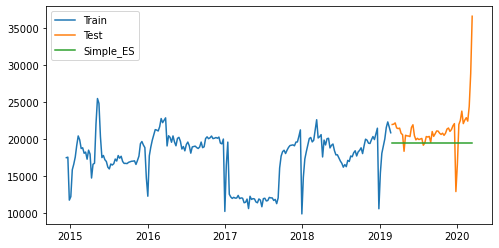

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 3460.75
Observations: 275
Training Observations: 220
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.1 and β= 0.4 is: 2706.76


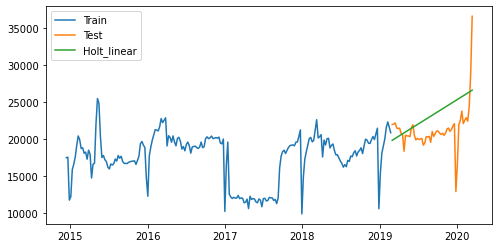

Observations: 275
Training Observations: 208
Testing Observations: 55


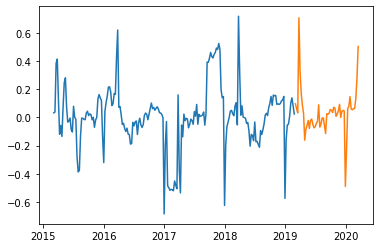

            Volume    pred_value
Date                            
2019-03-02   21995  23398.993910
2019-03-09   22038  23526.696318
2019-03-16   22208  23791.058591
2019-03-23   21531  23146.432752
2019-03-30   21438  23127.020429
2019-04-06   21504  23279.316164
2019-04-13   20797  22592.651797
2019-04-20   20617  22475.405598
2019-04-27   18374  20100.243973
2019-05-04   20543  22551.583019
2019-05-11   20457  22535.679713
2019-05-18   20442  22597.877511
2019-05-25   20360  22585.909822
2019-06-01   21599  24044.126846
2019-06-08   21957  24528.100542
2019-06-15   20485  22963.730107
2019-06-22   19914  22401.676343
2019-06-29   20126  22719.304573
2019-07-06   19960  22610.681484
2019-07-13   20034  22773.843635
2019-07-20   20108  22937.870231
2019-07-27   19192  21969.491232
2019-08-03   19495  22394.354774
2019-08-10   20366  23476.675864
2019-08-17   20302  23484.711946
2019-08-24   20383  23660.835085
2019-08-31   19589  22818.641230
2019-09-07   21044  24599.221150
2019-09-14

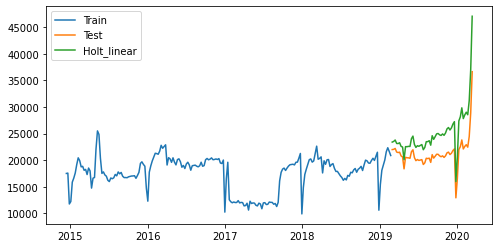

RMSE for Holt Linear Forecasting with transformation is: 4104.646023431593


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

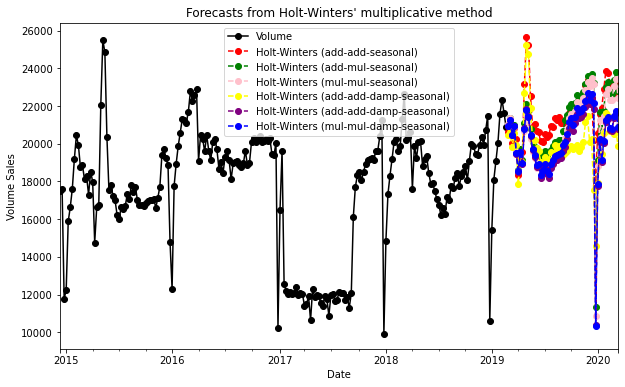

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
2730.146944864711
2403.0170850285376
2483.0198122746747
3164.511221261651
2820.1943578552855
2781.971424016303


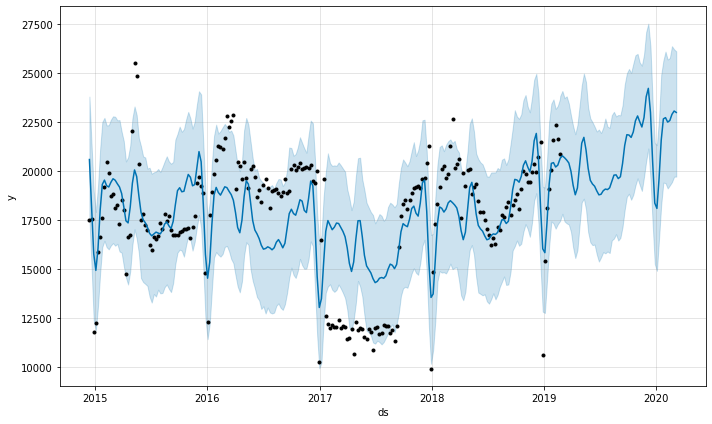

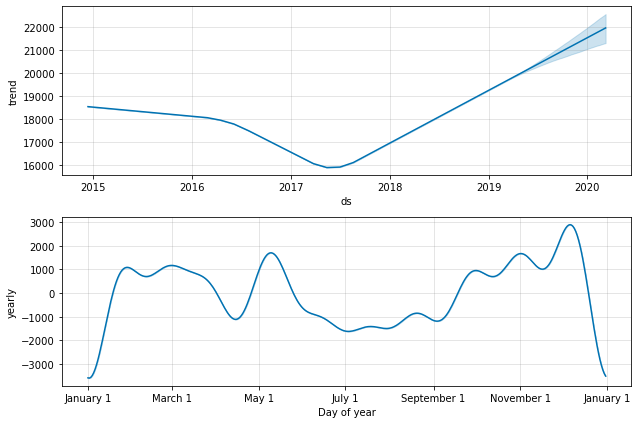

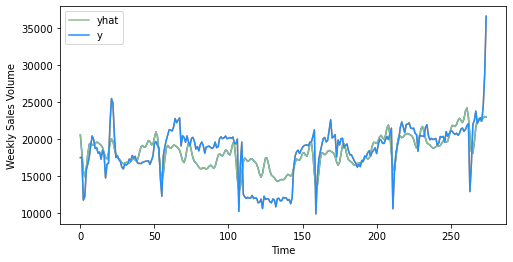

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 2504.930588969978


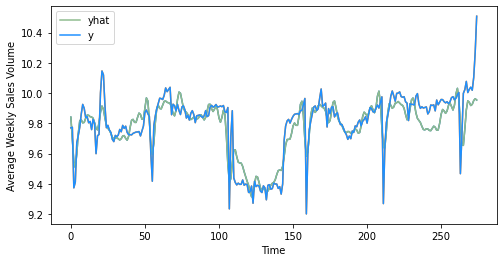

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 2017.9933959315483
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern I

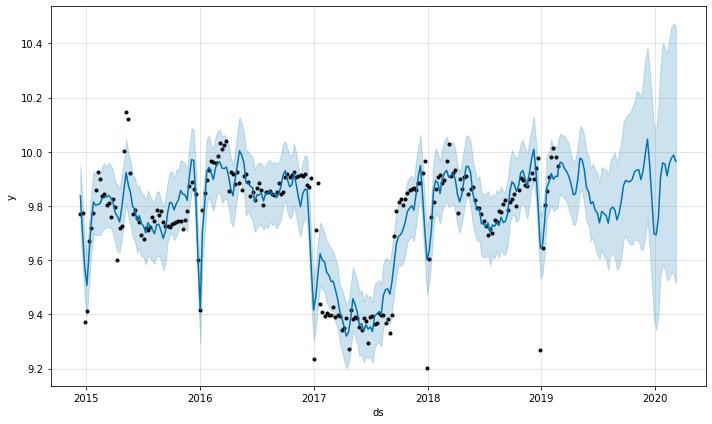

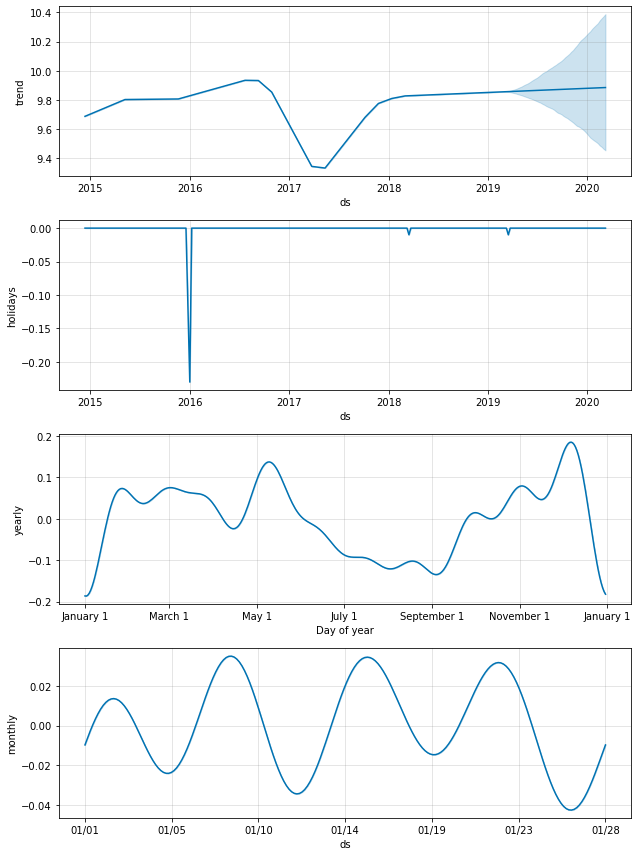

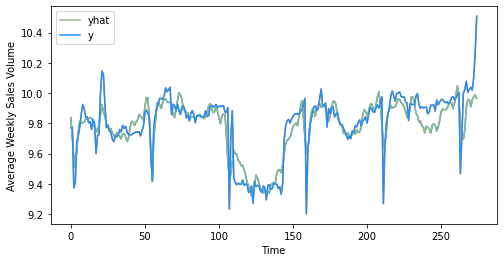

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 1952.1479073952528


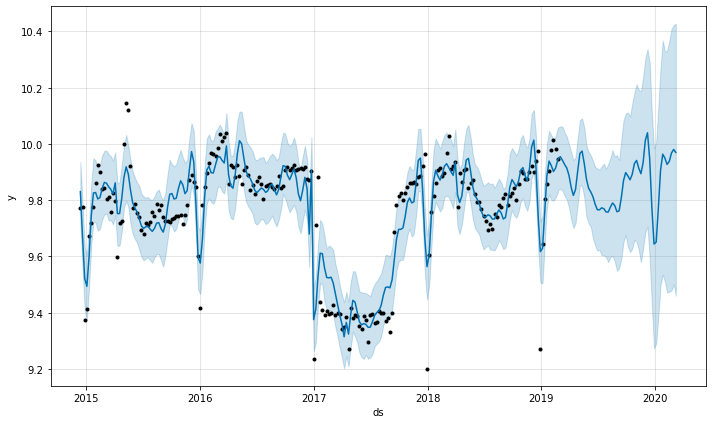

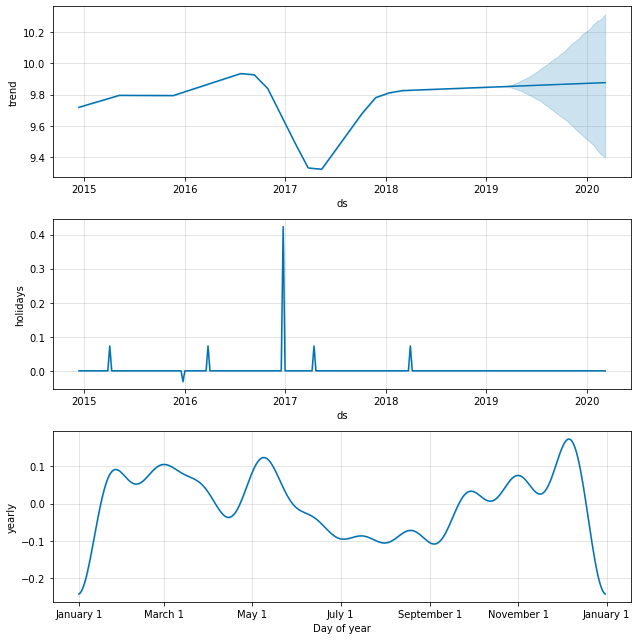

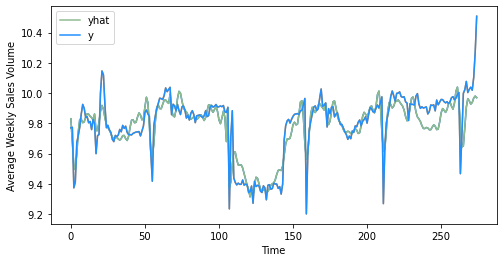

1939.454492947377


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [137]:

#time series models
baseline_model(mcv_rt_300g_twin_origin)
ses_model(mcv_rt_300g_twin_origin)
holt_linear_model(mcv_rt_300g_twin_origin)
holt_linear_model_log(mcv_rt_300g_twin_origin)
holt_winter_model(mcv_rt_300g_twin_origin)
prophet_model(mcv_rt_300g_twin_origin)
prophet_model_log(mcv_rt_300g_twin_origin)
prophet_log_season(mcv_rt_300g_twin_origin)
prophet_log_two_holiday(mcv_rt_300g_twin_origin)

Observations: 27
Training Observations: 15
Testing Observations: 12
[ -1.31135972  -6.6665266  -12.28915924  -8.36008367   0.50826687]
Mean Absolute Error: 2649.954166666667
Mean Squared Error: 7511072.928541665
Root Mean Squared Error: 2740.6336728102983
Observations: 39
Training Observations: 27
Testing Observations: 12
[-3.30634698 -1.56156942 -9.0623254  -5.33828811 -5.25402696]
Mean Absolute Error: 1258.2083333333333
Mean Squared Error: 2656088.5795833343
Root Mean Squared Error: 1629.751079025056
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.27251779 -11.27528136  -7.56500698  -5.98929049  -2.07081139]
Mean Absolute Error: 686.2833333333332
Mean Squared Error: 901453.5312500003
Root Mean Squared Error: 949.4490672226711
Observations: 63
Training Observations: 51
Testing Observations: 12
[-0.19492852 -4.69476388 -2.4188654  -6.1405461  -3.76995762]
Mean Absolute Error: 771.7875000000004
Mean Squared Error: 1337461.2331250014
Root Mean Squared Error: 1156

,var1(t-1),var1(t)
Date,,
2014-12-20,17512.0,17578
2014-12-27,17578.0,11776
2015-01-03,11776.0,12239
2015-01-10,12239.0,15878
2015-01-17,15878.0,16634
...,...,...
2020-02-15,22585.0,22913
2020-02-22,22913.0,22450
2020-02-29,22450.0,24445


   var1(t-1)   var1(t)
1   0.284564  0.287035
2   0.287035  0.069821
3   0.069821  0.087155
4   0.087155  0.223391
5   0.223391  0.251694
(219, 1, 1) (219,) (55, 1, 1) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 4s - loss: 0.2845 - val_loss: 0.4104
Epoch 2/50
219/219 - 0s - loss: 0.2706 - val_loss: 0.3949
Epoch 3/50
219/219 - 0s - loss: 0.2565 - val_loss: 0.3787
Epoch 4/50
219/219 - 0s - loss: 0.2418 - val_loss: 0.3614
Epoch 5/50
219/219 - 0s - loss: 0.2262 - val_loss: 0.3427
Epoch 6/50
219/219 - 0s - loss: 0.2100 - val_loss: 0.3222
Epoch 7/50
219/219 - 0s - loss: 0.1949 - val_loss: 0.3010
Epoch 8/50
219/219 - 0s - loss: 0.1809 - val_loss: 0.2785
Epoch 9/50
219/219 - 0s - loss: 0.1660 - val_loss: 0.2538
Epoch 10/50
219/219 - 0s - loss: 0.1496 - val_loss: 0.2263
Epoch 11/50
219/219 - 0s - loss: 0.1315 - val_loss: 0.1957
Epoch 12/50
219/219 - 0s - loss: 0.1117 - val_loss: 0.1613
Epoch 13/50
219/219 - 0s - loss: 0.0904 - val_loss: 0.1229
Epoch 14/50
219/219 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

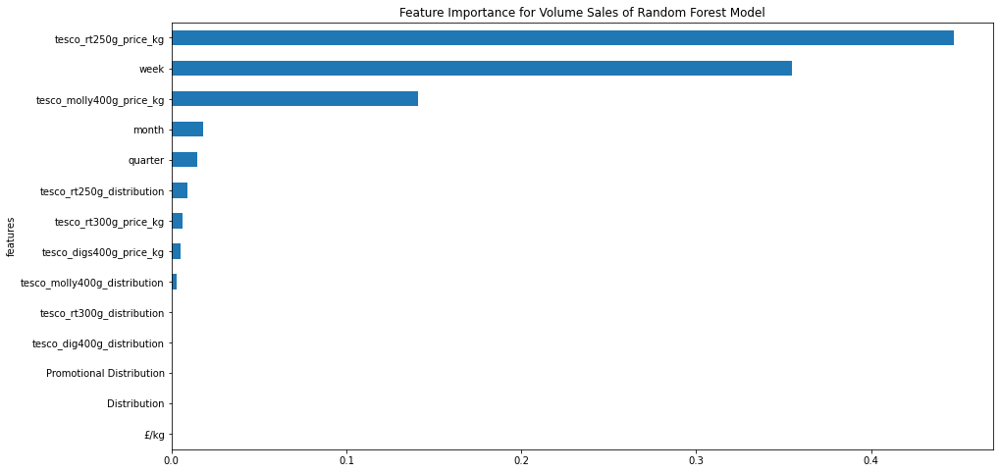

<Figure size 432x288 with 0 Axes>

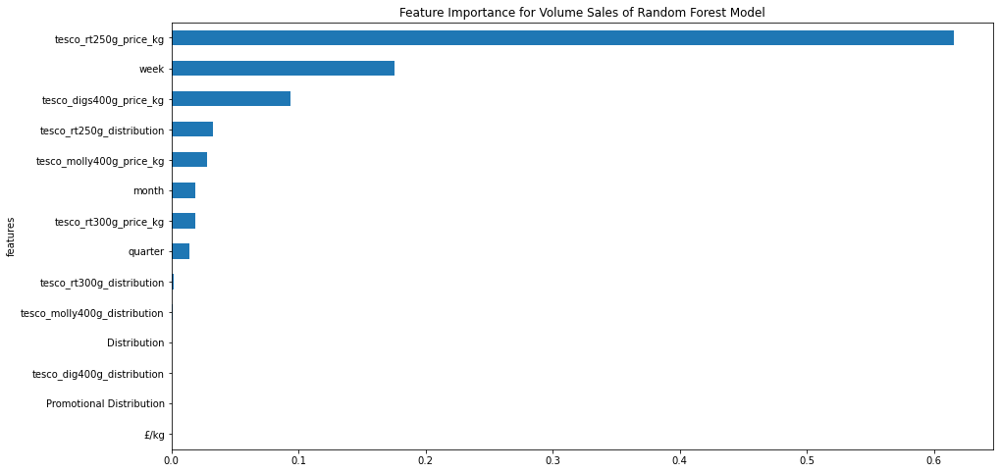

<Figure size 432x288 with 0 Axes>

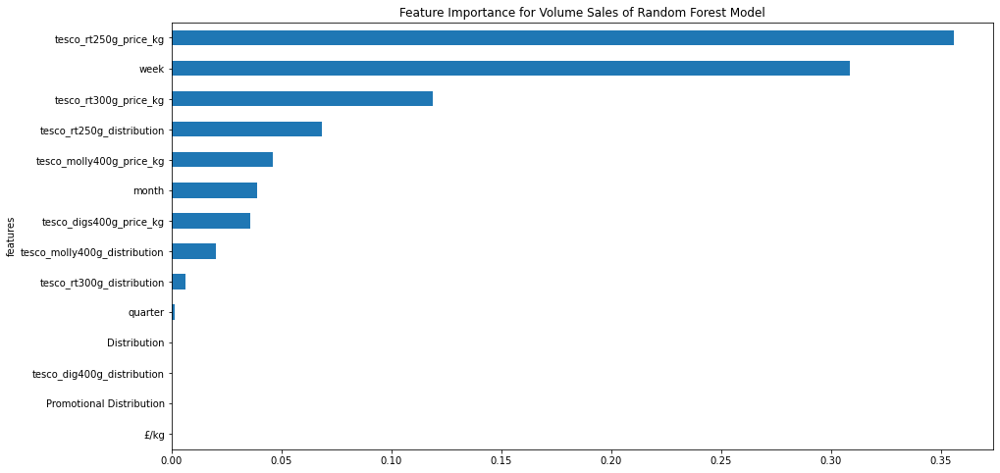

<Figure size 432x288 with 0 Axes>

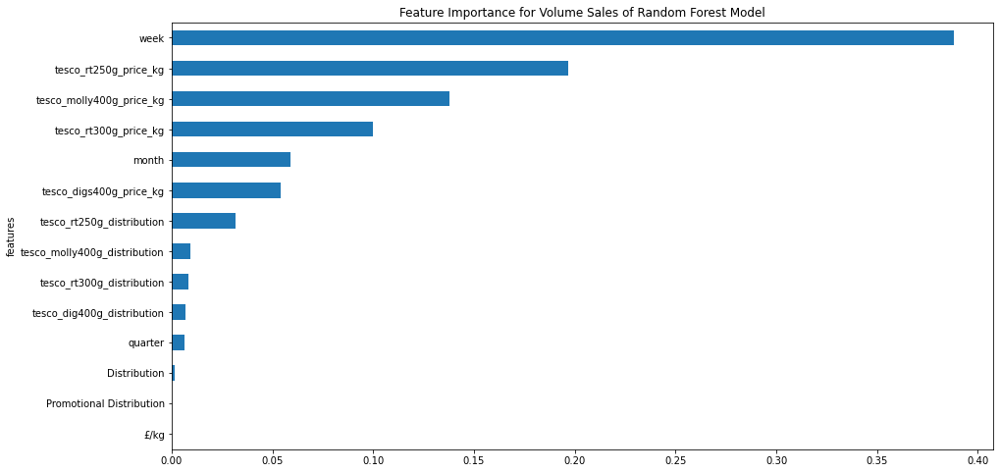

<Figure size 432x288 with 0 Axes>

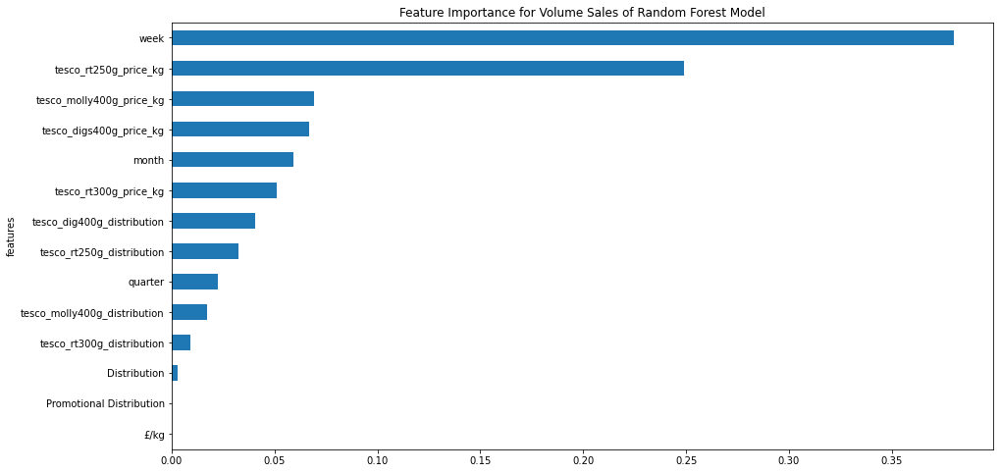

<Figure size 432x288 with 0 Axes>

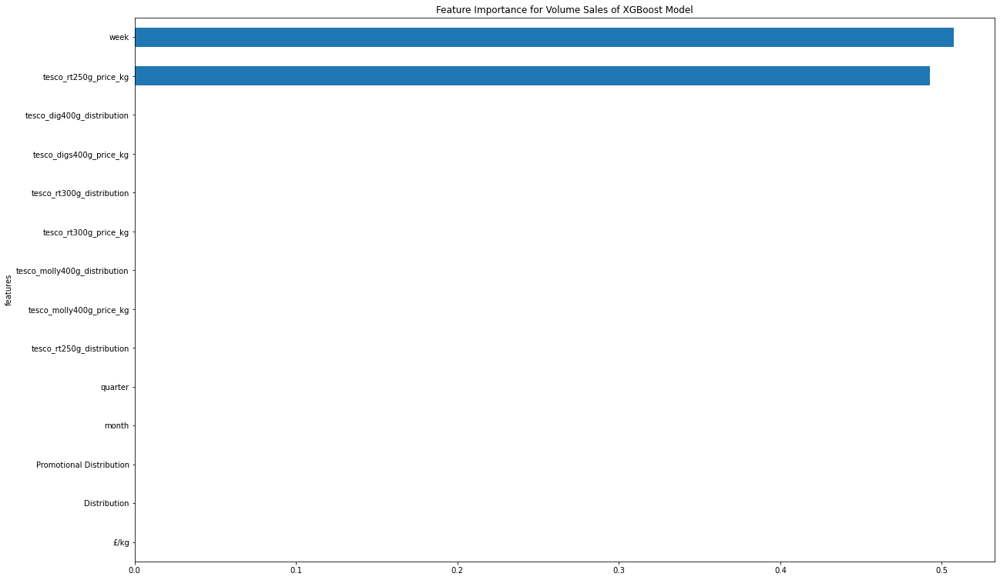

<Figure size 432x288 with 0 Axes>

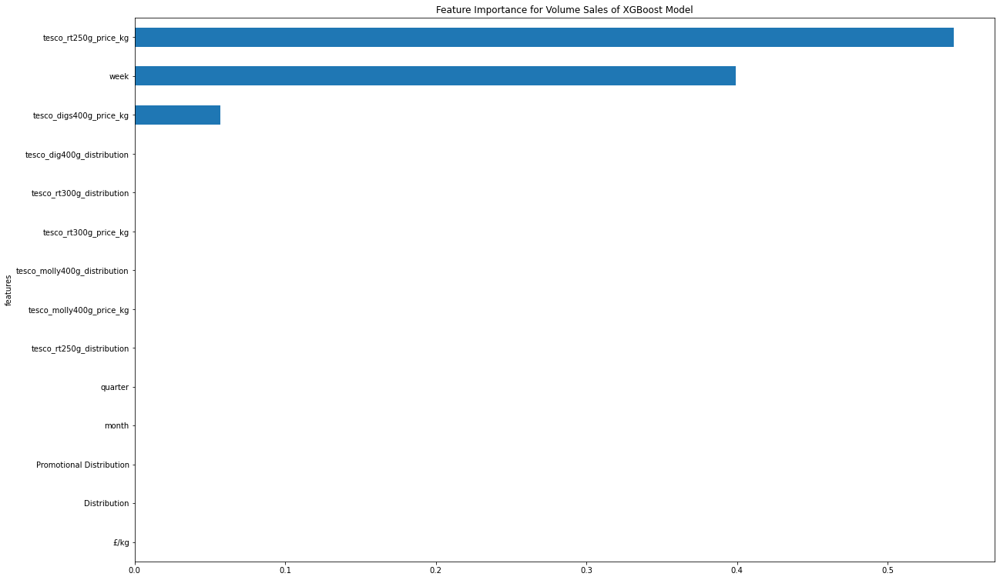

<Figure size 432x288 with 0 Axes>

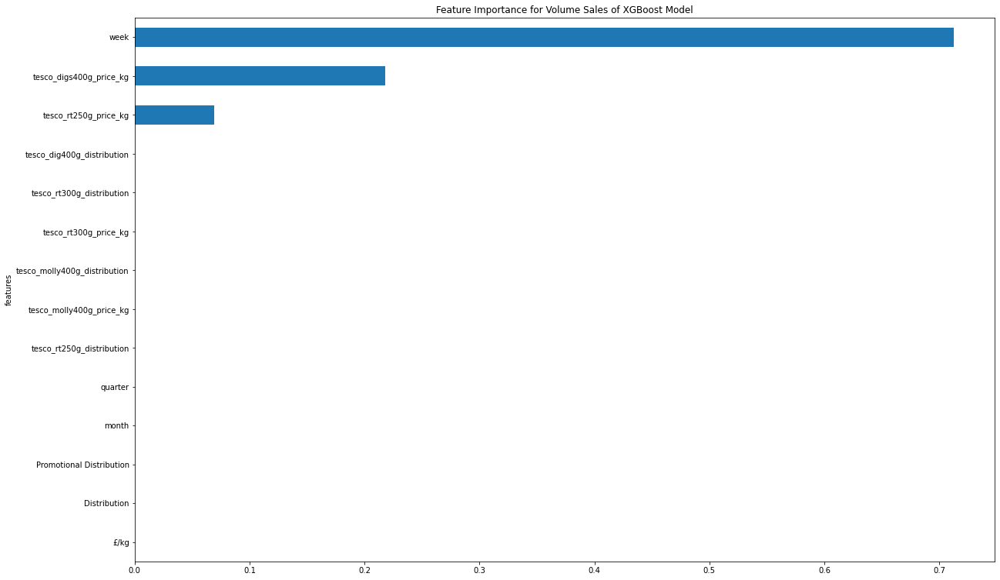

<Figure size 432x288 with 0 Axes>

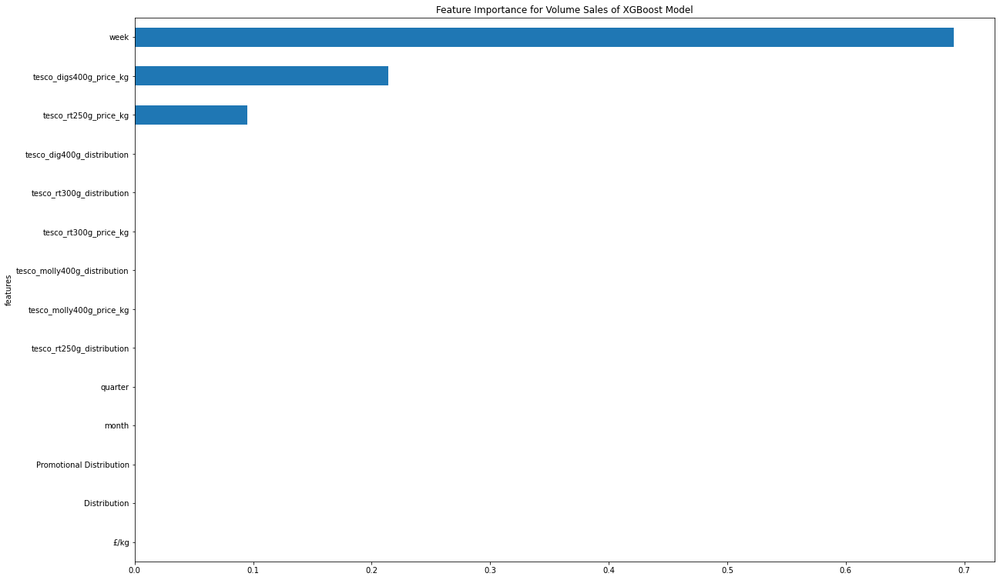

<Figure size 432x288 with 0 Axes>

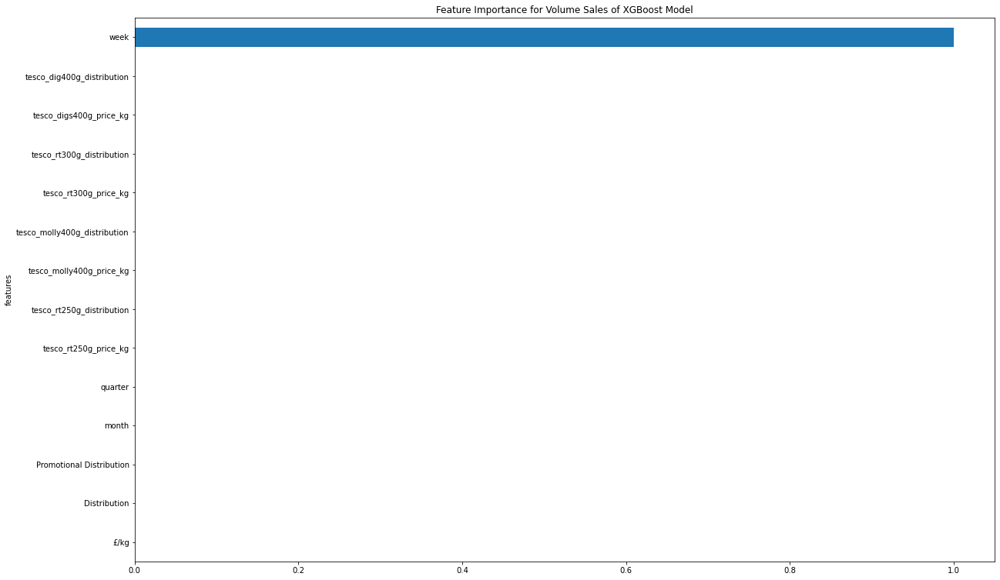

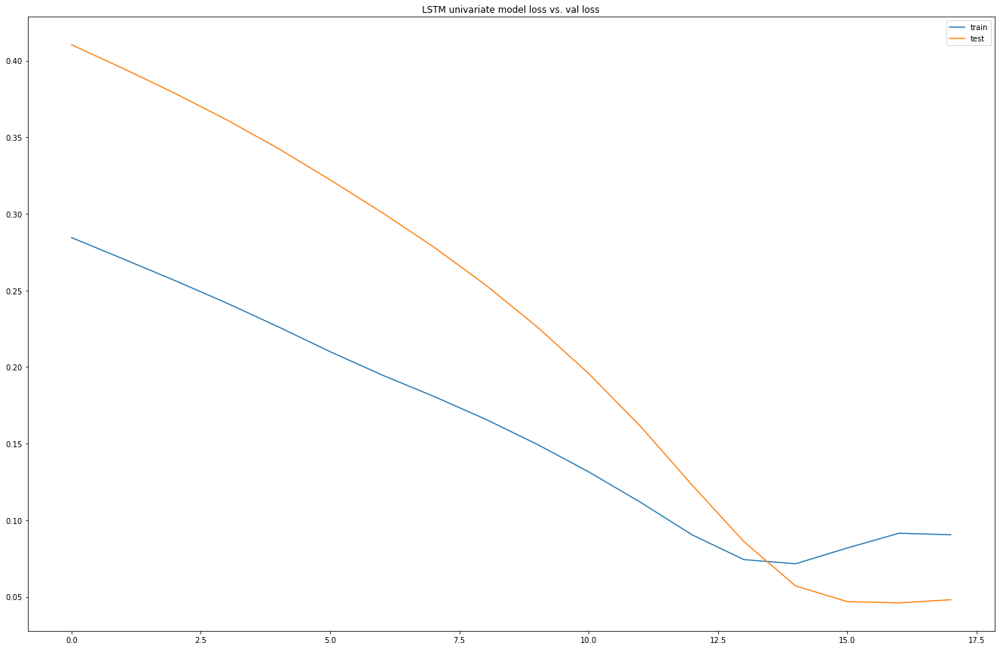

Test RMSE: 2570.857


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t)
Date,,,,,,,,,,,,,,
2014-12-20,17512.0,3.15,96.0,0.0,12.0,4.0,50.0,17578,3.15,96,0,12,4,51
2014-12-27,17578.0,3.15,96.0,0.0,12.0,4.0,51.0,11776,3.15,96,0,12,4,52
2015-01-03,11776.0,3.15,96.0,0.0,12.0,4.0,52.0,12239,3.15,96,0,1,1,1
2015-01-10,12239.0,3.15,96.0,0.0,1.0,1.0,1.0,15878,3.15,96,0,1,1,2
2015-01-17,15878.0,3.15,96.0,0.0,1.0,1.0,2.0,16634,3.15,96,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,22585.0,3.32,98.0,0.0,2.0,1.0,6.0,22913,3.32,98,0,2,1,7
2020-02-22,22913.0,3.32,98.0,0.0,2.0,1.0,7.0,22450,3.32,98,0,2,1,8
2020-02-29,22450.0,3.32,98.0,0.0,2.0,1.0,8.0,24445,3.32,98,0,2,1,9


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.284564   0.792683   0.918919        0.0        1.0        1.0   
2   0.287035   0.792683   0.918919        0.0        1.0        1.0   
3   0.069821   0.792683   0.918919        0.0        1.0        1.0   
4   0.087155   0.792683   0.918919        0.0        0.0        0.0   
5   0.223391   0.792683   0.918919        0.0        0.0        0.0   

   var7(t-1)   var1(t)  
1   0.942308  0.287035  
2   0.961538  0.069821  
3   0.980769  0.087155  
4   0.000000  0.223391  
5   0.019231  0.251694  
(219, 1, 7) (219,) (55, 1, 7) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 5s - loss: 0.2789 - val_loss: 0.3858
Epoch 2/50
219/219 - 0s - loss: 0.2447 - val_loss: 0.3473
Epoch 3/50
219/219 - 0s - loss: 0.2092 - val_loss: 0.3054
Epoch 4/50
219/219 - 0s - loss: 0.1734 - val_loss: 0.2598
Epoch 5/50
219/219 - 0s - loss: 0.1396 - val_loss: 0.2080
Epoch 6/50
219/219 - 0s - loss: 0.1037 - val_loss: 0

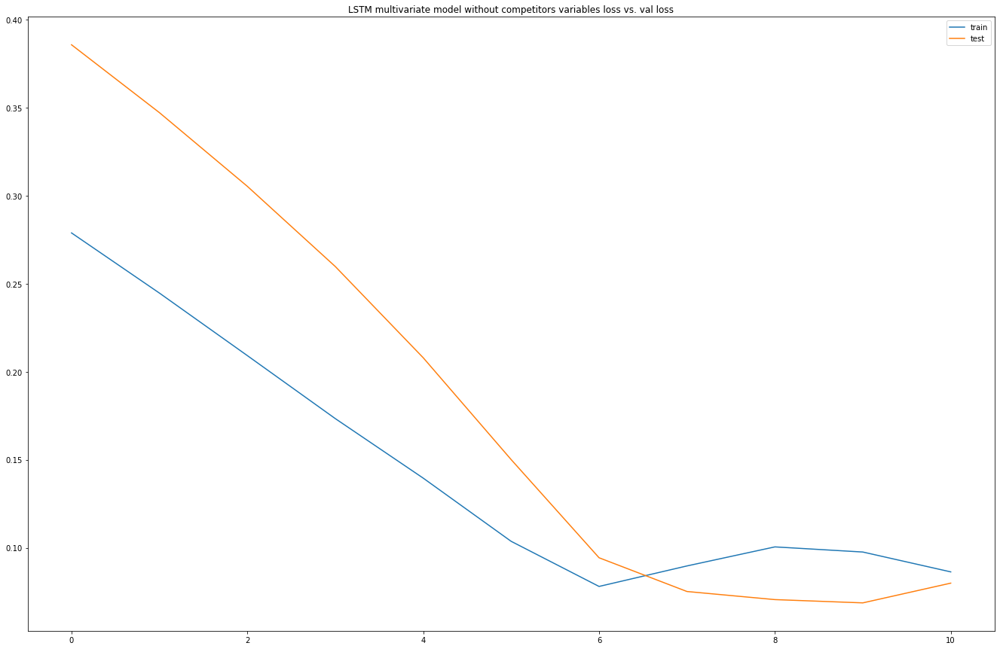

Test RMSE: 3362.567


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var6(t),var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-20,18062.0,3.15,98.0,0.0,10.0,4.0,41.0,2.241567,100.0,0.775123,...,4,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,19108.0,3.15,98.0,0.0,10.0,4.0,42.0,2.241541,100.0,0.775011,...,4,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,20010.0,3.15,98.0,0.0,10.0,4.0,43.0,2.241566,100.0,0.774954,...,4,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,19879.0,3.15,98.0,0.0,11.0,4.0,44.0,2.241457,100.0,0.775021,...,4,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,19467.0,3.15,98.0,0.0,11.0,4.0,45.0,2.241417,100.0,0.774982,...,4,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,22585.0,3.32,98.0,0.0,2.0,1.0,6.0,2.241456,100.0,0.774977,...,1,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,22913.0,3.32,98.0,0.0,2.0,1.0,7.0,2.241447,100.0,0.774976,...,1,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,22450.0,3.32,98.0,0.0,2.0,1.0,8.0,2.241482,100.0,0.774958,...,1,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.286511        0.0        1.0        0.0   0.818182        1.0   
2   0.326721        0.0        1.0        0.0   0.818182        1.0   
3   0.361396        0.0        1.0        0.0   0.818182        1.0   
4   0.356360        0.0        1.0        0.0   0.909091        1.0   
5   0.340522        0.0        1.0        0.0   0.909091        1.0   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1   0.784314   0.994400        1.0    0.980005    0.136842    0.982941   
2   0.803922   0.993778        1.0    0.979163    0.589474    0.982361   
3   0.823529   0.994396        1.0    0.978738    0.589474    0.995712   
4   0.843137   0.991779        1.0    0.979244    0.589474    0.993225   
5   0.862745   0.990829        1.0    0.978948    0.600000    0.986877   

   var13(t-1)  var14(t-1)  var15(t-1)   var1(t)  
1         0.5    0.760128         1.0  0.326721  
2         0.5    0.759899   

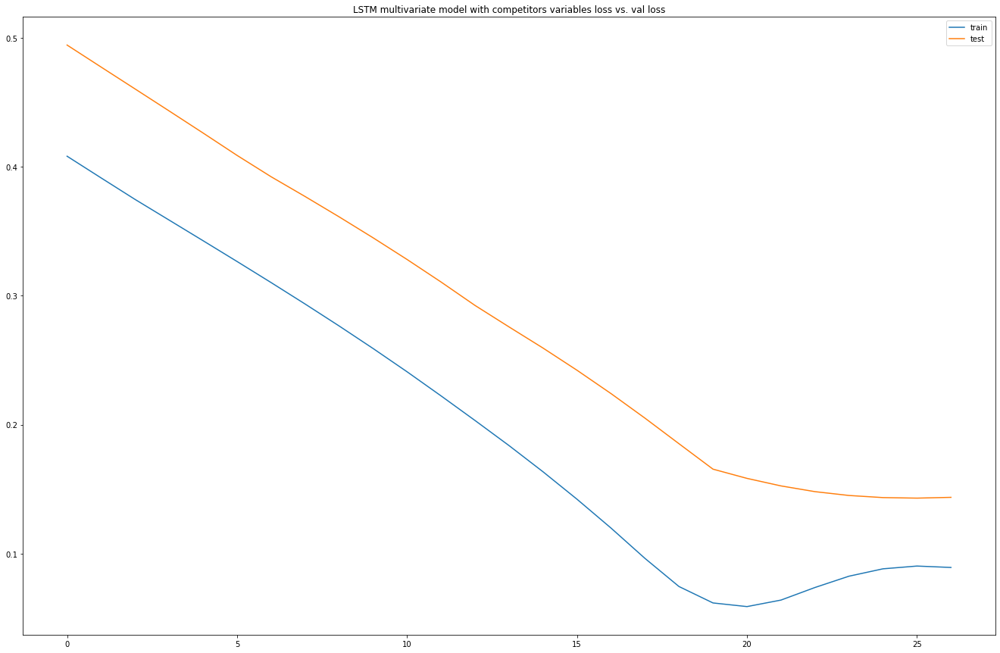

Test RMSE: 5660.884


In [99]:
#ml models
mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y=input_var(mcv_rt_300g_twin_with_comp)
rf_regressor_mcv(mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y)

mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y=input_var(mcv_rt_300g_twin_with_comp)
xgb_regressor_mcv(mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y)

#lstm models
series_to_supervised(mcv_rt_300g_twin_volume)
lstm_univariate(mcv_rt_300g_twin_volume)

series_to_supervised(mcv_rt_300g_twin_own_variable)
multivariate_lstm_without_competitor(mcv_rt_300g_twin_own_variable)

series_to_supervised(mcv_rt_300g_twin_with_comp)
multivariate_with_competitor(mcv_rt_300g_twin_with_comp)

## Tesco Large - Tesco Rich Tea 250g (Competitor)

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
0,2014-12-13,54378,13594.5,27201.2,98,0,0.500224,2.000897,4,12,50
1,2014-12-20,51398,12849.5,25709.2,98,0,0.500198,2.000794,4,12,51
2,2014-12-27,35281,8820.3,17648.5,98,0,0.500227,2.000896,4,12,52
3,2015-01-03,35677,8919.3,17847.5,98,0,0.500252,2.000998,1,1,1
4,2015-01-10,48619,12154.8,24322.0,98,0,0.500257,2.001020,1,1,2


(275, 11)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,quarter,month,week
count,275.00000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000
mean,56206.12000,14051.554182,27940.253818,95.465455,0.0,0.492309,1.969162,2.469091,6.414545,26.043636
std,13731.15737,3432.792086,7969.553785,18.323972,0.0,0.067310,0.269348,1.140635,3.547767,15.490223
min,2.00000,0.500000,0.800000,0.000000,0.0,0.389474,1.541667,1.000000,1.000000,1.000000
25%,54871.00000,13717.800000,24597.800000,98.000000,0.0,0.400055,1.600222,1.000000,3.000000,12.000000
50%,59591.00000,14897.800000,29419.500000,100.000000,0.0,0.500217,2.000870,2.000000,6.000000,26.000000
75%,62805.50000,15701.400000,33396.050000,100.000000,0.0,0.560321,2.241278,3.500000,9.500000,39.500000
95%,67047.70000,16761.940000,36391.630000,100.000000,0.0,0.560395,2.241577,4.000000,12.000000,50.000000
99%,70972.94000,17743.272000,39030.728000,100.000000,0.0,0.560431,2.241716,4.000000,12.000000,52.000000
max,94573.00000,23643.300000,52998.200000,100.000000,0.0,0.560452,2.241802,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg       

<Figure size 432x288 with 0 Axes>

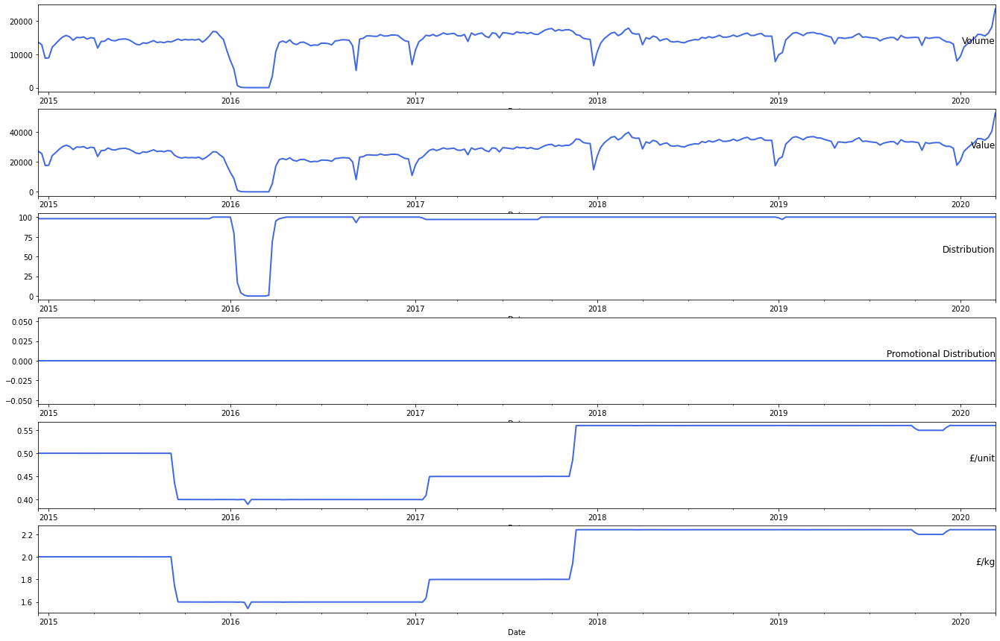

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8e72333c8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8e7183470>)

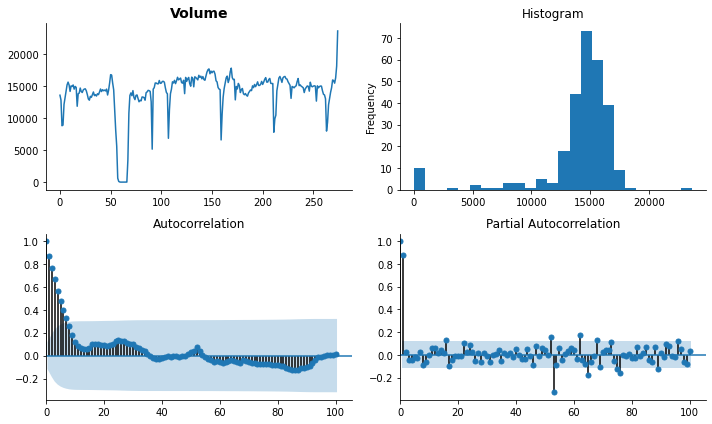

In [100]:
basic_info(tes_rt_250g_origin)
plot_data(tes_rt_250g_origin)
tsplot(tes_rt_250g_origin['Volume'].dropna(), title=tes_rt_250g_origin.columns[2], lags=100)


Test Statistic                  -3.567857
p-value                          0.006406
#Lags Used                       0.000000
Number of Observations Used    274.000000
Critical Value (1%)             -3.454444
Critical Value (5%)             -2.872147
Critical Value (10%)            -2.572422
dtype: float64


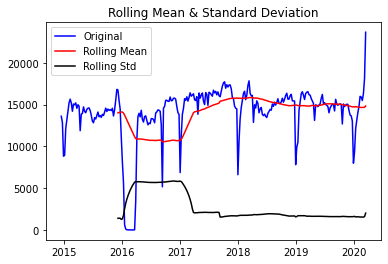

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd8e7022da0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd8e6fbb2e8>)

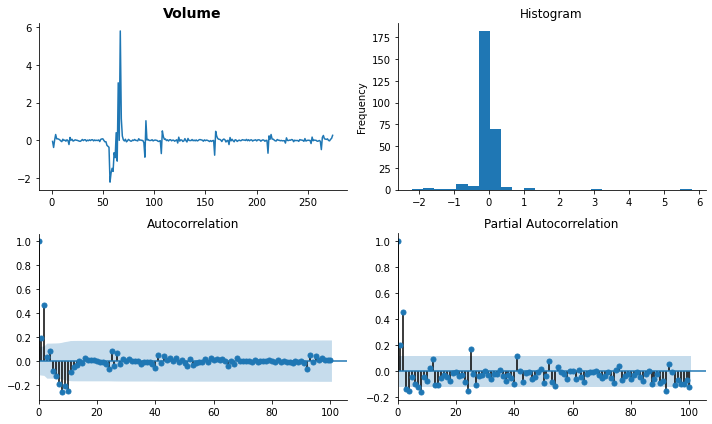

In [101]:
plot(tes_rt_250g_origin)
series_transformed=tes_rt_250g_origin.copy()
series_transformed['Volume_transformed']=np.log(tes_rt_250g_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=tes_rt_250g_origin.columns[2], lags=100)


       t-1      t+1
0      NaN  13594.5
1  13594.5  12849.5
2  12849.5   8820.3
3   8820.3   8919.3
4   8919.3  12154.8
Test MSE: 1824566.044
Test RMSE: 1350.765


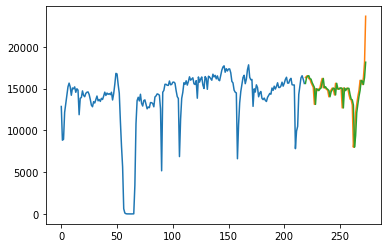

Observations: 275
Training Observations: 220
Testing Observations: 55


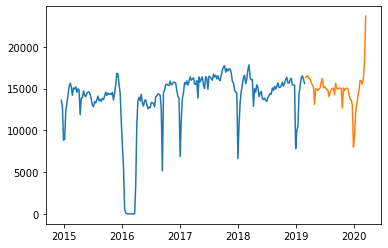

RMSE for Simple Exponential Smoothing α= 0.1 is: 1972.97
RMSE for Simple Exponential Smoothing α= 0.2 is: 1968.57
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 2020.61
RMSE for Simple Exponential Smoothing α= 0.4 is: 2101.78
RMSE for Simple Exponential Smoothing α= 0.5 is: 2152.34
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 2162.94
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 2149.52
RMSE for Simple Exponential Smoothing α= 0.8 is: 2127.53
RMSE for Simple Exponential Smoothing α= 0.9 is: 2105.4


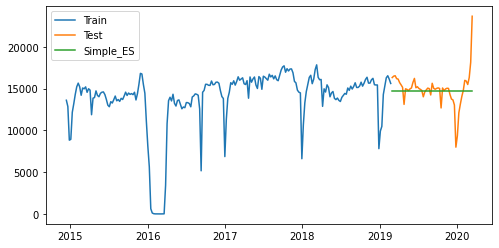

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 2004.23
Observations: 275
Training Observations: 220
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.9 and β= 0.4 is: 2032.65


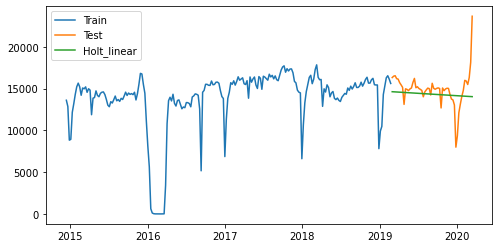

Observations: 275
Training Observations: 208
Testing Observations: 55


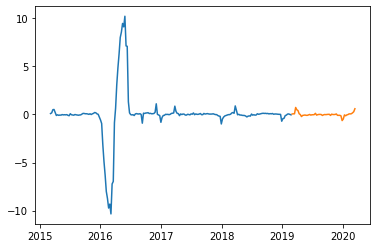

             Volume    pred_value
Date                             
2019-03-02  16307.8  14649.944999
2019-03-09  16476.3  14695.232658
2019-03-16  16529.0  14636.576692
2019-03-23  16176.8  14222.033815
2019-03-30  16123.8  14073.841347
2019-04-06  15709.5  13613.938009
2019-04-13  15435.5  13280.617418
2019-04-20  15141.3  12934.120000
2019-04-27  13101.8  11111.708630
2019-05-04  14962.3  12598.661144
2019-05-11  14891.3  12449.009767
2019-05-18  14747.8  12240.681328
2019-05-25  14952.5  12321.634475
2019-06-01  15063.8  12324.383639
2019-06-08  15725.8  12773.784159
2019-06-15  16206.8  13070.140494
2019-06-22  15092.3  12084.107227
2019-06-29  15211.8  12092.494692
2019-07-06  15008.5  11845.373138
2019-07-13  14897.8  11673.732939
2019-07-20  14765.8  11487.373804
2019-07-27  14009.0  10820.493406
2019-08-03  14590.0  11188.487449
2019-08-10  14833.0  11293.309790
2019-08-17  15046.0  11373.377650
2019-08-24  14987.5  11247.959822
2019-08-31  14228.0  10601.433036
2019-09-07  15

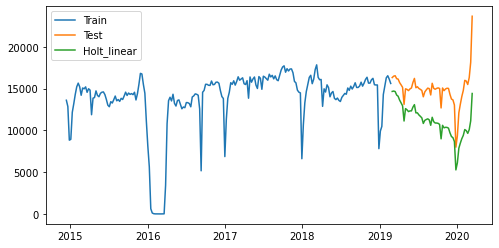

RMSE for Holt Linear Forecasting with transformation is: 4049.8515116338563


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/

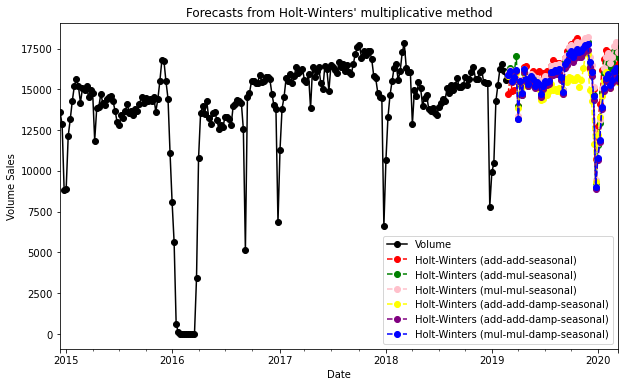

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
2278.9953873974378
1937.639238916764
2120.007534046888
1605.7718323757415
1844.8132819617683
1954.9549389011981


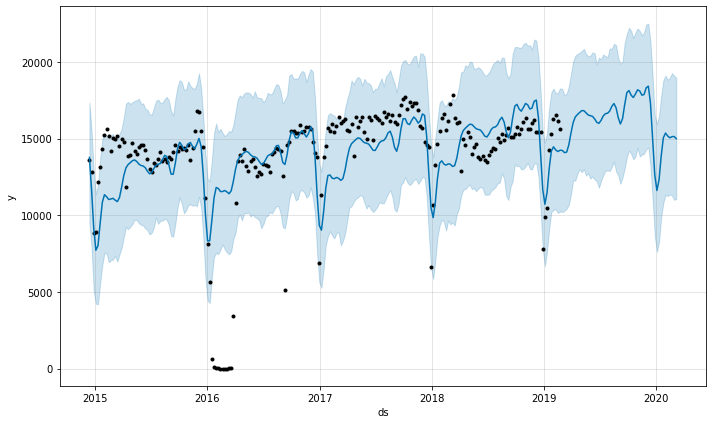

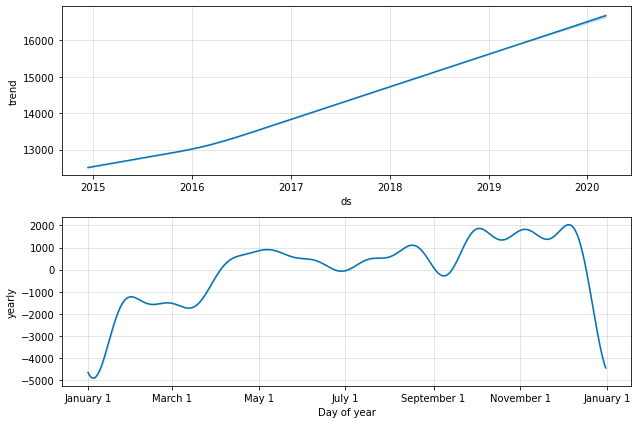

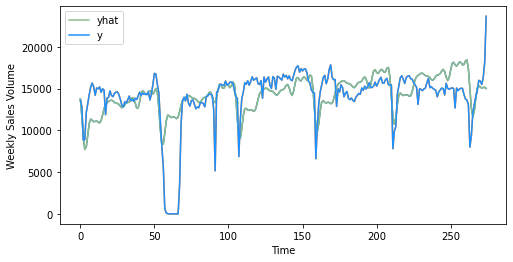

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 3019.956152313255


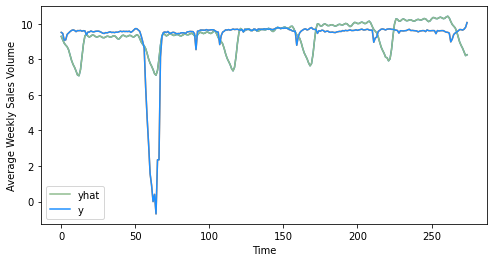

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 7988.168941159391
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

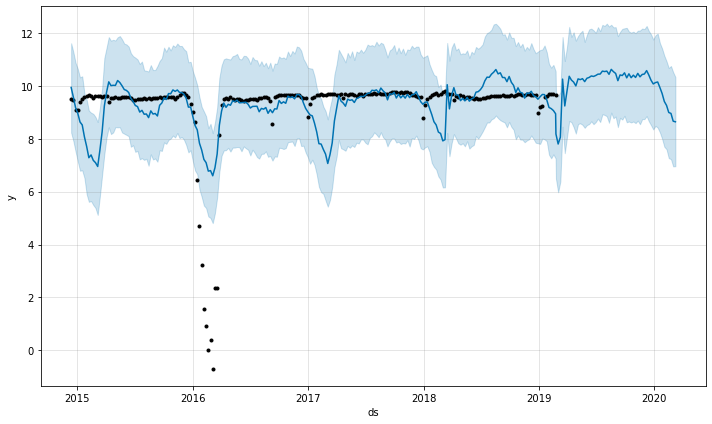

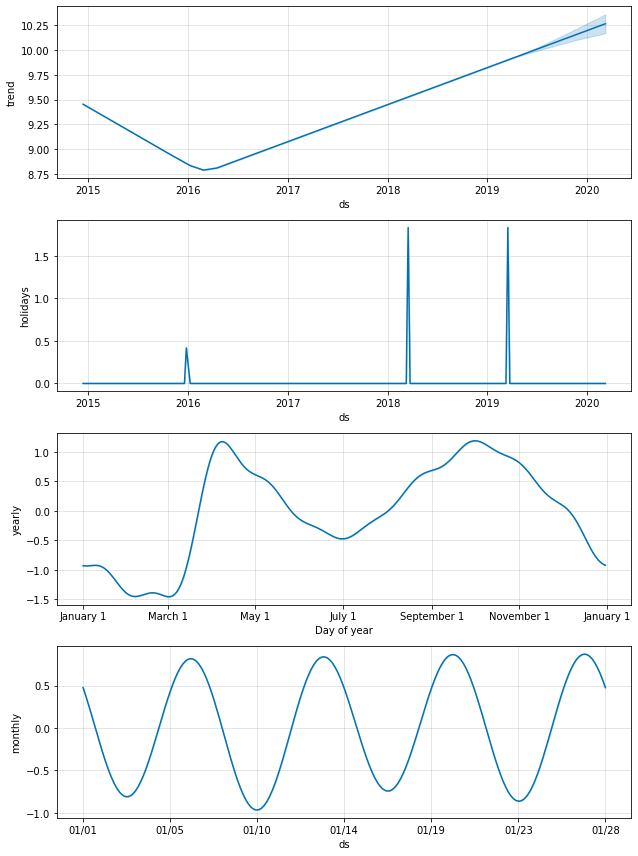

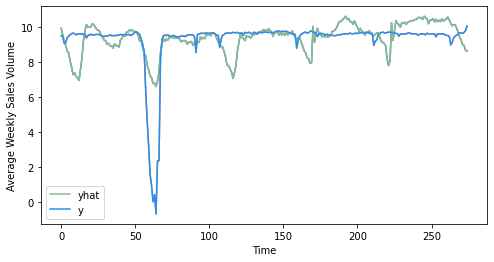

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 9679.200507828386


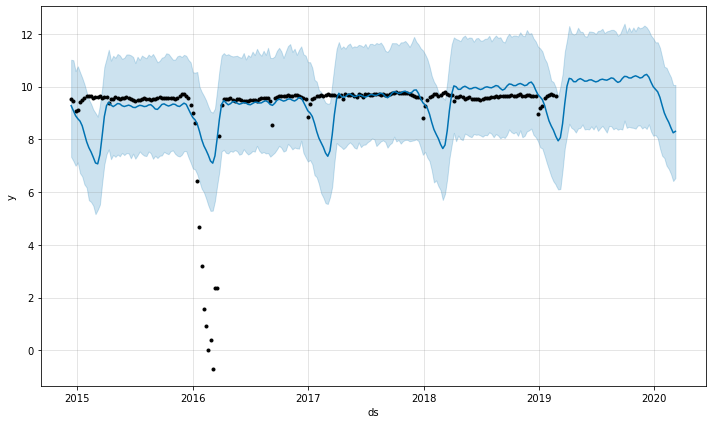

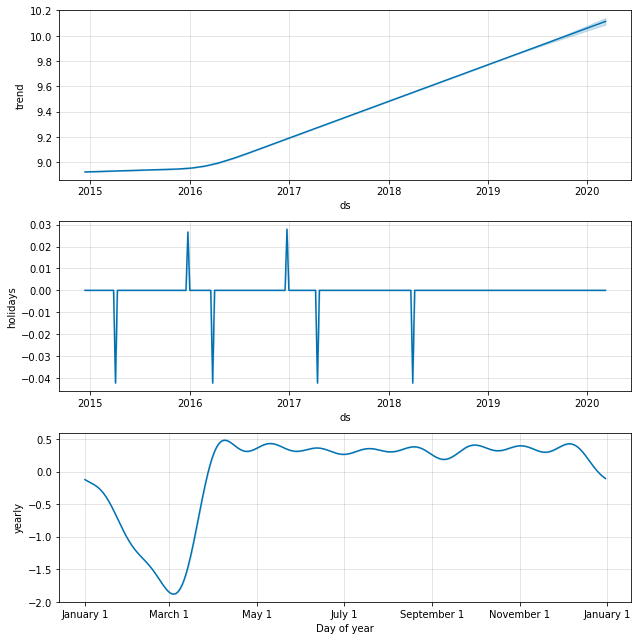

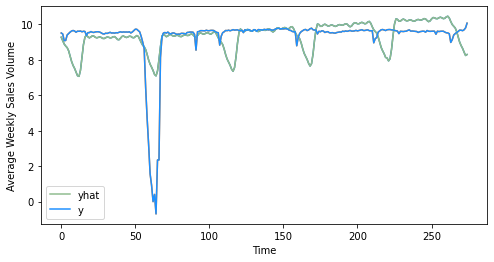

8279.147807762565


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:50: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [138]:
#time series models
baseline_model(tes_rt_250g_origin)
ses_model(tes_rt_250g_origin)
holt_linear_model(tes_rt_250g_origin)
holt_linear_model_log(tes_rt_250g_origin)
holt_winter_model(tes_rt_250g_origin)
prophet_model(tes_rt_250g_origin)
prophet_model_log(tes_rt_250g_origin)
prophet_log_season(tes_rt_250g_origin)
prophet_log_two_holiday(tes_rt_250g_origin)

## trend comparison


In [103]:
# tes_rt_250g_with_comp_1=tes_rt_250g_own_variable
# tes_dig_400g_with_comp_1=tes_dig_400g_own_variable
# tes_rt_300g_with_comp1=tes_rt_300g_own_variable
# tes_molly_400g_with_comp1=tes_molly_400g_own_variable


<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_volume')

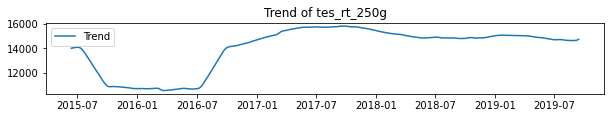

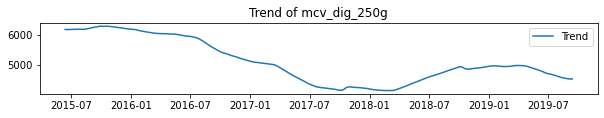

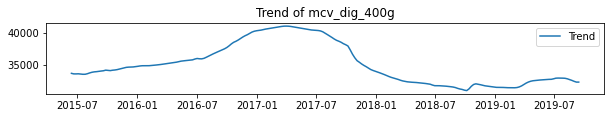

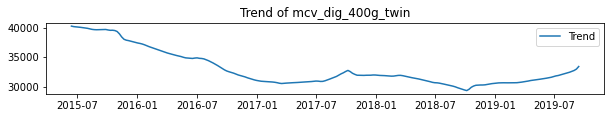

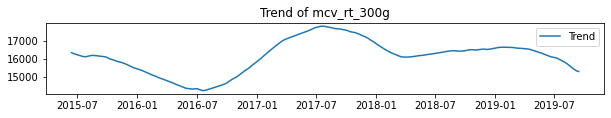

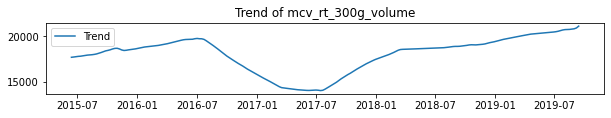

In [104]:
tes_rt_250g_competitor=[tes_rt_250g_volume, mcv_dig_250g_volume, mcv_dig_400g_volume, mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_rt_250g_competitor_list=['tes_rt_250g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']
tes_dig_400g_competitor=[tes_dig_400g_volume,mcv_dig_250g_volume,mcv_dig_400g_volume,mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_dig_400g_competitor_list=['tes_dig_400g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']
tes_rt_300g_competitor=[tes_rt_300g_volume,mcv_dig_250g_volume,mcv_dig_400g_volume,mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_rt_300g_competitor_list=['tes_rt_300g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']
tes_molly_400g_competitor=[tes_molly_400g_volume,mcv_dig_250g_volume,mcv_dig_400g_volume,mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_molly_400g_competitor_list=['tes_molly_400g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']

# product_name=['mcv_dig_250g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#              'mcv_dig_400g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_dig_400g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g'
#              ]

i=0
for product in tes_rt_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + tes_rt_250g_competitor_list[i] )
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_volume')

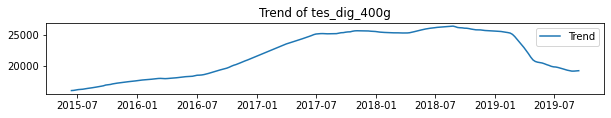

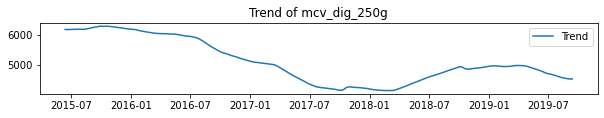

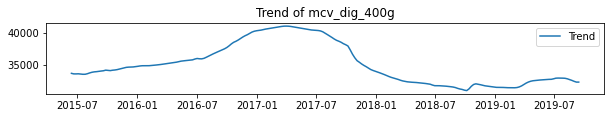

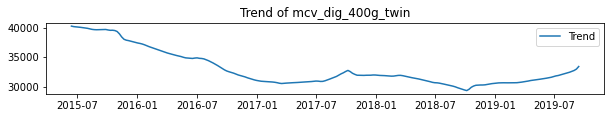

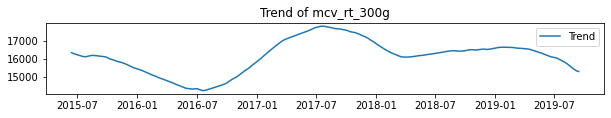

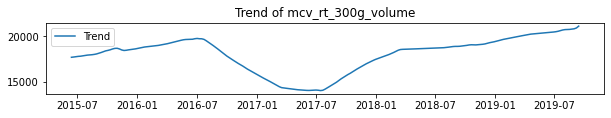

In [105]:
i=0
for product in tes_dig_400g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + tes_dig_400g_competitor_list[i] )
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_volume')

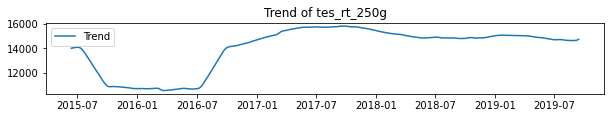

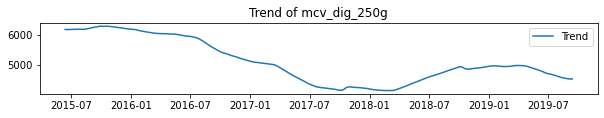

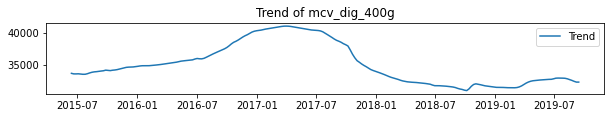

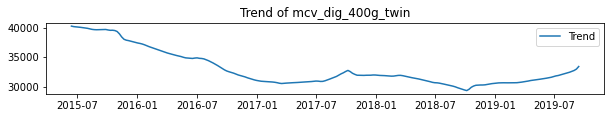

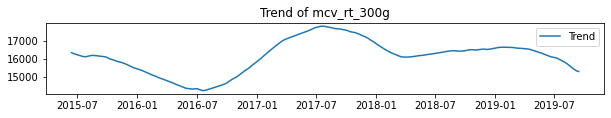

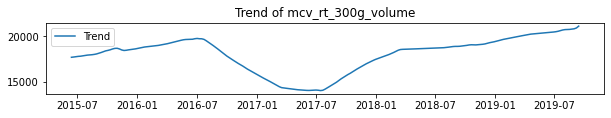

In [106]:
i=0
for product in tes_rt_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + tes_rt_250g_competitor_list[i] )
    i=i+1

Tesco molly400g does not contain enough datapoints to capture the trends.

In [107]:
# i=0
# for product in tes_molly_400g_competitor:
#     decomposition=seasonal_decompose(product)
#     trend_1=decomposition.trend

#     plt.figure(figsize=(10,6))
#     plt.subplot(412)
#     plt.plot(trend_1, label='Trend')
#     plt.legend(loc='best')
#     plt.title('Trend of ' + tes_molly_400g_competitor_list[i] )
#     i=i+1

plot trend comparisons graphs

In [139]:
decomposition_1=seasonal_decompose(tes_rt_250g_volume)
trend_1=decomposition_1.trend
trend_1=trend_1.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
comp_trend5=comp_decomposition_5.trend
comp_trend5=comp_trend5.to_frame()

tes_rt_250g_comp=pd.merge(trend_1,comp_trend1, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend2, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend3, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend4, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend5, how='left', on='Date')
tes_rt_250g_comp.columns=['tes_rt_250g_trend', 'mcv_dig_250g_trend','mcv_dig_400g_trend','mcv_dig_400g_twin_trend','mcv_rt_300g_trend','mcv_rt_300g_twin_trend']

tes_rt_250g_comp.corr()


,tes_rt_250g_trend,mcv_dig_250g_trend,mcv_dig_400g_trend,mcv_dig_400g_twin_trend,mcv_rt_300g_trend,mcv_rt_300g_twin_trend
tes_rt_250g_trend,1.000000,-0.886110,0.073859,-0.767722,0.760581,-0.394315
mcv_dig_250g_trend,-0.886110,1.000000,-0.000553,0.815187,-0.665818,0.284689
mcv_dig_400g_trend,0.073859,-0.000553,1.000000,-0.057685,0.122796,-0.833973
mcv_dig_400g_twin_trend,-0.767722,0.815187,-0.057685,1.000000,-0.426095,0.183894
mcv_rt_300g_trend,0.760581,-0.665818,0.122796,-0.426095,1.000000,-0.563714
mcv_rt_300g_twin_trend,-0.394315,0.284689,-0.833973,0.183894,-0.563714,1.000000


In [109]:
decomposition_2=seasonal_decompose(tes_dig_400g_volume)
trend_2=decomposition_2.trend
trend_2=trend_2.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
comp_trend5=comp_decomposition_5.trend
comp_trend5=comp_trend5.to_frame()

tes_dig_400g_comp=pd.merge(trend_2,comp_trend1, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend2, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend3, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend4, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend5, how='left', on='Date')
tes_dig_400g_comp.columns=['tes_dig_400g_trend', 'mcv_dig_250g_trend','mcv_dig_400g_trend','mcv_dig_400g_twin_trend','mcv_rt_300g_trend','mcv_rt_300g_twin_trend']

tes_dig_400g_comp.corr()


,tes_dig_400g_trend,mcv_dig_250g_trend,mcv_dig_400g_trend,mcv_dig_400g_twin_trend,mcv_rt_300g_trend,mcv_rt_300g_twin_trend
tes_dig_400g_trend,1.000000,-0.866579,-0.079756,-0.838641,0.675009,-0.299945
mcv_dig_250g_trend,-0.866579,1.000000,-0.000553,0.815187,-0.665818,0.284689
mcv_dig_400g_trend,-0.079756,-0.000553,1.000000,-0.057685,0.122796,-0.833973
mcv_dig_400g_twin_trend,-0.838641,0.815187,-0.057685,1.000000,-0.426095,0.183894
mcv_rt_300g_trend,0.675009,-0.665818,0.122796,-0.426095,1.000000,-0.563714
mcv_rt_300g_twin_trend,-0.299945,0.284689,-0.833973,0.183894,-0.563714,1.000000


In [110]:
decomposition_3=seasonal_decompose(tes_rt_300g_volume)
trend_3=decomposition_3.trend
trend_3=trend_3.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
comp_trend5=comp_decomposition_5.trend
comp_trend5=comp_trend5.to_frame()

tes_rt_300g_comp=pd.merge(trend_3,comp_trend1, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend2, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend3, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend4, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend5, how='left', on='Date')
tes_rt_300g_comp.columns=['tes_rt_300g_trend', 'mcv_dig_250g_trend','mcv_dig_400g_trend','mcv_dig_400g_twin_trend','mcv_rt_300g_trend','mcv_rt_300g_twin_trend']

tes_rt_300g_comp.corr()


,tes_rt_300g_trend,mcv_dig_250g_trend,mcv_dig_400g_trend,mcv_dig_400g_twin_trend,mcv_rt_300g_trend,mcv_rt_300g_twin_trend
tes_rt_300g_trend,1.000000,0.609020,0.013966,0.159325,-0.195562,0.843504
mcv_dig_250g_trend,0.609020,1.000000,-0.603819,-0.660605,-0.369204,0.665707
mcv_dig_400g_trend,0.013966,-0.603819,1.000000,0.338117,0.825617,-0.895918
mcv_dig_400g_twin_trend,0.159325,-0.660605,0.338117,1.000000,-0.027466,-0.115013
mcv_rt_300g_trend,-0.195562,-0.369204,0.825617,-0.027466,1.000000,-0.889759
mcv_rt_300g_twin_trend,0.843504,0.665707,-0.895918,-0.115013,-0.889759,1.000000


In [111]:
# decomposition_4=seasonal_decompose(tes_molly_400g_volume)
# trend_4=decomposition_4.trend
# trend_4=trend_4.to_frame()

# comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
# comp_trend1=comp_decomposition_1.trend
# comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

# comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
# comp_trend3=comp_decomposition_3.trend
# comp_trend3=comp_trend3.to_frame()

# comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
# comp_trend4=comp_decomposition_4.trend
# comp_trend4=comp_trend4.to_frame()

# comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
# comp_trend5=comp_decomposition_5.trend
# comp_trend5=comp_trend5.to_frame()

# tes_molly_400g_comp=pd.merge(trend_4,comp_trend1, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend2, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend3, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend4, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend5, how='left', on='Date')
# tes_molly_400g_comp.columns=['trend', 'competitor_trend1','competitor_trend2','competitor_trend3','competitor_trend4','competitor_trend5']


# tes_molly_400g_comp.corr()

In [112]:
#extract own product variables: sales price distribution promotional week month quarter
def own_product_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
    x=x[['Volume','£/kg','Distribution','Promotional Distribution','month','quarter','week']]
    return x

tes_rt_250g_own_variable=own_product_variables(tes_rt_250g_origin)
tes_dig_400g_own_variable=own_product_variables(tes_dig_400g_origin)
tes_rt_300g_own_variable=own_product_variables(tes_rt_300g_origin)
tes_molly_400g_own_variable=own_product_variables(tes_molly_400g_origin)

tes_rt_250g_with_comp_1=tes_rt_250g_own_variable
tes_dig_400g_with_comp_1=tes_dig_400g_own_variable
tes_rt_300g_with_comp1=tes_rt_300g_own_variable
tes_molly_400g_with_comp1=tes_molly_400g_own_variable


In [113]:
def comp_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
#     x=x.dropna(subset=['Volume'])
    x=x[['£/kg','Distribution']]
    return x

mcv_dig_250g_price_dis=comp_variables(mcv_dig_250g_origin)
mcv_dig_400g_price_dis=comp_variables(mcv_dig_400g_origin)
mcv_dig_400g_twin_price_dis=comp_variables(mcv_dig_400g_twin_origin)
mcv_rt_300g_price_dis=comp_variables(mcv_rt_300g_origin)
mcv_rt_300g_twin_price_dis=comp_variables(mcv_rt_300g_twin_origin)


In [114]:
# compose competitors' variables as a list
competitor_list=[mcv_dig_250g_price_dis, mcv_dig_400g_price_dis, mcv_dig_400g_twin_price_dis, mcv_rt_300g_price_dis,mcv_rt_300g_twin_price_dis]

variable_columns=['Volume','£/kg','Distribution','Promotional Distribution',
                  'month','quarter','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
                  ]

In [115]:
# each variable with their competitors
# merge own product variables with four competitors' variables
#tesco rich tea 250g
for variable in competitor_list:
    tes_rt_250g_with_comp_1=tes_rt_250g_with_comp_1.merge(variable, how='left', on='Date')
    tes_rt_250g_with_comp=tes_rt_250g_with_comp_1
    
#drop all missing values
tes_rt_250g_with_comp.columns=variable_columns
tes_rt_250g_with_comp=tes_rt_250g_with_comp.dropna()
tes_rt_250g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,
2014-12-13,13594.5,2.000897,98,0,12,4,50,3.560262,97,2.032399,100,1.889672,96,3.384627,100,3.15,96
2014-12-20,12849.5,2.000794,98,0,12,4,51,3.560043,97,2.033989,100,1.889613,96,3.386913,100,3.15,96
2014-12-27,8820.3,2.000896,98,0,12,4,52,3.560118,97,2.042324,100,1.889703,96,3.399665,100,3.15,96
2015-01-03,8919.3,2.000998,98,0,1,1,1,3.560110,97,2.040269,100,1.889601,96,3.396514,100,3.15,96
2015-01-10,12154.8,2.001020,98,0,1,1,2,3.559761,97,2.039523,100,1.889689,96,3.396960,100,3.15,96


In [116]:
# tes_dig_400g product
for variable in competitor_list:
    tes_dig_400g_with_comp_1=tes_dig_400g_with_comp_1.merge(variable, how='left', on='Date')
    tes_dig_400g_with_comp=tes_dig_400g_with_comp_1
    
tes_dig_400g_with_comp.columns=variable_columns
tes_dig_400g_with_comp=tes_dig_400g_with_comp.dropna()
tes_dig_400g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,
2014-12-13,16038.4,1.475527,99,0,12,4,50,3.560262,97,2.032399,100,1.889672,96,3.384627,100,3.15,96
2014-12-20,17876.4,1.475431,99,0,12,4,51,3.560043,97,2.033989,100,1.889613,96,3.386913,100,3.15,96
2014-12-27,14999.6,1.475346,99,0,12,4,52,3.560118,97,2.042324,100,1.889703,96,3.399665,100,3.15,96
2015-01-03,10573.2,1.475504,99,0,1,1,1,3.560110,97,2.040269,100,1.889601,96,3.396514,100,3.15,96
2015-01-10,11548.8,1.475625,99,0,1,1,2,3.559761,97,2.039523,100,1.889689,96,3.396960,100,3.15,96


In [117]:
#tes_rt_300g_twin product
for variable in competitor_list:
    tes_rt_300g_with_comp1=tes_rt_300g_with_comp1.merge(variable, how='left', on='Date')
    tes_rt_300g_with_comp=tes_rt_300g_with_comp1
    
tes_rt_300g_with_comp.columns=variable_columns
tes_rt_300g_with_comp=tes_rt_300g_with_comp.dropna()
tes_rt_300g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,
2017-06-10,1102.2,1.001270,56.0,0.0,6,2,23,3.558804,76,2.001012,100,1.889756,76,3.333901,98,3.15,63
2017-06-17,13431.3,1.000834,98.0,0.0,6,2,24,3.560043,75,2.001368,100,1.889877,76,3.333698,98,3.15,63
2017-06-24,17079.3,1.000790,100.0,0.0,6,2,25,3.559407,75,2.070402,100,1.889621,76,3.333970,98,3.15,63
2017-07-01,22086.0,1.000756,100.0,0.0,7,3,26,3.556533,76,2.201208,100,1.889670,76,3.333684,98,3.15,63
2017-07-08,21796.2,1.000807,100.0,0.0,7,3,27,3.559703,75,2.201493,100,1.889815,76,3.333788,98,3.15,63


In [118]:
#tesco molly 400g
for variable in competitor_list:
    tes_molly_400g_with_comp1=tes_molly_400g_with_comp1.merge(variable, how='left', on='Date')
    tes_molly_400g_with_comp=tes_molly_400g_with_comp1
    
tes_molly_400g_with_comp.columns=variable_columns
tes_molly_400g_with_comp=tes_molly_400g_with_comp.dropna()
tes_molly_400g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,month,quarter,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,
2018-10-13,163.2,0.775123,14.0,0.0,10,4,41,3.559244,69,2.501574,100,2.361640,98,3.328089,100,3.15,98
2018-10-20,6549.2,0.775011,57.0,0.0,10,4,42,3.558718,69,2.501698,100,2.362333,98,3.330738,100,3.15,98
2018-10-27,9401.2,0.774954,57.0,0.0,10,4,43,3.557684,68,2.501824,100,2.362053,98,3.335835,100,3.15,98
2018-11-03,10259.2,0.775021,57.0,0.0,11,4,44,3.558061,68,2.501599,100,2.362421,98,3.332644,100,3.15,98
2018-11-10,10667.6,0.774982,58.0,0.0,11,4,45,3.557921,68,2.501929,100,2.361049,98,3.329135,100,3.15,98


In [119]:
def input_var_tesco(var):
#     for var in final_var_list:
    X=var[['£/kg','Distribution','Promotional Distribution',
                  'month','quarter','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
              ]].values
    y=var['Volume'].values
    return X,y


In [120]:
#train test split
from sklearn.model_selection import TimeSeriesSplit

def rf_regressor_tesco(X, y):
    splits = TimeSeriesSplit(n_splits=5)

    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler

        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        regressor = RandomForestRegressor(n_estimators=20, random_state=0)
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        print(cross_val_score(regressor, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
                  'month','quarter','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
], 'importance': regressor.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of Random Forest Model",legend=False, figsize=(15, 8))

In [121]:
def xgb_regressor_tesco(X, y):
    splits = TimeSeriesSplit(n_splits=5)
    
    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler


        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                    max_depth = 5, alpha = 10, n_estimators = 10)
        xg_reg.fit(X_train, y_train)
        y_pred = xg_reg.predict(X_test)
        print(cross_val_score(xg_reg, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
                  'month','quarter','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'],'importance': xg_reg.feature_importances_})

        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of XGBoost Model",legend=False, figsize=(20, 13))


Observations: 95
Training Observations: 50
Testing Observations: 45
[ -2.53955576 -16.27106713  -4.13874183   0.13002809  -2.61034746]
Mean Absolute Error: 4499.869222222222
Mean Squared Error: 52166962.52163943
Root Mean Squared Error: 7222.670041033262
Observations: 140
Training Observations: 95
Testing Observations: 45
[-1.33582682 -2.96656492 -1.40537057  0.35641548  0.3006239 ]
Mean Absolute Error: 1791.0886666666675
Mean Squared Error: 3683909.2074222253
Root Mean Squared Error: 1919.351246495082
Observations: 185
Training Observations: 140
Testing Observations: 45
[-0.99566064 -1.10393219  0.14571659  0.23293643 -0.88224971]
Mean Absolute Error: 1189.0037777777786
Mean Squared Error: 2221555.058834447
Root Mean Squared Error: 1490.4881947987535
Observations: 230
Training Observations: 185
Testing Observations: 45
[-0.39602334  0.11585675  0.0085121  -3.68243926 -0.57479026]
Mean Absolute Error: 1474.191333333336
Mean Squared Error: 2706668.9627144514
Root Mean Squared Error: 164

,var1(t-1),var1(t)
Date,,
2014-12-20,13594.5,12849.5
2014-12-27,12849.5,8820.3
2015-01-03,8820.3,8919.3
2015-01-10,8919.3,12154.8
2015-01-17,12154.8,13175.5
...,...,...
2020-02-15,15978.5,15888.8
2020-02-22,15888.8,15479.0
2020-02-29,15479.0,16310.8


   var1(t-1)   var1(t)
1   0.574974  0.543464
2   0.543464  0.373044
3   0.373044  0.377231
4   0.377231  0.514080
5   0.514080  0.557252
(219, 1, 1) (219,) (55, 1, 1) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 6s - loss: 0.5794 - val_loss: 0.6103
Epoch 2/50
219/219 - 0s - loss: 0.5617 - val_loss: 0.5911
Epoch 3/50
219/219 - 0s - loss: 0.5438 - val_loss: 0.5710
Epoch 4/50
219/219 - 0s - loss: 0.5251 - val_loss: 0.5497
Epoch 5/50
219/219 - 0s - loss: 0.5052 - val_loss: 0.5266
Epoch 6/50
219/219 - 0s - loss: 0.4834 - val_loss: 0.5012
Epoch 7/50
219/219 - 0s - loss: 0.4594 - val_loss: 0.4729
Epoch 8/50
219/219 - 0s - loss: 0.4326 - val_loss: 0.4411
Epoch 9/50
219/219 - 0s - loss: 0.4024 - val_loss: 0.4053
Epoch 10/50
219/219 - 0s - loss: 0.3684 - val_loss: 0.3647
Epoch 11/50
219/219 - 0s - loss: 0.3304 - val_loss: 0.3186
Epoch 12/50
219/219 - 0s - loss: 0.2882 - val_loss: 0.2667
Epoch 13/50
219/219 - 0s - loss: 0.2410 - val_loss: 0.2092
Epoch 14/50
219/219 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

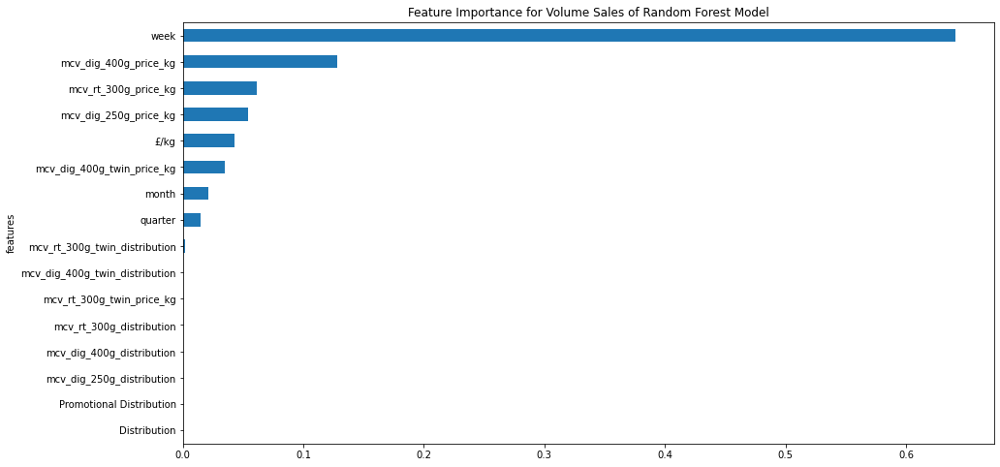

<Figure size 432x288 with 0 Axes>

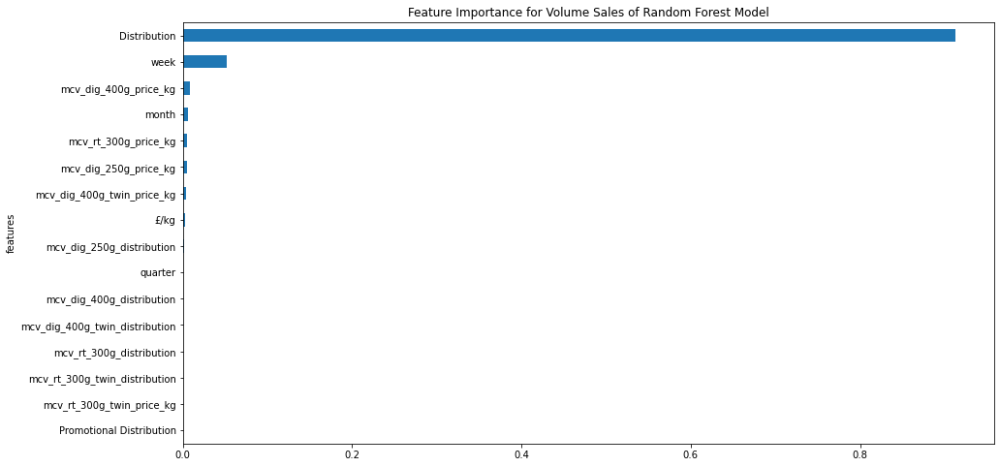

<Figure size 432x288 with 0 Axes>

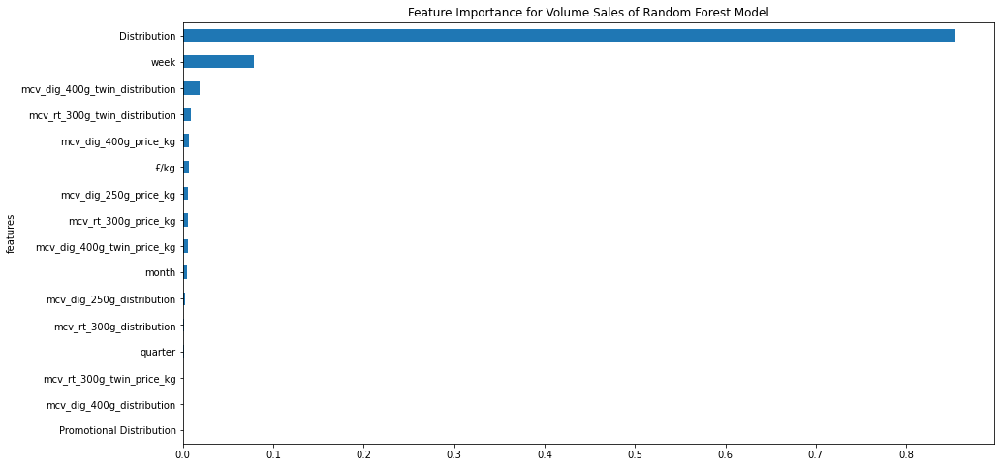

<Figure size 432x288 with 0 Axes>

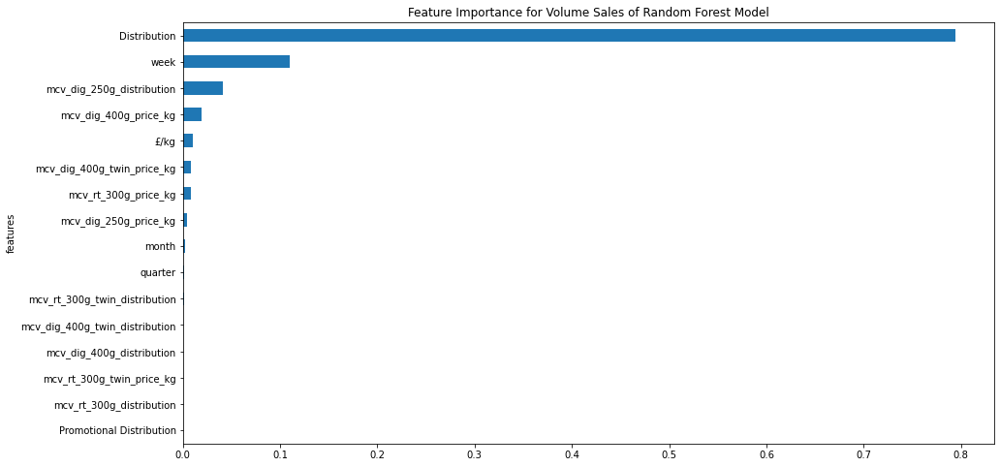

<Figure size 432x288 with 0 Axes>

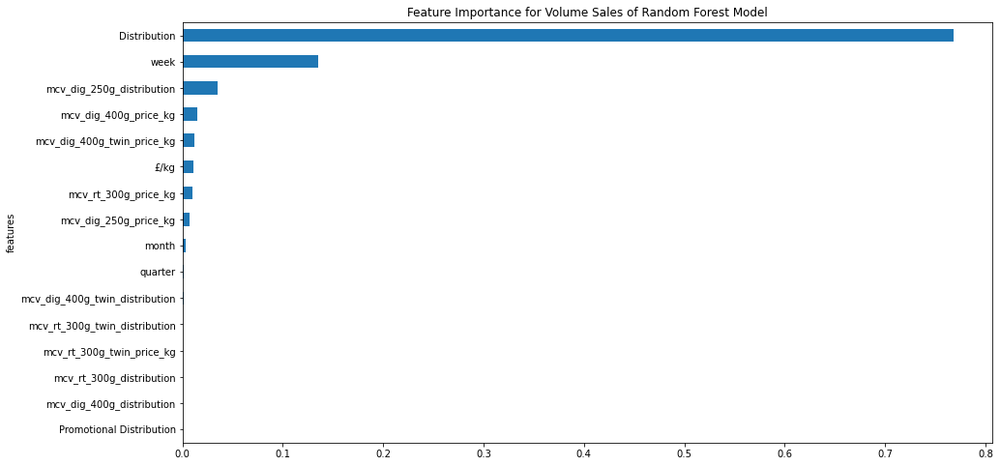

<Figure size 432x288 with 0 Axes>

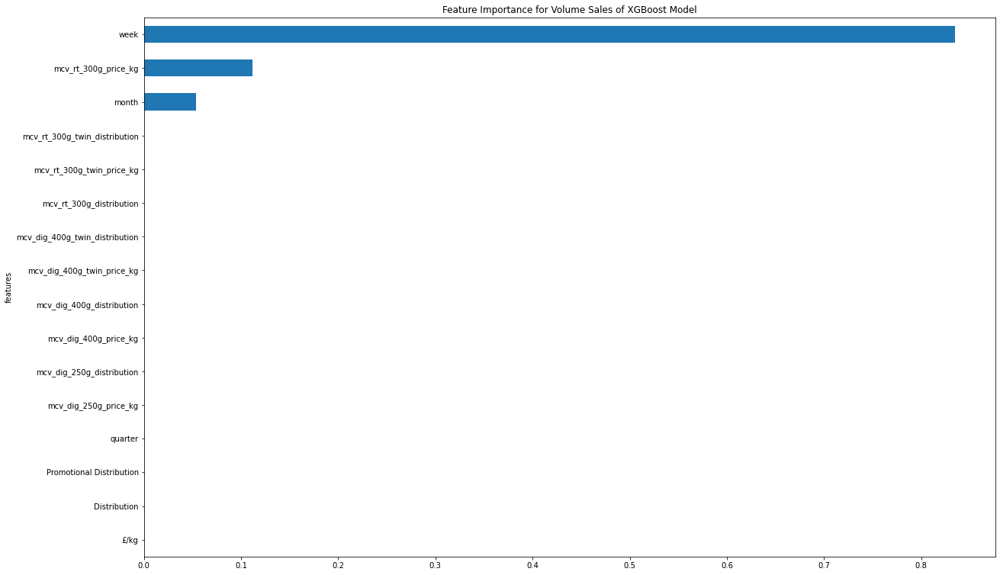

<Figure size 432x288 with 0 Axes>

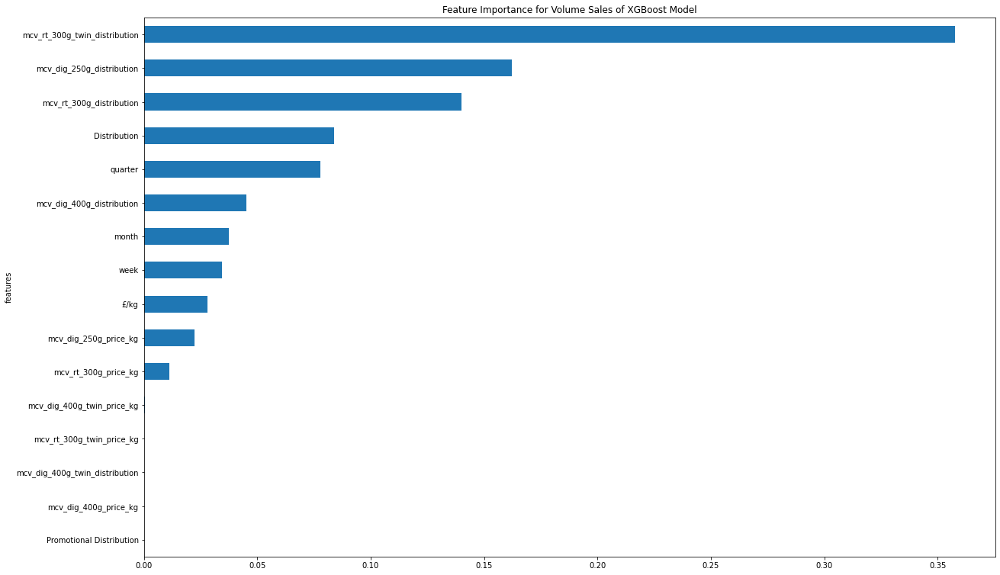

<Figure size 432x288 with 0 Axes>

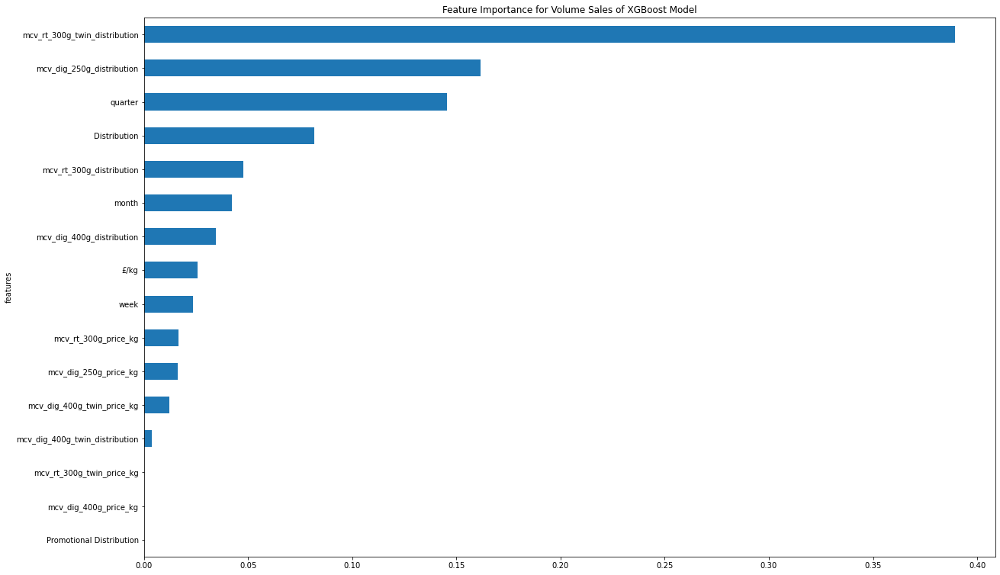

<Figure size 432x288 with 0 Axes>

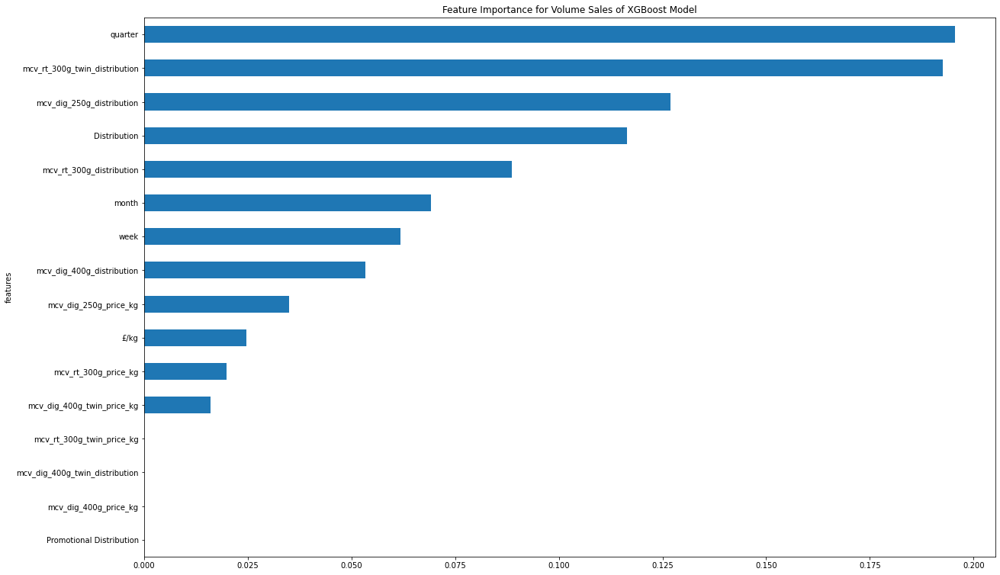

<Figure size 432x288 with 0 Axes>

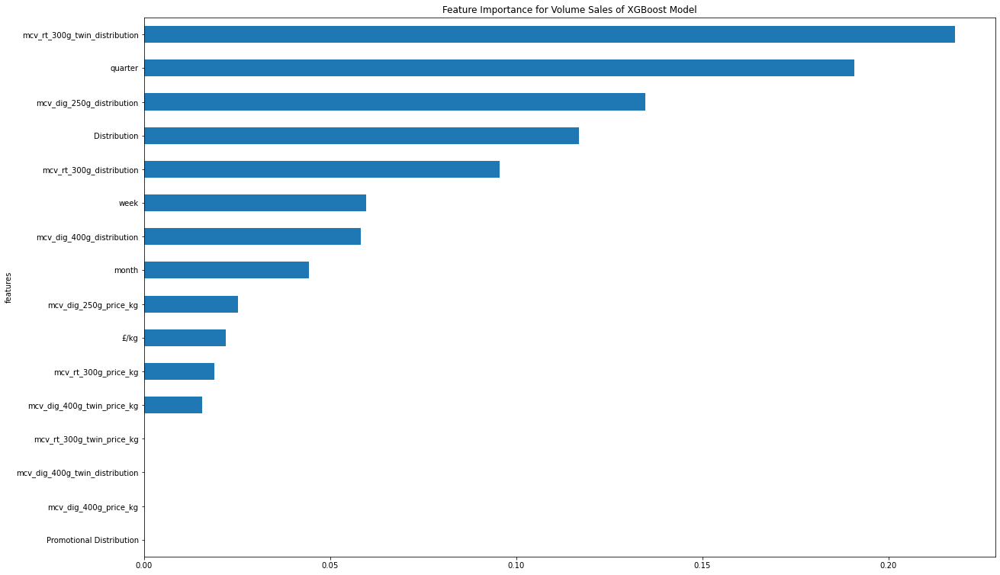

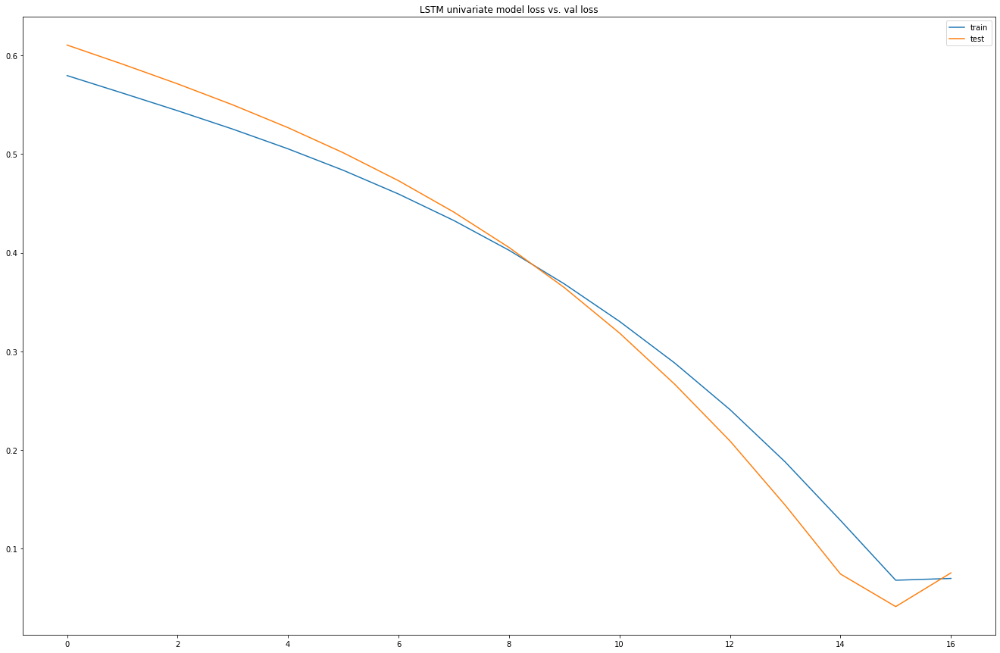

Test RMSE: 2159.554


,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t)
Date,,,,,,,,,,,,,,
2014-12-20,13594.5,2.000897,98.0,0.0,12.0,4.0,50.0,12849.5,2.000794,98,0,12,4,51
2014-12-27,12849.5,2.000794,98.0,0.0,12.0,4.0,51.0,8820.3,2.000896,98,0,12,4,52
2015-01-03,8820.3,2.000896,98.0,0.0,12.0,4.0,52.0,8919.3,2.000998,98,0,1,1,1
2015-01-10,8919.3,2.000998,98.0,0.0,1.0,1.0,1.0,12154.8,2.001020,98,0,1,1,2
2015-01-17,12154.8,2.001020,98.0,0.0,1.0,1.0,2.0,13175.5,2.000934,98,0,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,15978.5,2.241456,100.0,0.0,2.0,1.0,6.0,15888.8,2.241447,100,0,2,1,7
2020-02-22,15888.8,2.241447,100.0,0.0,2.0,1.0,7.0,15479.0,2.241482,100,0,2,1,8
2020-02-29,15479.0,2.241482,100.0,0.0,2.0,1.0,8.0,16310.8,2.241656,100,0,2,1,9


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.574974   0.655917       0.98        0.0        1.0        1.0   
2   0.543464   0.655769       0.98        0.0        1.0        1.0   
3   0.373044   0.655915       0.98        0.0        1.0        1.0   
4   0.377231   0.656060       0.98        0.0        0.0        0.0   
5   0.514080   0.656092       0.98        0.0        0.0        0.0   

   var7(t-1)   var1(t)  
1   0.942308  0.543464  
2   0.961538  0.373044  
3   0.980769  0.377231  
4   0.000000  0.514080  
5   0.019231  0.557252  
(219, 1, 7) (219,) (55, 1, 7) (55,)
Train on 219 samples, validate on 55 samples
Epoch 1/50
219/219 - 6s - loss: 0.5757 - val_loss: 0.5918
Epoch 2/50
219/219 - 0s - loss: 0.5424 - val_loss: 0.5526
Epoch 3/50
219/219 - 0s - loss: 0.5077 - val_loss: 0.5098
Epoch 4/50
219/219 - 0s - loss: 0.4696 - val_loss: 0.4612
Epoch 5/50
219/219 - 0s - loss: 0.4261 - val_loss: 0.4045
Epoch 6/50
219/219 - 0s - loss: 0.3753 - val_loss: 0

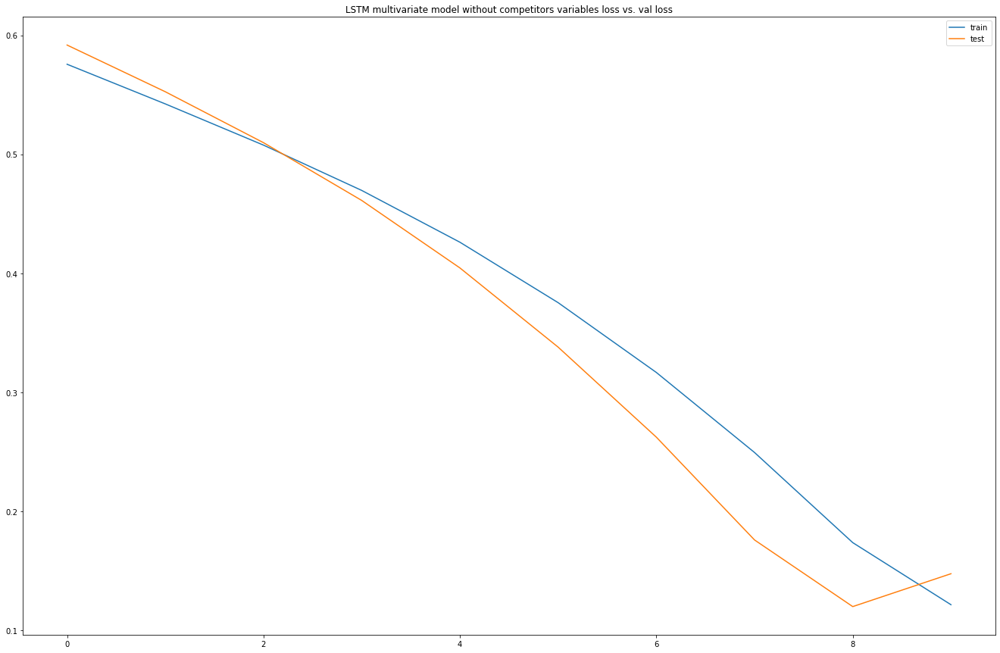

Test RMSE: 4444.087


In [122]:
#ml models
tes_rt_250g_input_X,tes_rt_250g_input_Y=input_var_tesco(tes_rt_250g_with_comp)
rf_regressor_tesco(tes_rt_250g_input_X,tes_rt_250g_input_Y)

tes_rt_250g_input_X,tes_rt_250g_input_Y=input_var_tesco(tes_rt_250g_with_comp)
xgb_regressor_tesco(tes_rt_250g_input_X,tes_rt_250g_input_Y)

#lstm models
series_to_supervised(tes_rt_250g_volume)
lstm_univariate(tes_rt_250g_volume)

series_to_supervised(tes_rt_250g_own_variable)
multivariate_lstm_without_competitor(tes_rt_250g_own_variable)


In [123]:
def multivariate_with_competitor(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model with competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t),var17(t)
Date,,,,,,,,,,,,,,,,,,,,,
2014-12-20,13594.5,2.000897,98.0,0.0,12.0,4.0,50.0,3.560262,97.0,2.032399,...,3.560043,97,2.033989,100,1.889613,96,3.386913,100,3.15,96
2014-12-27,12849.5,2.000794,98.0,0.0,12.0,4.0,51.0,3.560043,97.0,2.033989,...,3.560118,97,2.042324,100,1.889703,96,3.399665,100,3.15,96
2015-01-03,8820.3,2.000896,98.0,0.0,12.0,4.0,52.0,3.560118,97.0,2.042324,...,3.560110,97,2.040269,100,1.889601,96,3.396514,100,3.15,96
2015-01-10,8919.3,2.000998,98.0,0.0,1.0,1.0,1.0,3.560110,97.0,2.040269,...,3.559761,97,2.039523,100,1.889689,96,3.396960,100,3.15,96
2015-01-17,12154.8,2.001020,98.0,0.0,1.0,1.0,2.0,3.559761,97.0,2.039523,...,3.556789,97,2.040478,100,1.889442,96,3.398573,100,3.15,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,15978.5,2.241456,100.0,0.0,2.0,1.0,6.0,3.999605,58.0,2.977072,...,3.999050,58,2.977519,100,2.487499,98,3.967342,100,3.32,98
2020-02-22,15888.8,2.241447,100.0,0.0,2.0,1.0,7.0,3.999050,58.0,2.977519,...,3.999678,58,2.977555,100,2.487350,98,3.963619,100,3.32,98
2020-02-29,15479.0,2.241482,100.0,0.0,2.0,1.0,8.0,3.999678,58.0,2.977555,...,3.998827,58,2.977099,100,2.487354,98,3.960884,100,3.32,98


   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var6(t-1)  \
1   0.574974   0.655917       0.98        0.0        1.0        1.0   
2   0.543464   0.655769       0.98        0.0        1.0        1.0   
3   0.373044   0.655915       0.98        0.0        1.0        1.0   
4   0.377231   0.656060       0.98        0.0        0.0        0.0   
5   0.514080   0.656092       0.98        0.0        0.0        0.0   

   var7(t-1)  var8(t-1)  var9(t-1)  var10(t-1)  var11(t-1)  var12(t-1)  \
1   0.942308   0.227363   0.951219    0.409722         1.0    0.298082   
2   0.961538   0.226979   0.951219    0.410715         1.0    0.298052   
3   0.980769   0.227110   0.951219    0.415920         1.0    0.298098   
4   0.000000   0.227096   0.951219    0.414637         1.0    0.298046   
5   0.019231   0.226483   0.951219    0.414171         1.0    0.298091   

   var13(t-1)  var14(t-1)  var15(t-1)  var16(t-1)  var17(t-1)   var1(t)  
1    0.973333    0.299385    1.000001    0.792683    0

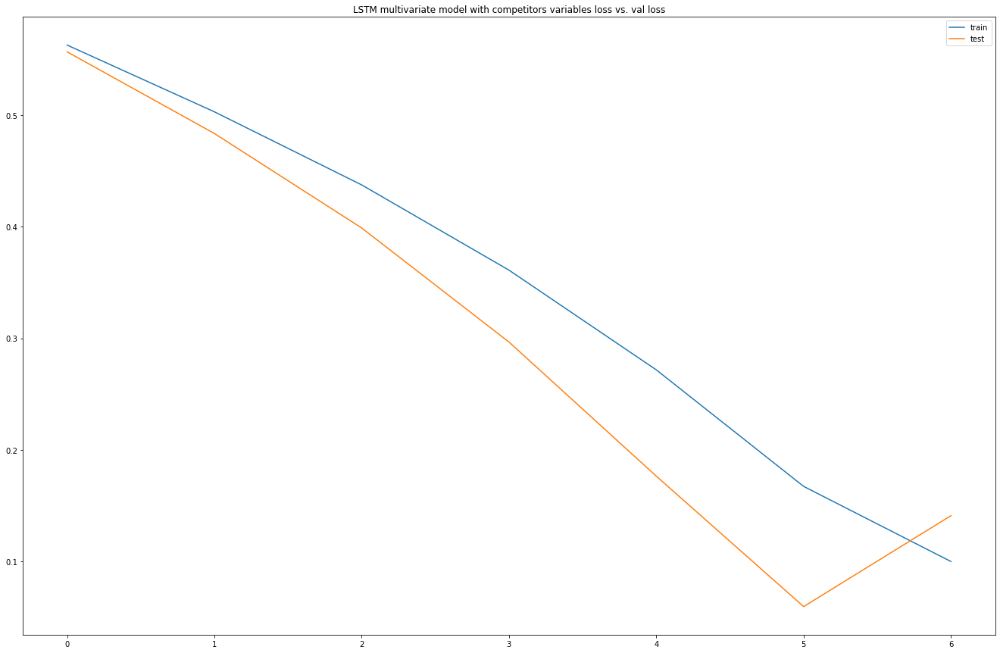

Test RMSE: 3884.926


In [124]:
series_to_supervised(tes_rt_250g_with_comp)
multivariate_with_competitor(tes_rt_250g_with_comp)

### 这里以上都整理完了

In [125]:
# #数据的突变点
# from fbprophet.plot import add_changepoints_to_plot
# fig = model_holiday.plot(forecast_holiday)
# a = add_changepoints_to_plot(fig.gca(), model_holiday, forecast_holiday)

In [126]:
# # cross validation (不要)
# from fbprophet.diagnostics import cross_validation
# df_cv = cross_validation(model_holiday, horizon = '180 days')
# df_cv.head()


In [127]:
# from fbprophet.diagnostics import performance_metrics
# df_p = performance_metrics(df_cv)
# df_p.head()

In [128]:
# from fbprophet.plot import plot_cross_validation_metric
# fig = plot_cross_validation_metric(df_cv, metric='mape')


# Tesco Express

In [129]:
# #import dataset - pladis products
# mcv_dig_250g=pd.read_excel("Tesco Large/Tesco Large MCVTS DGSTVS 250G SNGL.xlsx")
# mcv_dig_400g=pd.read_excel("Tesco others/new-Tesco Large MCVTS DGSTVS 400G SNGL.xlsx")
# mcv_dig_400g_twin=pd.read_excel("Tesco others/new-Tesco Large MCVTS DGSTVS 400G 2PACK.xlsx")
# mcv_rt_300g=pd.read_excel("Tesco Large/Tesco Large RCH T MCVTS RCH T PLN 300 GM SNGL.xlsx")
# mcv_rt_300g_twin=pd.read_excel("Tesco Large/Tesco Large RCH T MCVTS RCH T PLN 300 GM 2 PCK.xlsx")

# #import dataset - competitors products
# tes_dig_400g=pd.read_excel("Tesco Large/Tesco Large (own label) TSC DGSTVS PLN 400 GM SNGL.xlsx")
# tes_molly_400g=pd.read_excel("Tesco Large/missing - Tesco Large (own label) 'TSC-MS-MLL'S-DGSTV-BSCTS PLN 400 GM SNGL.xlsx")
# tes_rt_250g=pd.read_excel("Tesco Large/Tesco Large (own label) RCH T TSC RCH T FNGRS PLN 250 GM SNGL.xlsx")
# tes_rt_300g=pd.read_excel("Tesco Large/missing - Tesco Large (own label) RCH T TSC RCH T PLN 300 GM SNGL.xlsx")



In [130]:
# #feature importance value
# df_featImp.sort_values('importance', ascending=False).reset_index(drop=True).head(15)


NameError: name 'df_featImp' is not defined